In [102]:
import numpy as np
import scipy.io
import os
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import statistics as st
import seaborn as sns
import scipy.stats as stats
from sklearn.metrics import roc_auc_score as auROC
from sklearn.metrics import roc_curve, auc
import sklearn.metrics as ms
import random
from matplotlib.ticker import FormatStrFormatter
from matplotlib.ticker import MaxNLocator
from matplotlib import gridspec
import psutil
import multiprocessing
import glob
import re
import shutil

import pickle
from matplotlib.patches import Patch
import subprocess
import time
import math
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC, SVR, LinearSVC
from sklearn.metrics import accuracy_score, silhouette_score, adjusted_rand_score, silhouette_samples
from sklearn.cluster import AgglomerativeClustering, SpectralClustering, KMeans
from sklearn.model_selection import KFold, LeaveOneOut, train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.kernel_ridge import KernelRidge
from sklearn import linear_model
from sklearn.manifold import TSNE
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
from patsy import (ModelDesc, EvalEnvironment, Term, EvalFactor, LookupFactor, dmatrices, INTERCEPT)
from statsmodels.distributions.empirical_distribution import ECDF
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.colorbar as colorbar
from matplotlib.lines import Line2D
import matplotlib.patches as patches
from matplotlib.colors import rgb_to_hsv, hsv_to_rgb


import sys
from concurrent.futures import ProcessPoolExecutor
import itertools


In [2]:
import matplotlib as mpl
plt.rcParams['font.family'] = 'Liberation Sans'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['text.color'] = 'k'
plt.rcParams['svg.fonttype'] = 'none'


In [4]:
minian_cross = '/scratch/09117/xz6783/Xu/PL_miniscope/PL/Analysis/Cross_regist/Satiation_vs_conflict/minian_cross'
cell_reg = '/scratch/09117/xz6783/Xu/PL_miniscope/PL/Analysis/Cross_regist/Satiation_vs_conflict/cell_reg'

In [5]:
conflict_dir = '/scratch/09117/xz6783/Xu/PL_miniscope/PL/Analysis/Cat_Odor_Conflict/Conflict/extracted_data/Calcium/'
satiation_dir = '/scratch/09117/xz6783/Xu/PL_miniscope/PL/Analysis/Satiation/extracted_data/Calcium/'
conflict_output_dir = '/scratch/09117/xz6783/Xu/PL_miniscope/PL/Analysis/Cat_Odor_Conflict/Conflict/analysis_output'
satiation_output_dir = '/scratch/09117/xz6783/Xu/PL_miniscope/PL/Analysis/Satiation/analysis_output'

FR = 20
CueN = 12
BinSize = 6
TimeRange_before = 10
TimeRange_after = 10
Baseline_range = 10
# Cueduration = 15
CompareRange_base = 0.5
CompareRange_after = 1.5

FrameRange_before = int(FR*TimeRange_before)
FrameRange_after = int(FR*TimeRange_after)
FrameRange_baseline = int(FR*Baseline_range)
TotalFrame = int(FrameRange_before+FrameRange_after)
Bins = int(TotalFrame/BinSize)
Bins_before = int(FrameRange_before/BinSize)
Baseline_bins = Bins_before - int(FrameRange_baseline/BinSize)
# Bins_cueend = Bins_before+int(FR*Cueduration/BinSize)

In [9]:
def read_pkl_files(base_dir):
    dataframes = []
    pkl_files = [file for file in os.listdir(base_dir) if file.endswith('.pkl')]

    for pkl_file in pkl_files:
        file_path = os.path.join(base_dir, pkl_file)
        df = pd.read_pickle(file_path)

        # Reset index and use the original index as 'cell_id'
        df.reset_index(inplace=True)
        df.rename(columns={'index': 'cell_id'}, inplace=True)
        
        # Extract animal ID from filename (assuming format 'AnimalID.pkl')
        animal_id = pkl_file.split('.')[0]
        
        # Add animal ID as a new column
        df['Animal_ID'] = animal_id

        # Reorder columns to make 'Animal_ID' front
        columns = ['Animal_ID', 'cell_id'] + [col for col in df.columns if col not in ['Animal_ID', 'cell_id']]
        df = df[columns]

        dataframes.append(df)

    return dataframes



In [10]:
conflict_dataframes = read_pkl_files(conflict_dir)
satiation_dataframes = read_pkl_files(satiation_dir)

## calculate zscore

In [11]:
def calculate_traces_zscore(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=None):
    # Identifying cue onsets
    cue = df[df['cell_id'] == 'Tone active'].iloc[:, 2:].squeeze()
    cueonset = np.array(np.where(np.diff(np.concatenate(([0], cue > 0))) > 0)[0])
    if cue_range is not None:
        # Select a subset of cueonset based on cue_range
        cueonset = cueonset[cue_range[0]:cue_range[1]]
    
    # Select rows where 'cell_id' is numeric and columns from the third column onwards
    trace = df[df['cell_id'].astype(str).str.isnumeric()].iloc[:, 2:]

    tracenew = pd.DataFrame(0, index=trace.index, columns=np.arange(TotalFrame))

    # Aligning traces based on cue onset
    for i in range(TotalFrame):
        start = cueonset - FrameRange_before + i
        valid_starts = start[start >= 0]  # Ensure start is not negative
        tracenew.iloc[:, i] = trace.iloc[:, valid_starts].mean(axis=1)

    # Bin the traces
    tracebin = tracenew.groupby(pd.cut(tracenew.columns, Bins), axis=1).mean()
    tracebin.columns = np.arange(0, Bins)
    
    # Calculate the mean and std, handle the situation of 0 std
    mean_vals = tracebin.iloc[:, Baseline_bins:Bins_before].mean(axis=1)
    std_vals = tracebin.iloc[:, Baseline_bins:Bins_before].std(axis=1)
    
    # Create a mask where the mean is < 0.001 or std is < 0.001
    low_variance_mask = (std_vals < 0.001) #(mean_vals < 0.001) | (std_vals < 0.001)
    
    # Replace std values that are 0 with NaN, as well as where the mean is < 0.001
    std_vals_replaced = std_vals.mask(low_variance_mask, np.nan)
    
    # Calculate z-scores, NaN will result in the z-scores where std is zero
    tracezscore = tracebin.sub(mean_vals, axis=0).divide(std_vals_replaced, axis=0)
    
    # Replace NaN z-scores with 0, as these are the ones with std of 0
    tracezscore = tracezscore.fillna(0)

    return tracebin, tracezscore

def calculate_traces_zscore_satiation(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=None):
    # Identifying cue onsets
    cue = df[df['cell_id'] == 'Tone active'].iloc[:, 2:].squeeze()
    cueonset = np.array(np.where(np.diff(np.concatenate(([0], cue > 0))) > 0)[0])
    if cue_range is not None:
        # Select a subset of cueonset based on cue_range
        if cue_range>0:
            cueonset = cueonset[:cue_range]
        elif cue_range<0:
            cueonset = cueonset[cue_range:]
            
    # Select rows where 'cell_id' is numeric and columns from the third column onwards
    trace = df[df['cell_id'].astype(str).str.isnumeric()].iloc[:, 2:]

    tracenew = pd.DataFrame(0, index=trace.index, columns=np.arange(TotalFrame))

    # Aligning traces based on cue onset
    for i in range(TotalFrame):
        start = cueonset - FrameRange_before + i
        valid_starts = start[start >= 0]  # Ensure start is not negative
        tracenew.iloc[:, i] = trace.iloc[:, valid_starts].mean(axis=1)

    # Bin the traces
    tracebin = tracenew.groupby(pd.cut(tracenew.columns, Bins), axis=1).mean()
    tracebin.columns = np.arange(0, Bins)
    
    # Calculate the mean and std, handle the situation of 0 std
    mean_vals = tracebin.iloc[:, Baseline_bins:Bins_before].mean(axis=1)
    std_vals = tracebin.iloc[:, Baseline_bins:Bins_before].std(axis=1)
    
    # Create a mask where the mean is < 0.001 or std is < 0.001
    low_variance_mask = (std_vals < 0.001) #(mean_vals < 0.001) | (std_vals < 0.001)
    
    # Replace std values that are 0 with NaN, as well as where the mean is < 0.001
    std_vals_replaced = std_vals.mask(low_variance_mask, np.nan)
    
    # Calculate z-scores, NaN will result in the z-scores where std is zero
    tracezscore = tracebin.sub(mean_vals, axis=0).divide(std_vals_replaced, axis=0)
    
    # Replace NaN z-scores with 0, as these are the ones with std of 0
    tracezscore = tracezscore.fillna(0)

    return tracebin, tracezscore

In [12]:
safecue = (0, 12)

# Create a list to hold the dataframes
trace_safe_list = []
trace_safe_list_c = []

# Loop through each animal's DataFrame
for df in conflict_dataframes:
    animal_id = df['Animal_ID'].iloc[0]  # Extract animal ID
    cell_ids = df['cell_id'].astype(str)  # Extract cell IDs

    tracebin, tracesub = calculate_traces_zscore(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=safecue)
    tracesub['Animal_ID'] = animal_id  # Add animal ID
    tracesub['Conflict_cell_id'] = cell_ids  # Add cell IDs
    tracebin['Animal_ID'] = animal_id  # Add animal ID
    tracebin['Conflict_cell_id'] = cell_ids  # Add cell IDs
    
    # Reorder columns to make 'Animal_ID' front
    columns = ['Animal_ID', 'Conflict_cell_id'] + [col for col in tracesub.columns if col not in ['Animal_ID', 'Conflict_cell_id']]
    tracesub = tracesub[columns]
    columns = ['Animal_ID', 'Conflict_cell_id'] + [col for col in tracebin.columns if col not in ['Animal_ID', 'Conflict_cell_id']]
    tracebin = tracebin[columns]
    
    trace_safe_list.append(tracesub)
    trace_safe_list_c.append(tracebin)

# Concatenate all dataframes in the list
trace_safe = pd.concat(trace_safe_list, ignore_index=True)
trace_safe_c = pd.concat(trace_safe_list_c, ignore_index=True)




In [13]:
threatcue = (12, 24)

# Create a list to hold the dataframes
trace_threat_list = []
trace_threat_list_c = []

# Loop through each animal's DataFrame
for df in conflict_dataframes:
    animal_id = df['Animal_ID'].iloc[0]  # Extract animal ID
    cell_ids = df['cell_id'].astype(str)  # Extract cell IDs

    tracebin, tracesub = calculate_traces_zscore(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=threatcue)
    tracesub['Animal_ID'] = animal_id  # Add animal ID
    tracesub['Conflict_cell_id'] = cell_ids  # Add cell IDs
    tracebin['Animal_ID'] = animal_id  # Add animal ID
    tracebin['Conflict_cell_id'] = cell_ids  # Add cell IDs
    
    # Reorder columns to make 'Animal_ID' front
    columns = ['Animal_ID', 'Conflict_cell_id'] + [col for col in tracesub.columns if col not in ['Animal_ID', 'Conflict_cell_id']]
    tracesub = tracesub[columns]
    columns = ['Animal_ID', 'Conflict_cell_id'] + [col for col in tracebin.columns if col not in ['Animal_ID', 'Conflict_cell_id']]
    tracebin = tracebin[columns]
    
    trace_threat_list.append(tracesub)
    trace_threat_list_c.append(tracebin)

# Concatenate all dataframes in the list
trace_threat = pd.concat(trace_threat_list, ignore_index=True)
trace_threat_c = pd.concat(trace_threat_list_c, ignore_index=True)



In [14]:
trace_safe

,Animal_ID,Conflict_cell_id,0,1,2,3,4,5,6,7,...,56,57,58,59,60,61,62,63,64,65
0,2I5,2,1.342322,1.162302,1.136837,1.000644,0.933905,1.184054,1.370346,1.394943,...,-2.208251,-2.159889,-2.185003,-2.214302,-2.242113,-2.268510,-2.293568,-2.317354,-2.339933,-2.363089
1,2I5,1,1.128579,0.823292,0.827280,0.731144,0.460131,0.198854,0.075610,0.232304,...,3.312703,4.085397,4.307891,4.501561,4.247127,3.916514,3.711092,3.340026,2.975290,2.595120
2,2I5,3,0.155123,0.171890,0.196822,0.220236,0.212317,0.122493,0.015067,-0.096074,...,7.027389,6.893478,6.595929,6.289298,5.991125,5.701178,5.419231,5.145063,4.880669,4.615083
3,2I5,4,1.719912,1.420727,1.421969,1.263559,0.996602,0.824549,0.696843,0.688924,...,2.575242,2.480089,2.253444,1.983298,1.948596,1.956932,1.824193,1.541033,1.264854,0.976142
4,2I5,5,2.041279,1.984616,1.859965,1.723649,1.435419,1.144643,0.902086,0.712976,...,-1.142234,-1.388462,-1.630435,-1.813744,-1.971014,-2.167198,-2.121456,-1.980890,-2.078492,-2.177920
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,6H6,58,-0.078331,-0.200967,-0.310131,-0.415486,-0.515568,-0.446239,-0.084228,0.122552,...,-0.215286,-0.266016,-0.329992,-0.376437,-0.391247,-0.264087,0.185919,0.665683,1.030222,1.230001
934,6H6,59,0.881235,0.706043,0.566303,1.028673,1.695628,1.601400,1.422278,1.247458,...,-2.402191,-2.485153,-2.566122,-2.645147,-2.722273,-2.797547,-2.871013,-2.942715,-3.012694,-3.086585
935,6H6,60,-1.308935,-1.421514,-1.522421,-1.620557,-1.715997,-1.808816,-1.793736,-0.539244,...,-2.484067,-2.555790,-2.625543,-2.693380,-2.377100,-1.265447,-1.059916,-1.170756,-1.278550,-1.391946
936,6H6,62,2.186465,1.956415,1.752970,1.557615,1.370028,1.189901,1.016936,0.850850,...,59.519768,57.027308,54.633960,52.335785,50.128996,48.009961,45.975190,44.021332,42.145169,40.197830


938 neurons in Safe


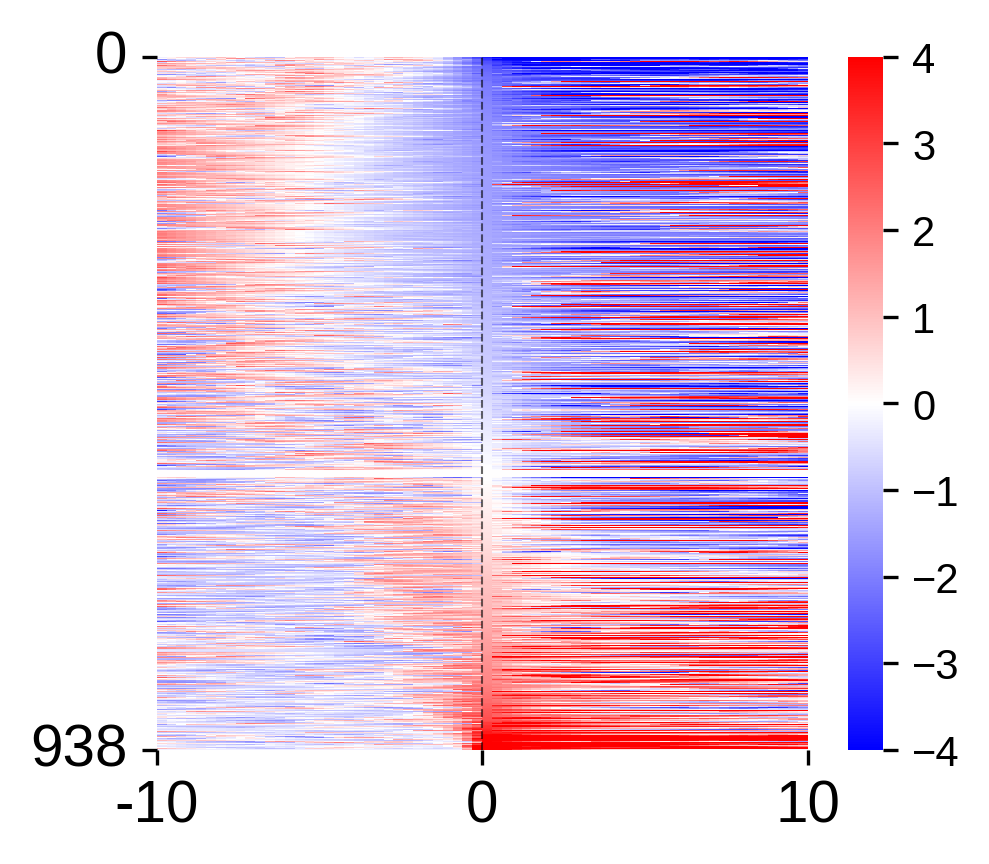

In [15]:
# Sorting and creating the heatmap
tracesorted = trace_safe.sort_values(by=Bins_before, axis=0)
plt.figure(figsize=(3.5,3), dpi=300)
ax = sns.heatmap(tracesorted.iloc[:, 2:], vmin=-4, vmax=4, cmap="bwr")  # Exclude the last two columns (Animal_ID and cell_id)
ax.set_xticks([0, Bins_before, Bins])
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0, len(tracesorted)])
ax.set_yticklabels([0, len(tracesorted)])
ax.tick_params(labelsize = 14)
ax.axvline(Bins_before, ls = '--', lw = 0.5, c = 'black', alpha = 0.6)
print(f"{len(trace_safe)} neurons in Safe")

plt.show()

938 neurons in Threat


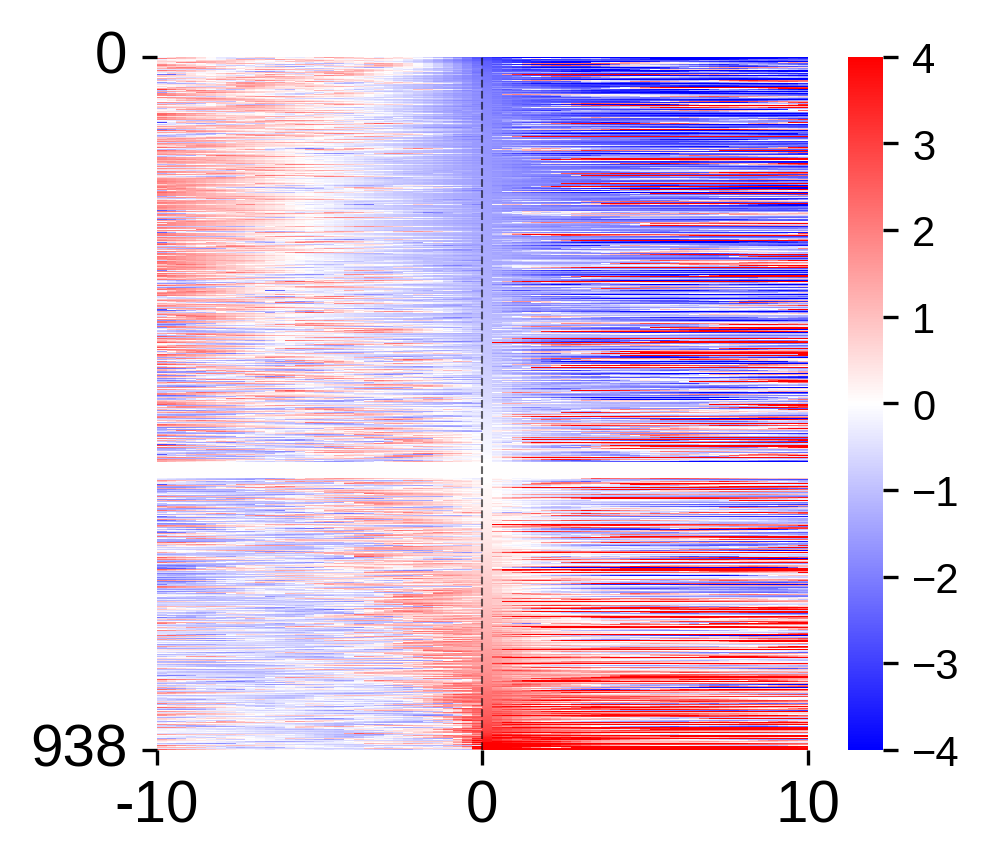

In [16]:
# Sorting and creating the heatmap
tracesorted = trace_threat.sort_values(by=Bins_before, axis=0)
plt.figure(figsize=(3.5,3), dpi=300)
ax = sns.heatmap(tracesorted.iloc[:, 2:], vmin=-4, vmax=4, cmap="bwr")  # Exclude the last two columns (Animal_ID and cell_id)
ax.set_xticks([0, Bins_before, Bins])
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0, len(tracesorted)])
ax.set_yticklabels([0, len(tracesorted)])
ax.tick_params(labelsize = 14)
ax.axvline(Bins_before, ls = '--', lw = 0.5, c = 'black', alpha = 0.6)
print(f"{len(trace_threat)} neurons in Threat")

plt.show()

In [17]:
hungrycue = 12

# Create a list to hold the dataframes
trace_hungry_list = []
trace_hungry_list_c = []

# Loop through each animal's DataFrame
for df in satiation_dataframes:
    animal_id = df['Animal_ID'].iloc[0]  # Extract animal ID
    cell_ids = df['cell_id'].astype(str)  # Extract cell IDs

    tracebin, tracesub = calculate_traces_zscore_satiation(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=hungrycue)
    tracesub['Animal_ID'] = animal_id  # Add animal ID
    tracesub['Satiation_cell_id'] = cell_ids  # Add cell IDs
    tracebin['Animal_ID'] = animal_id  # Add animal ID
    tracebin['Satiation_cell_id'] = cell_ids  # Add cell IDs
    
    # Reorder columns to make 'Animal_ID' front
    columns = ['Animal_ID', 'Satiation_cell_id'] + [col for col in tracesub.columns if col not in ['Animal_ID', 'Satiation_cell_id']]
    tracesub = tracesub[columns]
    columns = ['Animal_ID', 'Satiation_cell_id'] + [col for col in tracebin.columns if col not in ['Animal_ID', 'Satiation_cell_id']]
    tracebin = tracebin[columns]
    
    trace_hungry_list.append(tracesub)
    trace_hungry_list_c.append(tracebin)

# Concatenate all dataframes in the list
trace_hungry = pd.concat(trace_hungry_list, ignore_index=True)
trace_hungry_c = pd.concat(trace_hungry_list_c, ignore_index=True)



In [18]:
satiatedcue = -12

# Create a list to hold the dataframes
trace_satiated_list = []
trace_satiated_list_c = []

# Loop through each animal's DataFrame
for df in satiation_dataframes:
    animal_id = df['Animal_ID'].iloc[0]  # Extract animal ID
    cell_ids = df['cell_id'].astype(str)  # Extract cell IDs

    tracebin, tracesub = calculate_traces_zscore_satiation(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=satiatedcue)
    tracesub['Animal_ID'] = animal_id  # Add animal ID
    tracesub['Satiation_cell_id'] = cell_ids  # Add cell IDs
    tracebin['Animal_ID'] = animal_id  # Add animal ID
    tracebin['Satiation_cell_id'] = cell_ids  # Add cell IDs
    
    # Reorder columns to make 'Animal_ID' front
    columns = ['Animal_ID', 'Satiation_cell_id'] + [col for col in tracesub.columns if col not in ['Animal_ID', 'Satiation_cell_id']]
    tracesub = tracesub[columns]
    columns = ['Animal_ID', 'Satiation_cell_id'] + [col for col in tracebin.columns if col not in ['Animal_ID', 'Satiation_cell_id']]
    tracebin = tracebin[columns]
    
    trace_satiated_list.append(tracesub)
    trace_satiated_list_c.append(tracebin)

# Concatenate all dataframes in the list
trace_satiated = pd.concat(trace_satiated_list, ignore_index=True)
trace_satiated_c = pd.concat(trace_satiated_list_c, ignore_index=True)



1111 neurons in Hungry


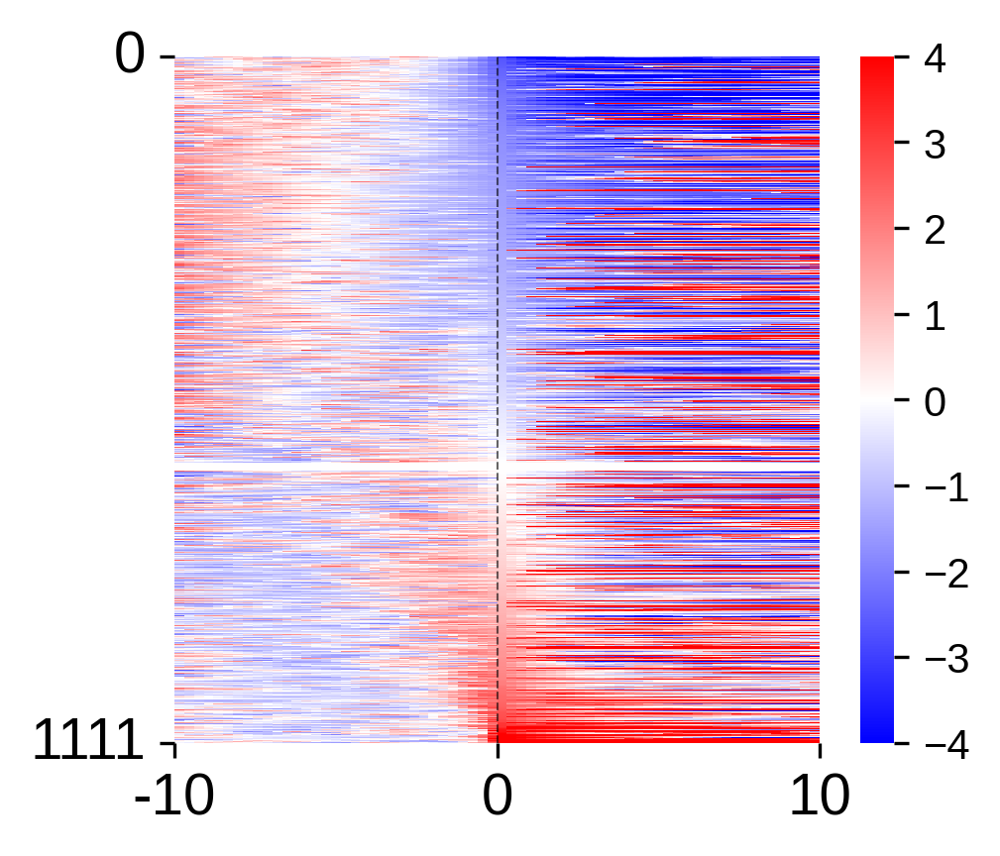

In [19]:
# Sorting and creating the heatmap
tracesorted = trace_hungry.sort_values(by=Bins_before, axis=0)
plt.figure(figsize=(3.5,3), dpi=300)
ax = sns.heatmap(tracesorted.iloc[:, 2:], vmin=-4, vmax=4, cmap="bwr")  # Exclude the last two columns (Animal_ID and cell_id)
ax.set_xticks([0, Bins_before, Bins])
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0, len(tracesorted)])
ax.set_yticklabels([0, len(tracesorted)])
ax.tick_params(labelsize = 14)
ax.axvline(Bins_before, ls = '--', lw = 0.5, c = 'black', alpha = 0.6)
print(f"{len(trace_hungry)} neurons in Hungry")

plt.show()

1111 neurons in Satiation


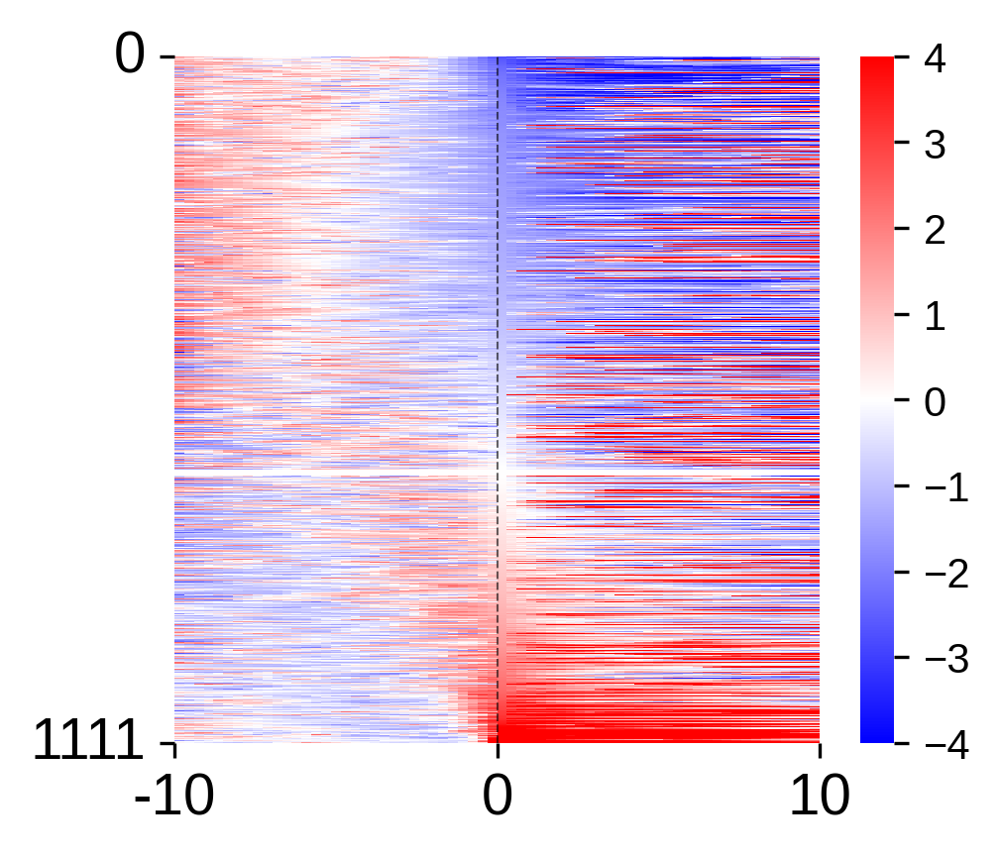

In [20]:
# Sorting and creating the heatmap
tracesorted = trace_satiated.sort_values(by=Bins_before, axis=0)
plt.figure(figsize=(3.5,3), dpi=300)
ax = sns.heatmap(tracesorted.iloc[:, 2:], vmin=-4, vmax=4, cmap="bwr")  # Exclude the last two columns (Animal_ID and cell_id)
ax.set_xticks([0, Bins_before, Bins])
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0, len(tracesorted)])
ax.set_yticklabels([0, len(tracesorted)])
ax.tick_params(labelsize = 14)
ax.axvline(Bins_before, ls = '--', lw = 0.5, c = 'black', alpha = 0.6)
print(f"{len(trace_hungry)} neurons in Satiation")

plt.show()

In [21]:
cross_map_minian_list = []
for i in os.listdir(minian_cross):
    cross_map = pd.read_pickle(os.path.join(minian_cross, i)).dropna().astype(str)
    cross_map.columns = cross_map.columns.droplevel(0)
    animal_id = i.split('_')[0]
    cross_map['Animal_ID'] = animal_id
    columns = ['Animal_ID', 'Conflict', 'Satiation']
    cross_map = cross_map[columns]
    cross_map.columns = ['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id']
    cross_map_minian_list.append(cross_map)

cross_map_minian = pd.concat(cross_map_minian_list, ignore_index=True)

In [22]:
cross_map_minian

,Animal_ID,Conflict_cell_id,Satiation_cell_id
0,5B6,31,26
1,5B6,69,58
2,5B6,-1,-1
3,5B6,54,46
4,5B6,27,29
...,...,...,...
475,6H6,21,-1
476,6H6,36,84
477,6H6,53,109
478,6H6,45,96


In [23]:
trace_safe_cross = pd.merge(trace_safe, cross_map_minian, on=['Animal_ID', 'Conflict_cell_id'])
trace_threat_cross = pd.merge(trace_threat, cross_map_minian, on=['Animal_ID', 'Conflict_cell_id'])
columns = ['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'] + [col for col in trace_safe_cross.columns if col not in ['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id']]
trace_safe_cross = trace_safe_cross[columns]
trace_threat_cross = trace_threat_cross[columns]

In [24]:
trace_hungry_cross = pd.merge(trace_hungry, cross_map_minian, on=['Animal_ID', 'Satiation_cell_id'])
trace_satiated_cross = pd.merge(trace_satiated, cross_map_minian, on=['Animal_ID', 'Satiation_cell_id'])
columns = ['Animal_ID', 'Satiation_cell_id','Conflict_cell_id'] + [col for col in trace_hungry_cross.columns if col not in ['Animal_ID', 'Satiation_cell_id', 'Conflict_cell_id']]
trace_hungry_cross = trace_hungry_cross[columns]
trace_satiated_cross = trace_satiated_cross[columns]

In [25]:
trace_safe_hungry_cross = pd.merge(trace_safe_cross, trace_hungry_cross, 
                                   on=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'])
trace_safe_hungry_cross

,Animal_ID,Conflict_cell_id,Satiation_cell_id,0_x,1_x,2_x,3_x,4_x,5_x,6_x,...,56_y,57_y,58_y,59_y,60_y,61_y,62_y,63_y,64_y,65_y
0,2I5,2,0,1.342322,1.162302,1.136837,1.000644,0.933905,1.184054,1.370346,...,0.751376,0.672645,0.975616,0.882554,1.128024,2.049277,2.004605,1.781959,1.570329,1.758922
1,2I5,3,1,0.155123,0.171890,0.196822,0.220236,0.212317,0.122493,0.015067,...,3.807543,3.647485,3.966040,4.366272,4.978768,5.751394,6.426422,6.522234,6.476618,5.932782
2,2I5,4,6,1.719912,1.420727,1.421969,1.263559,0.996602,0.824549,0.696843,...,2.423370,2.005832,2.082661,3.239616,3.845150,3.858985,3.496786,3.017176,2.546982,2.092496
3,2I5,5,7,2.041279,1.984616,1.859965,1.723649,1.435419,1.144643,0.902086,...,-1.700640,-1.732493,-1.762265,-1.790091,-1.687259,-1.679072,-1.712334,-1.743423,-1.768836,-1.702195
4,2I5,7,8,0.402354,0.399912,0.611994,1.163481,1.765091,1.960733,1.667615,...,-1.802714,-2.028012,-2.214318,-2.351935,-2.614665,-2.727758,-1.971579,-1.232518,-1.278608,-1.412442
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,6H6,53,109,0.248644,0.009553,-0.182388,-0.494130,-0.979175,-1.262419,-0.625317,...,0.458216,0.250431,0.574600,1.790668,2.774145,3.094185,3.472430,3.813622,3.692071,3.375269
391,6H6,55,111,1.581331,1.499169,1.462546,1.453923,1.377270,1.253533,1.130916,...,5.639428,5.192744,4.756312,4.329899,3.913274,3.506212,3.108494,2.722530,2.345225,1.987447
392,6H6,56,117,1.456602,1.100563,0.434716,-0.102588,-0.498485,-0.522251,-0.651552,...,2.892786,3.297050,3.837552,4.494097,5.254345,5.582243,5.308489,5.008756,4.699228,4.472546
393,6H6,58,119,-0.078331,-0.200967,-0.310131,-0.415486,-0.515568,-0.446239,-0.084228,...,-5.665142,-5.667671,-5.547164,-5.153268,-4.865076,-4.746846,-4.471178,-4.390011,-4.391154,-4.380399


In [26]:
valid_combinations = trace_safe_hungry_cross[['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id']]

trace_safe_crossed = pd.merge(trace_safe_cross, valid_combinations, 
                                     on=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'], 
                                     how='inner')
trace_threat_crossed = pd.merge(trace_threat_cross, valid_combinations, 
                                     on=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'], 
                                     how='inner')

trace_hungry_crossed = pd.merge(trace_hungry_cross, valid_combinations, 
                                     on=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'], 
                                     how='inner')
trace_satiated_crossed = pd.merge(trace_satiated_cross, valid_combinations, 
                                     on=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'], 
                                     how='inner')


In [27]:
trace_hungry_crossed = trace_hungry_crossed.sort_values(by=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'], 
                                       ascending=[True, False, False], ignore_index=True)
trace_safe_crossed = trace_safe_crossed.sort_values(by=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'], 
                                       ascending=[True, False, False], ignore_index=True)
trace_threat_crossed = trace_threat_crossed.sort_values(by=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'], 
                                       ascending=[True, False, False], ignore_index=True)
trace_satiated_crossed = trace_satiated_crossed.sort_values(by=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'], 
                                       ascending=[True, False, False], ignore_index=True)

valid_combinations = trace_hungry_crossed[['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id']]
valid_combinations = valid_combinations.reset_index()
valid_combinations

,index,Animal_ID,Conflict_cell_id,Satiation_cell_id
0,0,1H6,53,58
1,1,1H6,53,55
2,2,1H6,44,47
3,3,1H6,36,36
4,4,1S5,66,98
...,...,...,...,...
390,390,9M6,20,29
391,391,9M6,19,27
392,392,9M6,16,15
393,393,9M6,10,8


In [32]:
excited_safe = pd.read_csv(os.path.join(conflict_output_dir, 'Excited_Safe.csv'), index_col=0)
inhibited_safe = pd.read_csv(os.path.join(conflict_output_dir, 'Inhibited_Safe.csv'), index_col=0)
excited_threat = pd.read_csv(os.path.join(conflict_output_dir, 'Excited_Threat.csv'), index_col=0)
inhibited_threat = pd.read_csv(os.path.join(conflict_output_dir, 'Inhibited_Threat.csv'), index_col=0)
excited_safe = excited_safe.rename(columns={excited_safe.columns[1]: 'Conflict_cell_id'})
inhibited_safe = inhibited_safe.rename(columns={inhibited_safe.columns[1]: 'Conflict_cell_id'})
excited_threat = excited_threat.rename(columns={excited_threat.columns[1]: 'Conflict_cell_id'})
inhibited_threat = inhibited_threat.rename(columns={inhibited_threat.columns[1]: 'Conflict_cell_id'})
excited_safe.Conflict_cell_id = excited_safe.Conflict_cell_id.astype(str)
inhibited_safe.Conflict_cell_id = inhibited_safe.Conflict_cell_id.astype(str)
excited_threat.Conflict_cell_id = excited_threat.Conflict_cell_id.astype(str)
inhibited_threat.Conflict_cell_id = inhibited_threat.Conflict_cell_id.astype(str)


In [33]:
excited_hungry = pd.read_csv(os.path.join(satiation_output_dir, 'Excited_Hungry.csv'), index_col=0)
inhibited_hungry = pd.read_csv(os.path.join(satiation_output_dir, 'Inhibited_Hungry.csv'), index_col=0)
excited_satiated = pd.read_csv(os.path.join(satiation_output_dir, 'Excited_Satiated.csv'), index_col=0)
inhibited_satiated = pd.read_csv(os.path.join(satiation_output_dir, 'Inhibited_Satiated.csv'), index_col=0)
excited_hungry = excited_hungry.rename(columns={excited_hungry.columns[1]: 'Satiation_cell_id'})
inhibited_hungry = inhibited_hungry.rename(columns={inhibited_hungry.columns[1]: 'Satiation_cell_id'})
excited_satiated = excited_satiated.rename(columns={excited_satiated.columns[1]: 'Satiation_cell_id'})
inhibited_satiated = inhibited_satiated.rename(columns={inhibited_satiated.columns[1]: 'Satiation_cell_id'})
excited_hungry.Satiation_cell_id = excited_hungry.Satiation_cell_id.astype(str)
inhibited_hungry.Satiation_cell_id = inhibited_hungry.Satiation_cell_id.astype(str)
excited_satiated.Satiation_cell_id = excited_satiated.Satiation_cell_id.astype(str)
inhibited_satiated.Satiation_cell_id = inhibited_satiated.Satiation_cell_id.astype(str)

In [34]:
excited_safe_crossed = pd.merge(excited_safe, valid_combinations, 
                                     on=['Animal_ID', 'Conflict_cell_id'], how = 'inner')
inhibited_safe_crossed = pd.merge(inhibited_safe, valid_combinations, 
                                     on=['Animal_ID', 'Conflict_cell_id'], how = 'inner')
excited_threat_crossed = pd.merge(excited_threat, valid_combinations, 
                                     on=['Animal_ID', 'Conflict_cell_id'], how = 'inner')
inhibited_threat_crossed = pd.merge(inhibited_threat, valid_combinations, 
                                     on=['Animal_ID', 'Conflict_cell_id'], how = 'inner')

columns = ['index', 'Animal_ID', 'Satiation_cell_id','Conflict_cell_id'] + [col for col in excited_safe_crossed.columns if col not in ['index', 'Animal_ID', 'Satiation_cell_id', 'Conflict_cell_id']]
excited_safe_crossed = excited_safe_crossed[columns]
inhibited_safe_crossed = inhibited_safe_crossed[columns]
excited_threat_crossed = excited_threat_crossed[columns]
inhibited_threat_crossed = inhibited_threat_crossed[columns]

In [35]:
excited_hungry_crossed = pd.merge(excited_hungry, valid_combinations, 
                                     on=['Animal_ID', 'Satiation_cell_id'], how = 'inner')
inhibited_hungry_crossed = pd.merge(inhibited_hungry, valid_combinations, 
                                     on=['Animal_ID', 'Satiation_cell_id'], how = 'inner')
excited_satiated_crossed = pd.merge(excited_satiated, valid_combinations, 
                                     on=['Animal_ID', 'Satiation_cell_id'], how = 'inner')
inhibited_satiated_crossed = pd.merge(inhibited_satiated, valid_combinations, 
                                     on=['Animal_ID', 'Satiation_cell_id'], how = 'inner')
columns = ['index', 'Animal_ID', 'Satiation_cell_id','Conflict_cell_id'] + [col for col in excited_hungry_crossed.columns if col not in ['index', 'Animal_ID', 'Satiation_cell_id', 'Conflict_cell_id']]
excited_hungry_crossed = excited_hungry_crossed[columns]
inhibited_hungry_crossed = inhibited_hungry_crossed[columns]
excited_satiated_crossed = excited_satiated_crossed[columns]
inhibited_satiated_crossed = inhibited_satiated_crossed[columns]

In [36]:
excited_safe_crossed_indices = excited_safe_crossed['index']
inhibited_safe_crossed_indices = inhibited_safe_crossed['index']
excited_hungry_crossed_indices = excited_hungry_crossed['index']
inhibited_hungry_crossed_indices = inhibited_hungry_crossed['index']


excited_safe_in_hungry = trace_hungry_crossed.iloc[excited_safe_crossed_indices]
inhibited_safe_in_hungry = trace_hungry_crossed.iloc[inhibited_safe_crossed_indices]
excited_hungry_in_safe = trace_safe_crossed.iloc[excited_hungry_crossed_indices]
inhibited_hungry_in_safe = trace_safe_crossed.iloc[inhibited_hungry_crossed_indices]

In [37]:
excited_safe_crossed

,index,Animal_ID,Satiation_cell_id,Conflict_cell_id,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
0,57,2I5,72,65,0.343585,0.095837,-0.005402,-0.011357,-0.181616,-0.277330,...,0.962751,0.650051,0.342411,0.058090,-0.109020,0.124273,0.351138,0.292985,0.010374,-0.284561
1,107,2I5,142,140,-2.101691,-1.886837,-1.508167,-1.039049,-0.519923,0.245878,...,7.970423,7.612327,7.080406,6.737332,6.825820,7.094482,7.214289,6.918062,6.424709,5.868579
2,94,2I5,164,158,1.443592,1.225093,0.746673,0.389296,0.542245,0.750496,...,13.288875,13.929128,14.259528,14.204870,14.201383,13.783143,12.854280,11.946974,11.068084,10.147389
3,313,6S5,13,25,-1.415102,-1.669023,-1.623826,0.080655,0.403797,0.739345,...,24.184180,23.782470,23.741059,24.206663,24.989141,25.612725,24.867742,23.652024,22.346780,20.894356
4,311,6S5,20,32,0.970396,0.785155,0.539228,0.600788,0.712164,0.535207,...,9.913339,9.564410,9.074245,9.000800,8.886603,8.799540,9.074447,9.696515,9.882769,9.804417
5,26,1S5,4,2,-0.114663,-0.319858,-0.495635,-0.659413,-0.704759,-0.681922,...,3.770470,3.315487,3.239114,2.852734,3.223360,4.885507,4.909724,4.376976,3.880593,3.381480
6,302,6M6,16,104,2.360156,1.981365,1.651622,1.339681,1.044581,0.765413,...,5.610601,6.384272,5.816827,5.280016,4.772187,4.291774,3.837297,4.018421,5.625861,5.100550
7,237,5B6,29,35,0.514047,0.397127,0.060444,-0.257905,-0.558919,-0.843542,...,22.858496,21.298721,19.823881,18.429350,17.110756,15.863964,14.685063,13.570358,12.516351,11.439992


In [38]:
excited_safe_in_hungry

,Animal_ID,Satiation_cell_id,Conflict_cell_id,0,1,2,3,4,5,6,...,56,57,58,59,60,61,62,63,64,65
57,2I5,72,65,-1.408398,-1.131746,-0.723169,-0.006325,0.865085,1.412027,1.703572,...,2.125996,2.227071,1.896983,1.769177,1.496572,1.119234,0.945405,0.693277,0.647275,0.508441
107,2I5,142,140,1.273090,1.579931,1.550774,1.870801,1.626277,1.354398,1.091864,...,3.762182,3.825980,4.062247,4.793488,4.787645,4.510903,4.251682,4.049414,3.694244,3.323417
94,2I5,164,158,-1.648532,-1.774146,-1.527152,-1.474020,-1.577561,-1.555079,-1.532318,...,3.230236,3.354006,3.128998,2.716234,2.341206,1.957169,1.589474,1.277044,0.978616,0.626232
313,6S5,13,25,-0.288806,-0.710974,-0.737251,-0.279189,0.683994,1.409912,0.514317,...,4.352559,3.404175,3.462557,2.558367,2.184381,2.585429,3.101729,2.676781,1.642374,0.323723
311,6S5,20,32,-1.077529,-0.746471,-1.068503,-1.033923,-0.533559,-0.752295,-0.881735,...,-3.038282,-3.164587,-3.398956,-3.563751,-3.692397,-3.455322,-3.602764,-3.986280,-4.170210,-4.361870
26,1S5,4,2,0.109075,0.237577,0.317814,0.252674,0.049710,-0.127874,-0.173309,...,-3.096953,-3.141592,-3.171070,-3.053601,-3.037897,-3.119759,-3.125990,-2.857087,-2.180890,-1.760008
302,6M6,16,104,0.734829,1.504258,1.876925,1.738729,1.715398,1.484771,1.149547,...,9.880340,9.481033,9.145814,8.888512,8.458702,7.976438,7.448965,6.936673,6.481974,6.267093
237,5B6,29,35,-0.058902,-0.195126,-0.012213,0.022040,-0.203849,-0.366123,-0.557064,...,-0.500792,-0.621724,-0.113796,-0.492325,-1.183592,-1.688351,-2.241314,-2.612634,-2.851303,-2.765714


In [39]:
excited_threat_crossed_indices = excited_threat_crossed['index']
inhibited_threat_crossed_indices = inhibited_threat_crossed['index']
excited_satiated_crossed_indices = excited_satiated_crossed['index']
inhibited_satiated_crossed_indices = inhibited_satiated_crossed['index']

excited_threat_in_satiated = trace_satiated_crossed.iloc[excited_threat_crossed_indices]
inhibited_threat_in_stiated= trace_satiated_crossed.iloc[inhibited_threat_crossed_indices]
excited_satiated_in_threat = trace_threat_crossed.iloc[excited_satiated_crossed_indices]
inhibited_satiated_in_threat = trace_threat_crossed.iloc[inhibited_satiated_crossed_indices]

In [40]:
excited_threat_crossed

,index,Animal_ID,Satiation_cell_id,Conflict_cell_id,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
0,92,2I5,17,16,2.481534,2.074550,1.811232,1.665146,1.376327,1.129020,...,5.789402,6.529403,6.726033,6.448686,6.030678,5.559287,5.130656,4.647160,4.224593,4.348211
1,78,2I5,32,34,1.777925,1.225766,0.691375,0.082824,-0.382122,-0.340403,...,2.846900,2.803632,3.292168,4.081088,4.650476,5.010710,4.745584,3.926424,3.200159,2.669804
2,34,2I5,103,93,0.967587,0.719396,0.481782,0.446228,0.456966,0.421262,...,-2.575321,-2.635521,-2.551560,-2.439178,-2.625559,-2.929999,-3.108823,-3.021898,-2.646971,-2.178484
3,315,6S5,19,23,1.408708,0.900656,0.209503,-0.306523,-0.794681,-0.780604,...,11.262332,12.522520,14.397702,15.713554,14.862649,13.622898,13.293331,14.088212,14.673273,14.939509
4,311,6S5,20,32,0.828698,0.428009,0.077794,-0.245709,-0.462298,-0.718573,...,13.748786,12.812568,12.726183,12.120739,11.181551,10.468948,11.095528,11.385717,11.619238,11.114825
5,154,2N6,42,33,-1.364850,-1.451702,-1.220507,-0.877102,0.064784,1.400035,...,0.433357,0.263449,0.102009,-0.051384,-0.197133,-0.335617,-0.467199,-0.592224,-0.711017,-0.831089


In [41]:
excited_threat_in_satiated

,Animal_ID,Satiation_cell_id,Conflict_cell_id,0,1,2,3,4,5,6,...,56,57,58,59,60,61,62,63,64,65
92,2I5,17,16,-2.641151,-0.510419,0.260986,-0.118793,0.802512,0.548164,1.001844,...,0.518945,0.423548,0.949292,1.261290,0.340616,-0.043271,-0.866754,-1.646358,-1.930581,-2.380796
78,2I5,32,34,-1.971661,-1.921304,-1.901345,-1.878902,-1.779598,-1.478783,-0.864700,...,-1.723149,-1.777277,-1.820867,-1.825762,-1.835899,-1.864812,-1.929728,-1.968645,-2.024216,-1.990861
34,2I5,103,93,2.603295,2.139785,1.966768,1.604462,1.220556,0.883609,0.537649,...,0.642978,0.713066,0.714575,0.379855,0.151473,-0.111589,-0.079153,0.157030,0.362489,1.034279
315,6S5,19,23,0.480883,0.274848,-0.292514,-0.826875,-1.169748,-0.916598,-1.175067,...,1.229651,1.626486,1.839075,2.826256,3.094566,2.698140,2.337230,1.665204,1.106700,0.878642
311,6S5,20,32,0.957890,0.833144,0.983897,1.132931,1.555156,1.585337,1.244456,...,0.336002,0.242071,0.330055,0.474727,0.130281,-0.256447,-0.386929,0.098841,0.884078,0.954062
154,2N6,42,33,1.851490,1.454743,1.097187,0.765362,0.498391,0.246591,0.001214,...,-2.497976,-2.747007,-3.013642,-3.277756,-3.535803,-3.784726,-3.934782,-4.075167,-4.229902,-4.450731


In [42]:

excited_safe_mean = excited_safe_crossed.iloc[:,4:].mean(axis=0).astype('float')
excited_safe_sem = excited_safe_crossed.iloc[:,4:].sem(axis=0).astype('float')
inhibited_safe_mean = inhibited_safe_crossed.iloc[:,4:].mean(axis=0).astype('float')
inhibited_safe_sem = inhibited_safe_crossed.iloc[:,4:].sem(axis=0).astype('float')
excited_threat_mean = excited_threat_crossed.iloc[:,4:].mean(axis=0).astype('float')
excited_threat_sem = excited_threat_crossed.iloc[:,4:].sem(axis=0).astype('float')
inhibited_threat_mean = inhibited_threat_crossed.iloc[:,4:].mean(axis=0).astype('float')
inhibited_threat_sem = inhibited_threat_crossed.iloc[:,4:].sem(axis=0).astype('float')


In [43]:
excited_hungry_mean = excited_hungry_crossed.iloc[:,4:].mean(axis=0).astype('float')
excited_hungry_sem = excited_hungry_crossed.iloc[:,4:].sem(axis=0).astype('float')
inhibited_hungry_mean = inhibited_hungry_crossed.iloc[:,4:].mean(axis=0).astype('float')
inhibited_hungry_sem = inhibited_hungry_crossed.iloc[:,4:].sem(axis=0).astype('float')
excited_satiated_mean = excited_satiated_crossed.iloc[:,4:].mean(axis=0).astype('float')
excited_satiated_sem = excited_satiated_crossed.iloc[:,4:].sem(axis=0).astype('float')
inhibited_satiated_mean = inhibited_satiated_crossed.iloc[:,4:].mean(axis=0).astype('float')
inhibited_satiated_sem = inhibited_satiated_crossed.iloc[:,4:].sem(axis=0).astype('float')


In [44]:
excited_threat_in_satiated

,Animal_ID,Satiation_cell_id,Conflict_cell_id,0,1,2,3,4,5,6,...,56,57,58,59,60,61,62,63,64,65
92,2I5,17,16,-2.641151,-0.510419,0.260986,-0.118793,0.802512,0.548164,1.001844,...,0.518945,0.423548,0.949292,1.261290,0.340616,-0.043271,-0.866754,-1.646358,-1.930581,-2.380796
78,2I5,32,34,-1.971661,-1.921304,-1.901345,-1.878902,-1.779598,-1.478783,-0.864700,...,-1.723149,-1.777277,-1.820867,-1.825762,-1.835899,-1.864812,-1.929728,-1.968645,-2.024216,-1.990861
34,2I5,103,93,2.603295,2.139785,1.966768,1.604462,1.220556,0.883609,0.537649,...,0.642978,0.713066,0.714575,0.379855,0.151473,-0.111589,-0.079153,0.157030,0.362489,1.034279
315,6S5,19,23,0.480883,0.274848,-0.292514,-0.826875,-1.169748,-0.916598,-1.175067,...,1.229651,1.626486,1.839075,2.826256,3.094566,2.698140,2.337230,1.665204,1.106700,0.878642
311,6S5,20,32,0.957890,0.833144,0.983897,1.132931,1.555156,1.585337,1.244456,...,0.336002,0.242071,0.330055,0.474727,0.130281,-0.256447,-0.386929,0.098841,0.884078,0.954062
154,2N6,42,33,1.851490,1.454743,1.097187,0.765362,0.498391,0.246591,0.001214,...,-2.497976,-2.747007,-3.013642,-3.277756,-3.535803,-3.784726,-3.934782,-4.075167,-4.229902,-4.450731


In [45]:
excited_safe_in_hungry

,Animal_ID,Satiation_cell_id,Conflict_cell_id,0,1,2,3,4,5,6,...,56,57,58,59,60,61,62,63,64,65
57,2I5,72,65,-1.408398,-1.131746,-0.723169,-0.006325,0.865085,1.412027,1.703572,...,2.125996,2.227071,1.896983,1.769177,1.496572,1.119234,0.945405,0.693277,0.647275,0.508441
107,2I5,142,140,1.273090,1.579931,1.550774,1.870801,1.626277,1.354398,1.091864,...,3.762182,3.825980,4.062247,4.793488,4.787645,4.510903,4.251682,4.049414,3.694244,3.323417
94,2I5,164,158,-1.648532,-1.774146,-1.527152,-1.474020,-1.577561,-1.555079,-1.532318,...,3.230236,3.354006,3.128998,2.716234,2.341206,1.957169,1.589474,1.277044,0.978616,0.626232
313,6S5,13,25,-0.288806,-0.710974,-0.737251,-0.279189,0.683994,1.409912,0.514317,...,4.352559,3.404175,3.462557,2.558367,2.184381,2.585429,3.101729,2.676781,1.642374,0.323723
311,6S5,20,32,-1.077529,-0.746471,-1.068503,-1.033923,-0.533559,-0.752295,-0.881735,...,-3.038282,-3.164587,-3.398956,-3.563751,-3.692397,-3.455322,-3.602764,-3.986280,-4.170210,-4.361870
26,1S5,4,2,0.109075,0.237577,0.317814,0.252674,0.049710,-0.127874,-0.173309,...,-3.096953,-3.141592,-3.171070,-3.053601,-3.037897,-3.119759,-3.125990,-2.857087,-2.180890,-1.760008
302,6M6,16,104,0.734829,1.504258,1.876925,1.738729,1.715398,1.484771,1.149547,...,9.880340,9.481033,9.145814,8.888512,8.458702,7.976438,7.448965,6.936673,6.481974,6.267093
237,5B6,29,35,-0.058902,-0.195126,-0.012213,0.022040,-0.203849,-0.366123,-0.557064,...,-0.500792,-0.621724,-0.113796,-0.492325,-1.183592,-1.688351,-2.241314,-2.612634,-2.851303,-2.765714


In [46]:
excited_safe_in_hungry_mean = excited_safe_in_hungry.iloc[:,3:].mean(axis=0).astype('float')
excited_safe_in_hungry_sem = excited_safe_in_hungry.iloc[:,3:].sem(axis=0).astype('float')
inhibited_safe_in_hungry_mean = inhibited_safe_in_hungry.iloc[:,3:].mean(axis=0).astype('float')
inhibited_safe_in_hungry_sem = inhibited_safe_in_hungry.iloc[:,3:].sem(axis=0).astype('float')
excited_hungry_in_safe_mean = excited_hungry_in_safe.iloc[:,3:].mean(axis=0).astype('float')
excited_hungry_in_safe_sem = excited_hungry_in_safe.iloc[:,3:].sem(axis=0).astype('float')
inhibited_hungry_in_safe_mean = inhibited_hungry_in_safe.iloc[:,3:].mean(axis=0).astype('float')
inhibited_hungry_in_safe_sem = inhibited_hungry_in_safe.iloc[:,3:].sem(axis=0).astype('float')



In [47]:
excited_threat_in_satiated_mean = excited_threat_in_satiated.iloc[:,3:].mean(axis=0).astype('float')
excited_threat_in_satiated_sem = excited_threat_in_satiated.iloc[:,3:].sem(axis=0).astype('float')
inhibited_threat_in_stiated_mean = inhibited_threat_in_stiated.iloc[:,3:].mean(axis=0).astype('float')
inhibited_threat_in_stiated_sem = inhibited_threat_in_stiated.iloc[:,3:].sem(axis=0).astype('float')
excited_satiated_in_threat_mean = excited_satiated_in_threat.iloc[:,3:].mean(axis=0).astype('float')
excited_satiated_in_threat_sem = excited_satiated_in_threat.iloc[:,3:].sem(axis=0).astype('float')
inhibited_satiated_in_threat_mean = inhibited_satiated_in_threat.iloc[:,3:].mean(axis=0).astype('float')
inhibited_satiated_in_threat_sem = inhibited_satiated_in_threat.iloc[:,3:].sem(axis=0).astype('float')



In [48]:
excited_threat_in_satiated

,Animal_ID,Satiation_cell_id,Conflict_cell_id,0,1,2,3,4,5,6,...,56,57,58,59,60,61,62,63,64,65
92,2I5,17,16,-2.641151,-0.510419,0.260986,-0.118793,0.802512,0.548164,1.001844,...,0.518945,0.423548,0.949292,1.261290,0.340616,-0.043271,-0.866754,-1.646358,-1.930581,-2.380796
78,2I5,32,34,-1.971661,-1.921304,-1.901345,-1.878902,-1.779598,-1.478783,-0.864700,...,-1.723149,-1.777277,-1.820867,-1.825762,-1.835899,-1.864812,-1.929728,-1.968645,-2.024216,-1.990861
34,2I5,103,93,2.603295,2.139785,1.966768,1.604462,1.220556,0.883609,0.537649,...,0.642978,0.713066,0.714575,0.379855,0.151473,-0.111589,-0.079153,0.157030,0.362489,1.034279
315,6S5,19,23,0.480883,0.274848,-0.292514,-0.826875,-1.169748,-0.916598,-1.175067,...,1.229651,1.626486,1.839075,2.826256,3.094566,2.698140,2.337230,1.665204,1.106700,0.878642
311,6S5,20,32,0.957890,0.833144,0.983897,1.132931,1.555156,1.585337,1.244456,...,0.336002,0.242071,0.330055,0.474727,0.130281,-0.256447,-0.386929,0.098841,0.884078,0.954062
154,2N6,42,33,1.851490,1.454743,1.097187,0.765362,0.498391,0.246591,0.001214,...,-2.497976,-2.747007,-3.013642,-3.277756,-3.535803,-3.784726,-3.934782,-4.075167,-4.229902,-4.450731


In [49]:
excited_threat_crossed

,index,Animal_ID,Satiation_cell_id,Conflict_cell_id,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
0,92,2I5,17,16,2.481534,2.074550,1.811232,1.665146,1.376327,1.129020,...,5.789402,6.529403,6.726033,6.448686,6.030678,5.559287,5.130656,4.647160,4.224593,4.348211
1,78,2I5,32,34,1.777925,1.225766,0.691375,0.082824,-0.382122,-0.340403,...,2.846900,2.803632,3.292168,4.081088,4.650476,5.010710,4.745584,3.926424,3.200159,2.669804
2,34,2I5,103,93,0.967587,0.719396,0.481782,0.446228,0.456966,0.421262,...,-2.575321,-2.635521,-2.551560,-2.439178,-2.625559,-2.929999,-3.108823,-3.021898,-2.646971,-2.178484
3,315,6S5,19,23,1.408708,0.900656,0.209503,-0.306523,-0.794681,-0.780604,...,11.262332,12.522520,14.397702,15.713554,14.862649,13.622898,13.293331,14.088212,14.673273,14.939509
4,311,6S5,20,32,0.828698,0.428009,0.077794,-0.245709,-0.462298,-0.718573,...,13.748786,12.812568,12.726183,12.120739,11.181551,10.468948,11.095528,11.385717,11.619238,11.114825
5,154,2N6,42,33,-1.364850,-1.451702,-1.220507,-0.877102,0.064784,1.400035,...,0.433357,0.263449,0.102009,-0.051384,-0.197133,-0.335617,-0.467199,-0.592224,-0.711017,-0.831089


In [50]:
excited_safe_mean

0      0.250040
1      0.076107
2     -0.079383
3      0.055337
4      0.092196
        ...    
61    10.056926
62     9.724248
63     9.309039
64     8.969440
65     8.294025
Length: 66, dtype: float64

8

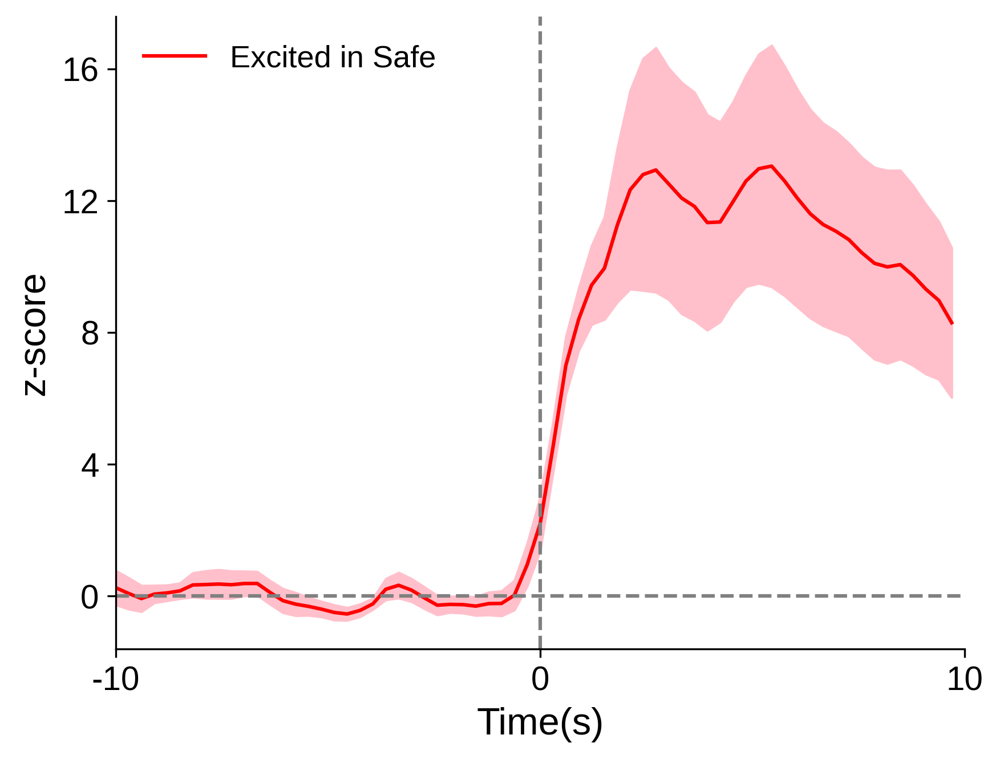

In [51]:
x=np.arange(Bins)
y=excited_safe_mean
err = excited_safe_sem
fig, ax = plt.subplots(dpi = 300)
ax.plot(x, y, label = 'Excited in Safe', color = 'red')
ax.fill_between(x, y-err, y+err, color='pink')
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.tick_params(labelsize = 14)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc = 2, framealpha = 0, fontsize='13')
len(excited_safe_crossed)

9

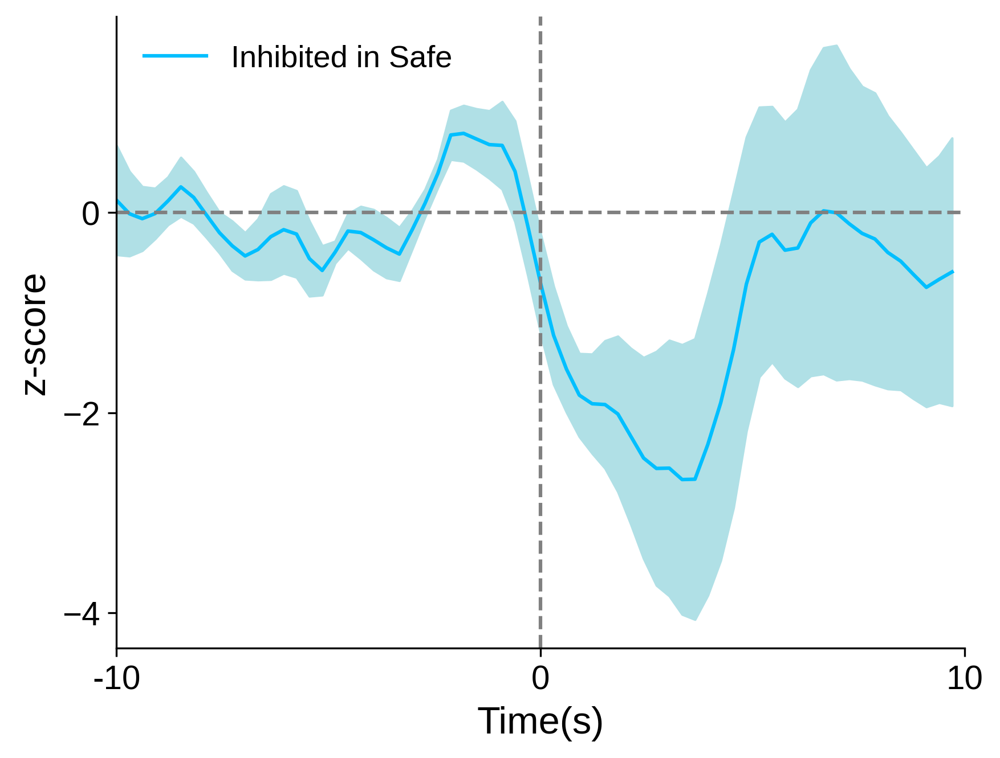

In [52]:
x=np.arange(Bins)
y=inhibited_safe_mean
err = inhibited_safe_sem
fig, ax = plt.subplots(dpi = 300)
ax.plot(x, y, label = 'Inhibited in Safe', color = 'deepskyblue', linestyle = '-')
ax.fill_between(x, y-err, y+err, color='powderblue')
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.tick_params(labelsize = 14)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xticks([0, Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-3.5,2)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_safe_crossed)

[Text(0, 0, '0'), Text(0, 9, '9')]

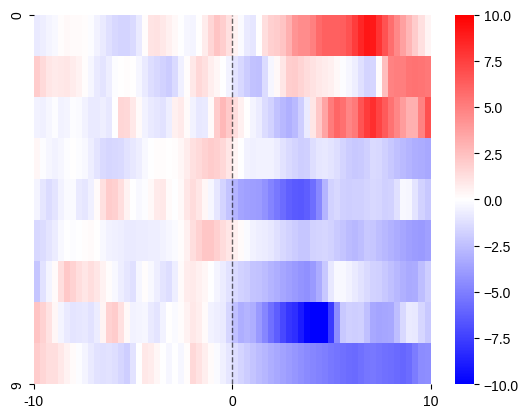

In [53]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
inhibited_safe_sort = inhibited_safe_crossed.copy()
inhibited_safe_sort['count_gt_2'] = (inhibited_safe_sort.iloc[:, Bins_before + 4:].astype('float') < -1.98).sum(axis=1)

# Sort the DataFrame based on this count
inhibited_safe_sorted = inhibited_safe_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sns.heatmap(inhibited_safe_sorted.iloc[:,4:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(inhibited_safe_sorted)])
ax.set_yticklabels([0, len(inhibited_safe_sorted)])

[Text(0, 0, '0'), Text(0, 8, '8')]

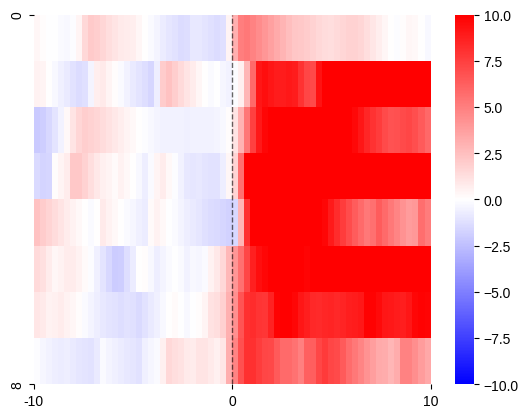

In [54]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
excited_safe_sort = excited_safe_crossed.copy()
excited_safe_sort['count_gt_2'] = (excited_safe_sort.iloc[:, Bins_before + 4:].astype('float') > 1.98).sum(axis=1)

# Sort the DataFrame based on this count
excited_safe_sorted = excited_safe_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sns.heatmap(excited_safe_sorted.iloc[:,4:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(excited_safe_sorted)])
ax.set_yticklabels([0, len(excited_safe_sorted)])

In [55]:
len(np.unique(inhibited_safe_crossed.Animal_ID))

6

In [56]:
len(np.unique(excited_safe_crossed.Animal_ID))

5

In [57]:
excited_threat_mean

0     1.016600
1     0.649446
2     0.341863
3     0.127477
4     0.043163
        ...   
61    5.232705
62    5.114846
63    5.072232
64    5.059879
65    5.010463
Length: 66, dtype: float64

6

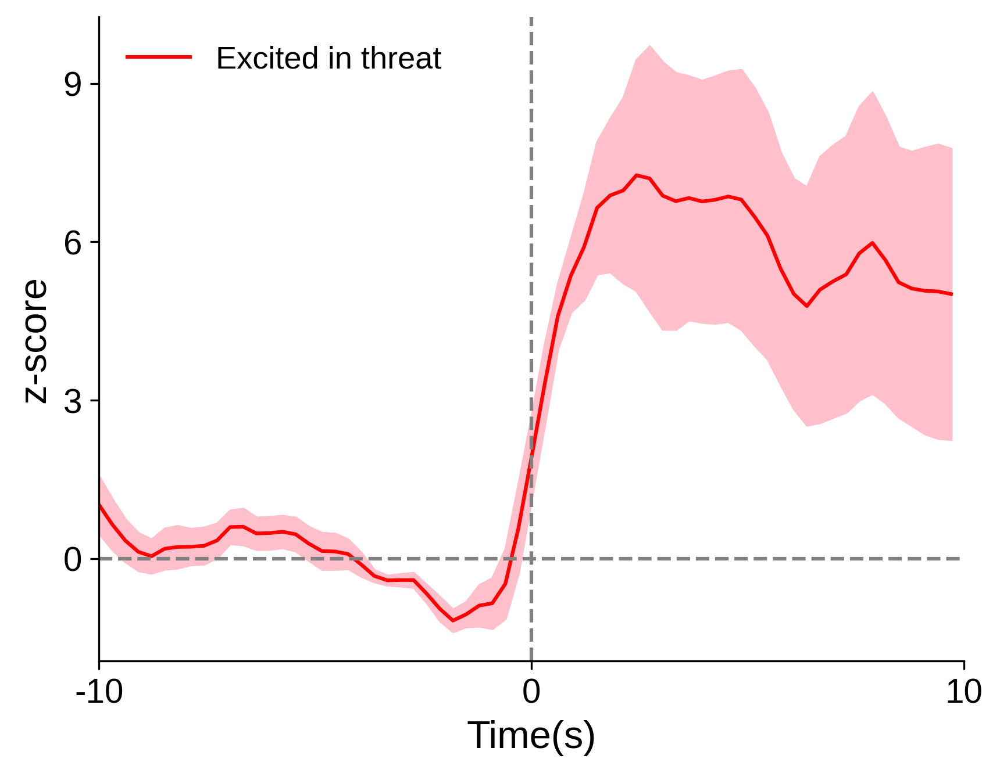

In [58]:
x=np.arange(Bins)
y=excited_threat_mean
err = excited_threat_sem
fig, ax = plt.subplots(dpi = 300)
ax.plot(x, y, label = 'Excited in threat', color = 'red')
ax.fill_between(x, y-err, y+err, color='pink')
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.tick_params(labelsize = 14)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc = 2, framealpha = 0, fontsize='13')
len(excited_threat_crossed)

5

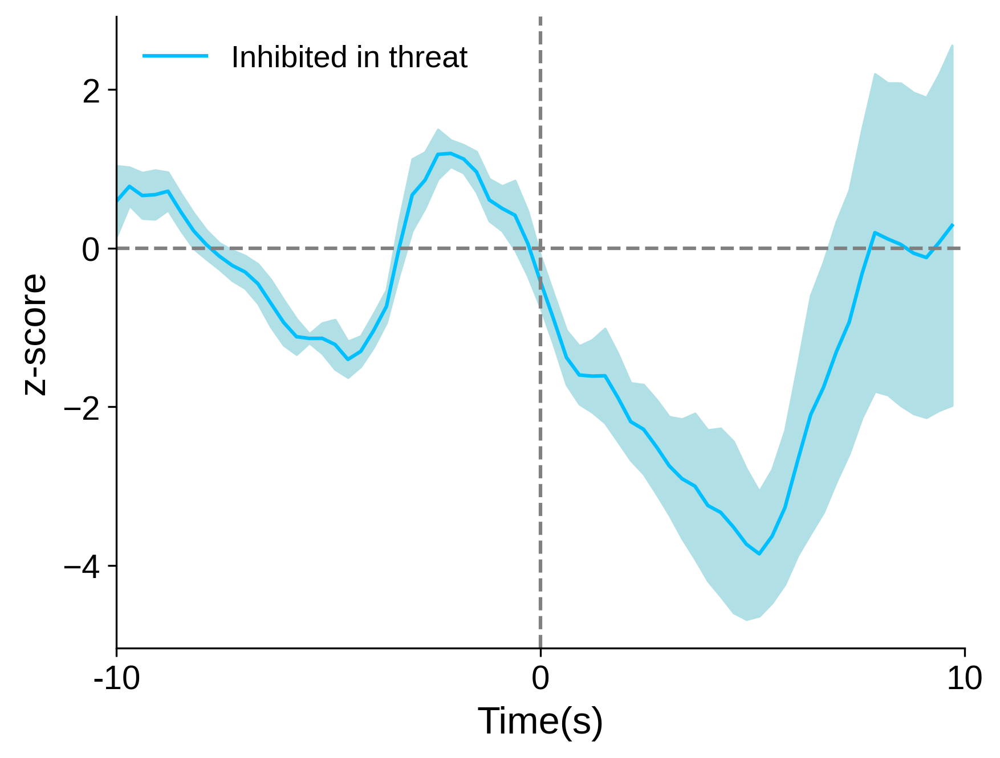

In [59]:
x=np.arange(Bins)
y=inhibited_threat_mean
err = inhibited_threat_sem
fig, ax = plt.subplots(dpi = 300)
ax.plot(x, y, label = 'Inhibited in threat', color = 'deepskyblue', linestyle = '-')
ax.fill_between(x, y-err, y+err, color='powderblue')
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.tick_params(labelsize = 14)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xticks([0, Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-3.5,2)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_threat_crossed)


[Text(0, 0, '0'), Text(0, 5, '5')]

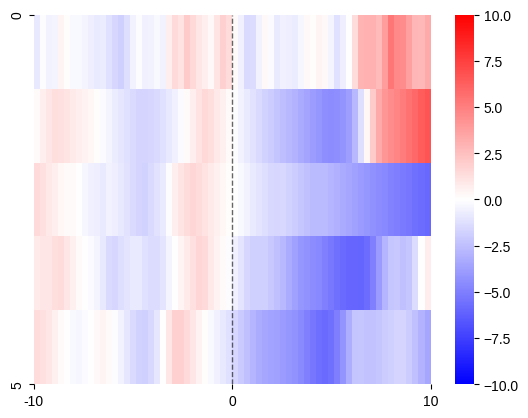

In [60]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
inhibited_threat_sort = inhibited_threat_crossed.copy()
inhibited_threat_sort['count_gt_2'] = (inhibited_threat_sort.iloc[:, Bins_before + 4:].astype('float') < -1.98).sum(axis=1)

# Sort the DataFrame based on this count
inhibited_threat_sorted = inhibited_threat_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sns.heatmap(inhibited_threat_sorted.iloc[:,4:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(inhibited_threat_sorted)])
ax.set_yticklabels([0, len(inhibited_threat_sorted)])

[Text(0, 0, '0'), Text(0, 6, '6')]

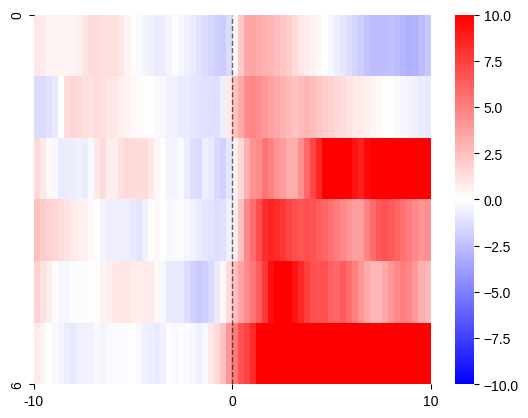

In [61]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
excited_threat_sort = excited_threat_crossed.copy()
excited_threat_sort['count_gt_2'] = (excited_threat_sort.iloc[:, Bins_before + 4:].astype('float') > 1.98).sum(axis=1)

# Sort the DataFrame based on this count
excited_threat_sorted = excited_threat_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sns.heatmap(excited_threat_sorted.iloc[:,4:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(excited_threat_sorted)])
ax.set_yticklabels([0, len(excited_threat_sorted)])

8

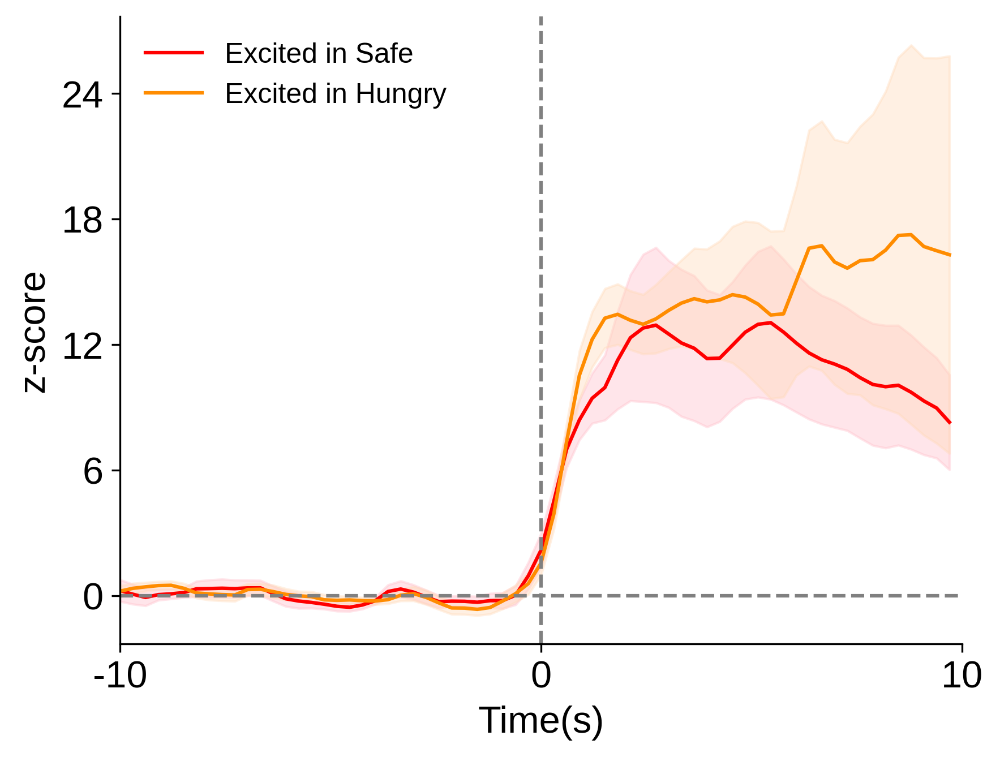

In [62]:
x=np.arange(Bins)
y=excited_safe_mean
z=excited_hungry_mean
erry = excited_safe_sem
errz = excited_hungry_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.plot(x, y, label = 'Excited in Safe', color = 'red')
ax.plot(x, z, label = 'Excited in Hungry', color = 'darkorange')
ax.fill_between(x, y-erry, y+erry, color='pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='peachpuff', alpha = 0.4)
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-2, 12)
#ax.set_ylim(0, Bins)
ax.axvline(int((Bins/2)), color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 12)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_safe_crossed)

9

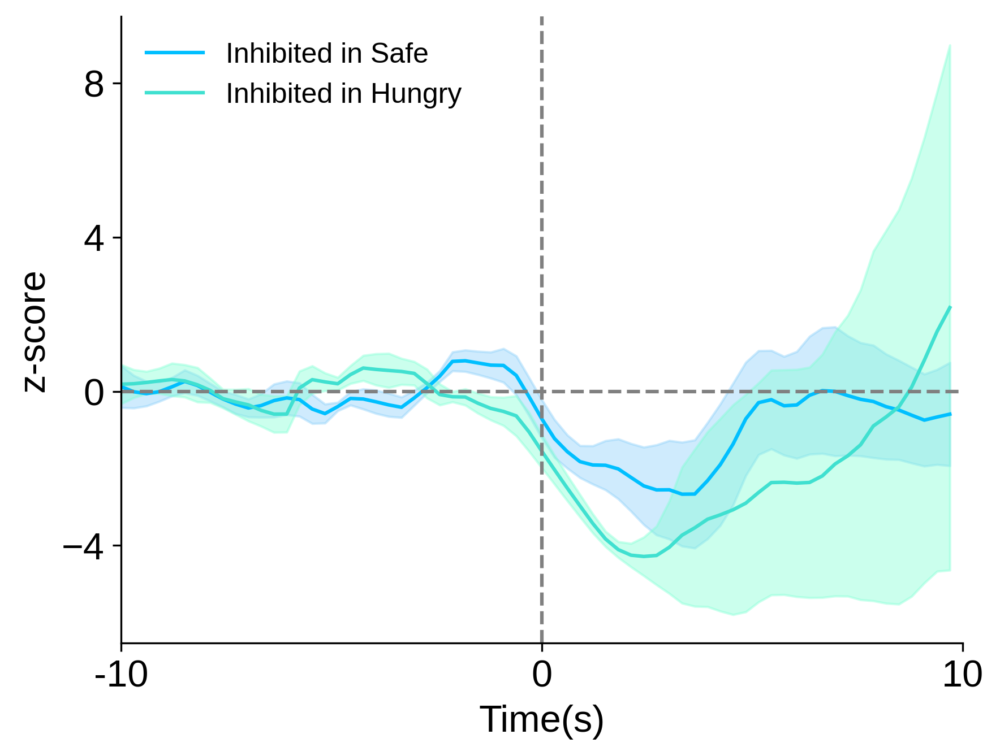

In [63]:
x=np.arange(Bins)
y=inhibited_safe_mean
z=inhibited_hungry_mean
erry = inhibited_safe_sem
errz = inhibited_hungry_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.plot(x, y, label = 'Inhibited in Safe', color = 'deepskyblue')
ax.plot(x, z, label = 'Inhibited in Hungry', color = 'turquoise')
ax.fill_between(x, y-erry, y+erry, color='lightskyblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='aquamarine', alpha = 0.4)
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-4, 2)
ax.axvline(int((Bins/2)), color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize= 12)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_safe_crossed)

8

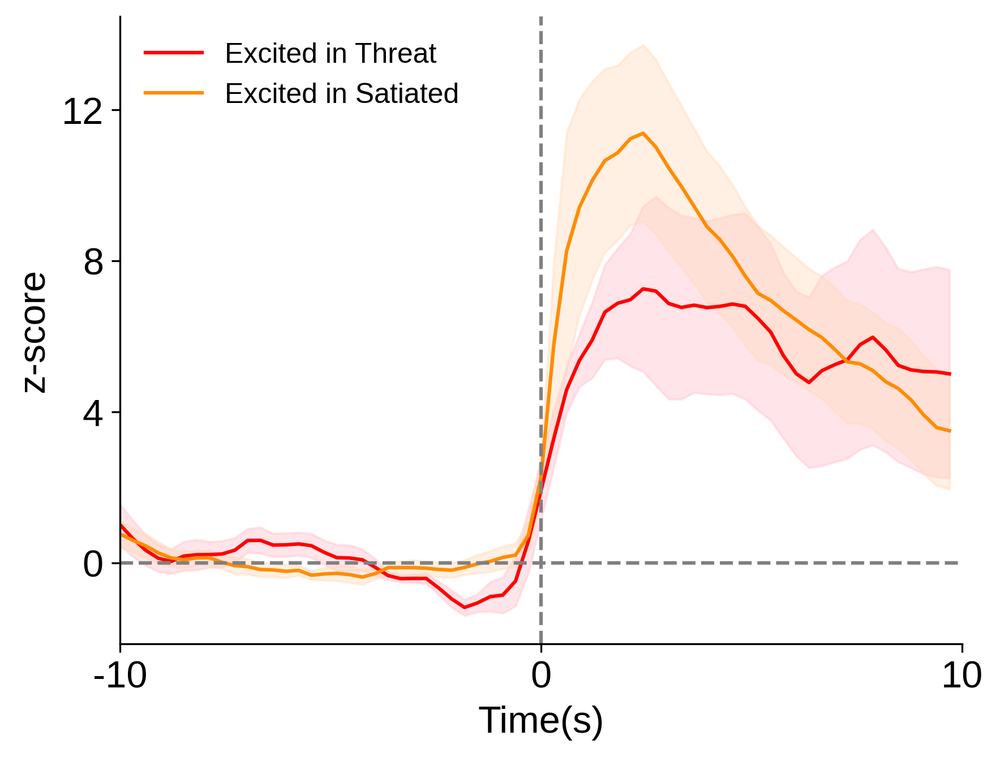

In [64]:
x=np.arange(Bins)
y=excited_threat_mean
z=excited_satiated_mean
erry = excited_threat_sem
errz = excited_satiated_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.plot(x, y, label = 'Excited in Threat', color = 'red')
ax.plot(x, z, label = 'Excited in Satiated', color = 'darkorange')
ax.fill_between(x, y-erry, y+erry, color='pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='peachpuff', alpha = 0.4)
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-2, 12)
#ax.set_ylim(0, Bins)
ax.axvline(int((Bins/2)), color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 12)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_safe_crossed)

5

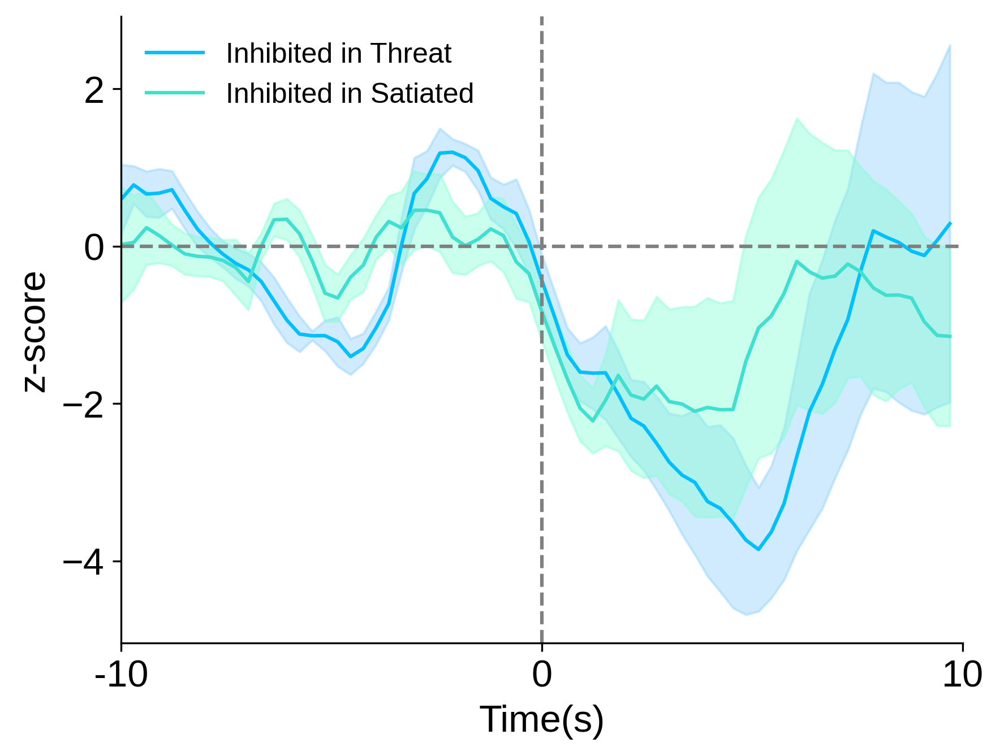

In [65]:
x=np.arange(Bins)
y=inhibited_threat_mean
z=inhibited_satiated_mean
erry = inhibited_threat_sem
errz = inhibited_satiated_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.plot(x, y, label = 'Inhibited in Threat', color = 'deepskyblue')
ax.plot(x, z, label = 'Inhibited in Satiated', color = 'turquoise')
ax.fill_between(x, y-erry, y+erry, color='lightskyblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='aquamarine', alpha = 0.4)
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-4, 2)
ax.axvline(int((Bins/2)), color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize= 12)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_threat_crossed)

In [66]:
excited_safe_mean

0      0.250040
1      0.076107
2     -0.079383
3      0.055337
4      0.092196
        ...    
61    10.056926
62     9.724248
63     9.309039
64     8.969440
65     8.294025
Length: 66, dtype: float64

28

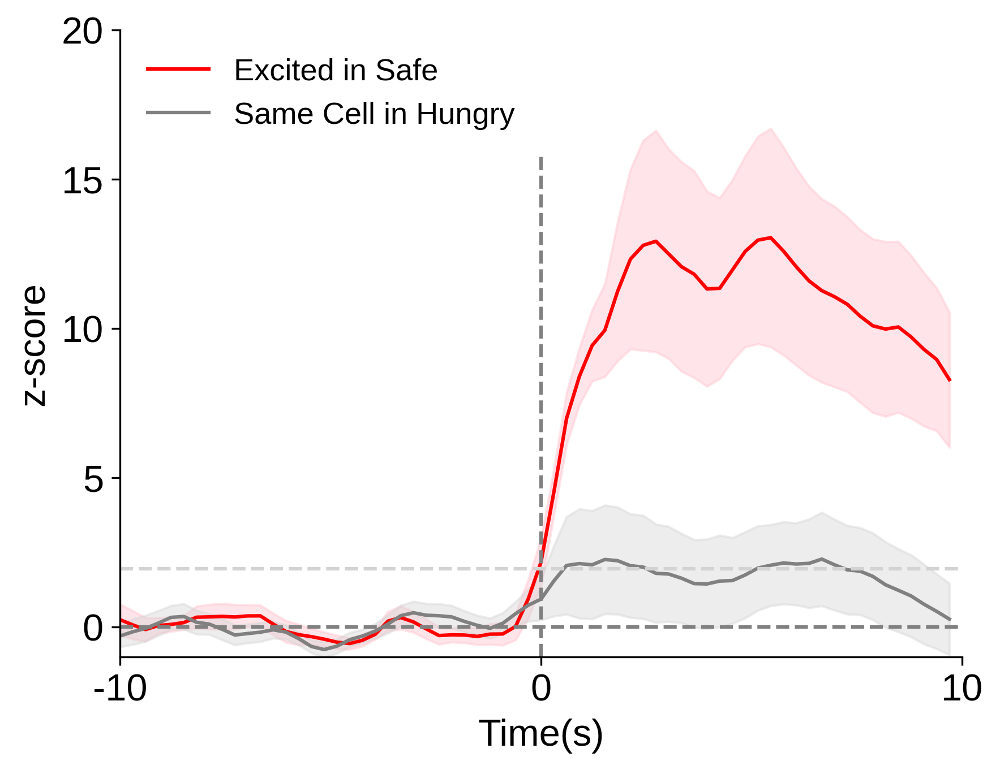

In [67]:
x=np.arange(Bins)
y=excited_safe_mean
z=excited_safe_in_hungry_mean
erry = excited_safe_sem
errz = excited_safe_in_hungry_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.plot(x, y, label = 'Excited in Safe', color = 'red')
ax.plot(x, z, label = 'Same Cell in Hungry', color = 'grey')
ax.fill_between(x, y-erry, y+erry, color='pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-1, 20)
ax.axvline(int((Bins/2)), ymax=0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.axhline(1.96, color = 'lightgrey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_safe)

28

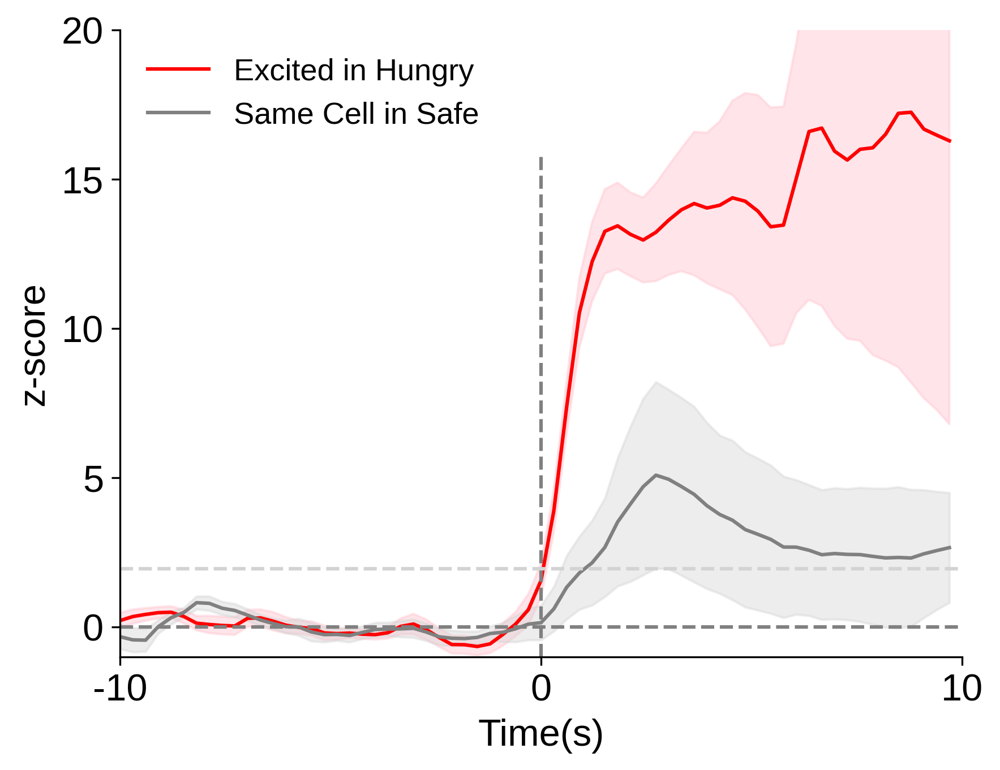

In [68]:
x=np.arange(Bins)
y=excited_hungry_mean
z=excited_hungry_in_safe_mean
erry = excited_hungry_sem
errz = excited_hungry_in_safe_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.plot(x, y, label = 'Excited in Hungry', color = 'red')
ax.plot(x, z, label = 'Same Cell in Safe', color = 'grey')
ax.fill_between(x, y-erry, y+erry, color='pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-1, 20)
ax.axvline(int((Bins/2)), ymax=0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.axhline(1.96, color = 'lightgrey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_safe)

27

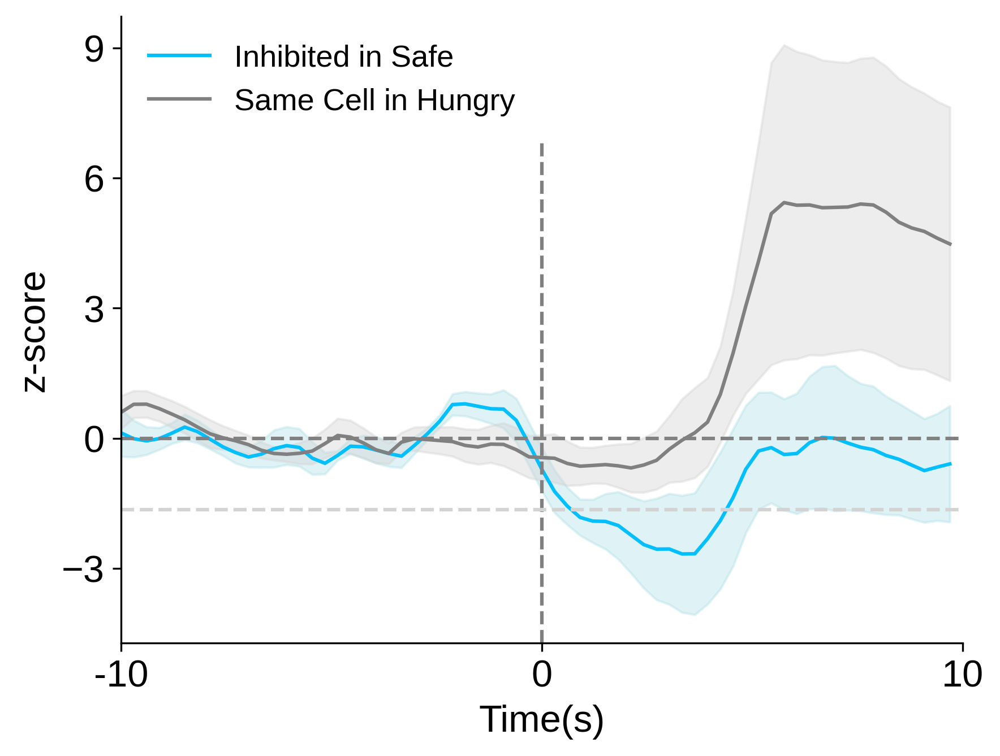

In [69]:
x=np.arange(Bins)
y=inhibited_safe_mean
z=inhibited_safe_in_hungry_mean
erry = inhibited_safe_sem
errz = inhibited_safe_in_hungry_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.plot(x, y, label = 'Inhibited in Safe', color='deepskyblue')
ax.plot(x, z, label = 'Same Cell in Hungry', color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'powderblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xlabel('Time(s)')
ax.set_ylabel('z-score')
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-4, 3)
ax.axvline(int((Bins/2)), ymax=0.8,color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.axhline(-1.645, color = 'lightgrey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_safe)

27

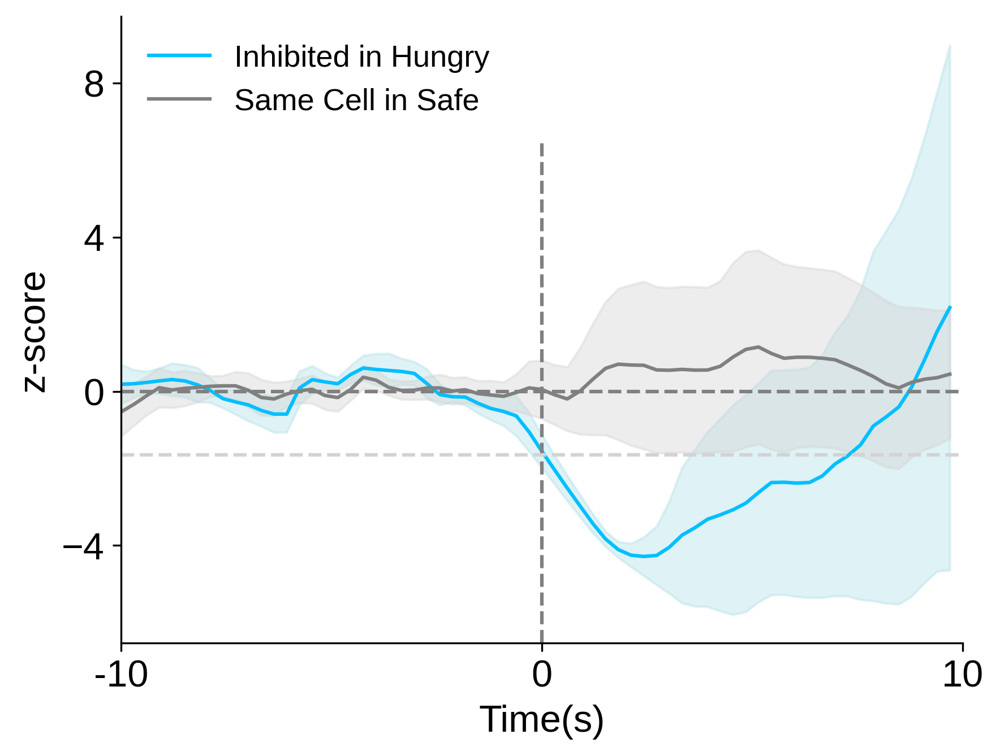

In [70]:
x=np.arange(Bins)
y=inhibited_hungry_mean
z=inhibited_hungry_in_safe_mean
erry = inhibited_hungry_sem
errz = inhibited_hungry_in_safe_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.plot(x, y, label = 'Inhibited in Hungry', color='deepskyblue')
ax.plot(x, z, label = 'Same Cell in Safe', color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'powderblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xlabel('Time(s)')
ax.set_ylabel('z-score')
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-4, 3)
ax.axvline(int((Bins/2)), ymax=0.8,color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.axhline(-1.645, color = 'lightgrey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_safe)

23

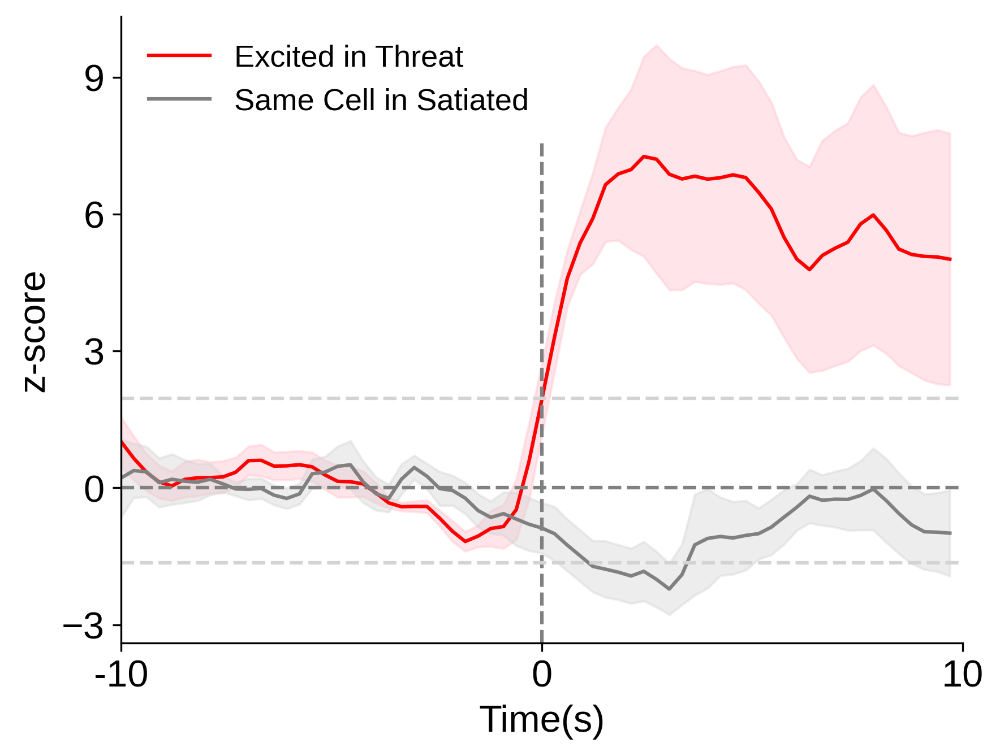

In [71]:
x=np.arange(Bins)
y=excited_threat_mean
z=excited_threat_in_satiated_mean
erry = excited_threat_sem
errz = excited_threat_in_satiated_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.plot(x, y, label = 'Excited in Threat',color='red')
ax.plot(x, z, label = 'Same Cell in Satiated',color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-3, 12)
ax.axvline(int((Bins/2)), ymax = 0.8,color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.axhline(1.96, color = 'lightgrey', ls = '--')
ax.axhline(-1.645, color = 'lightgrey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_threat)

23

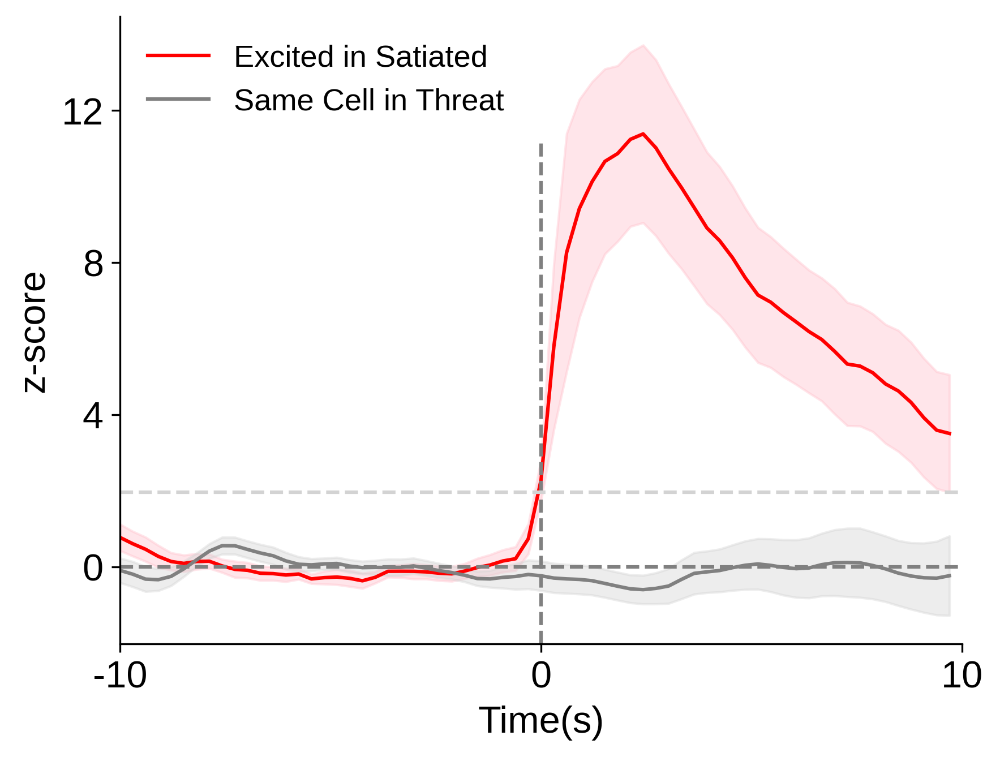

In [72]:
x=np.arange(Bins)
y=excited_satiated_mean
z=excited_satiated_in_threat_mean
erry = excited_satiated_sem
errz = excited_satiated_in_threat_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.plot(x, y, label = 'Excited in Satiated',color='red')
ax.plot(x, z, label = 'Same Cell in Threat',color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-3, 12)
ax.axvline(int((Bins/2)), ymax = 0.8,color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.axhline(1.96, color = 'lightgrey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_threat)

5

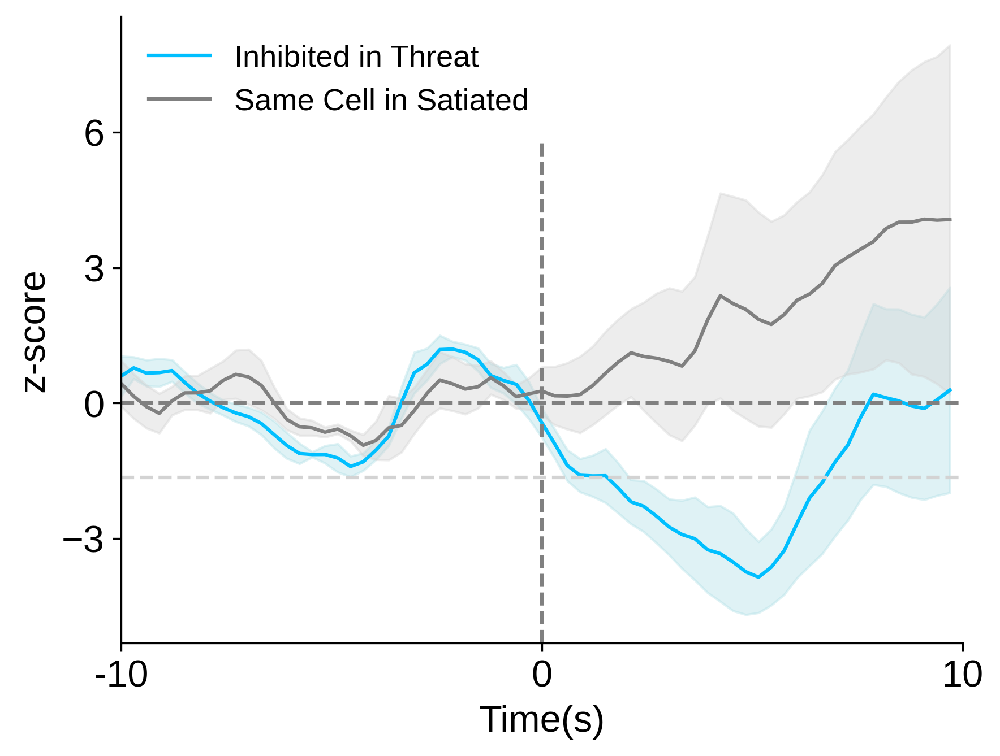

In [73]:
x=np.arange(Bins)
y=inhibited_threat_mean
z=inhibited_threat_in_stiated_mean
erry = inhibited_threat_sem
errz = inhibited_threat_in_stiated_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.plot(x, y, label = 'Inhibited in Threat',color='deepskyblue')
ax.plot(x, z, label = 'Same Cell in Satiated',color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'powderblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(int((Bins/2)), ymax = 0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.axhline(-1.645, color = 'lightgrey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_threat_crossed)

5

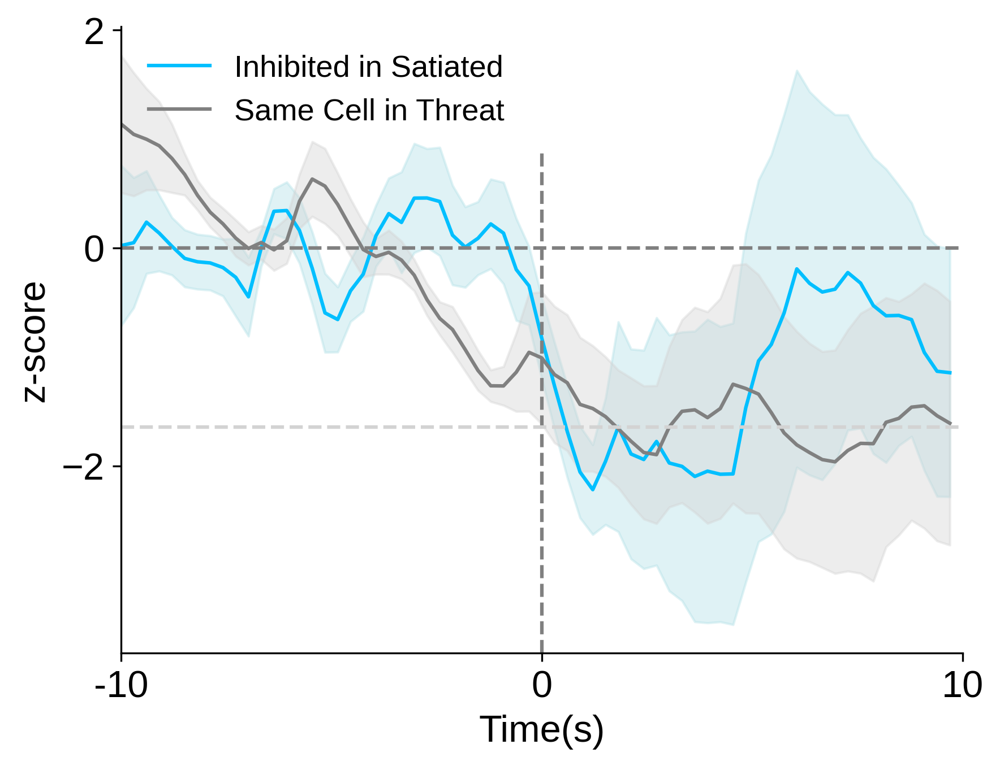

In [74]:
x=np.arange(Bins)
y=inhibited_satiated_mean
z=inhibited_satiated_in_threat_mean
erry = inhibited_satiated_sem
errz = inhibited_satiated_in_threat_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('z-score', fontsize = 16)
ax.plot(x, y, label = 'Inhibited in Satiated',color='deepskyblue')
ax.plot(x, z, label = 'Same Cell in Threat',color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'powderblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(int((Bins/2)), ymax = 0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.axhline(-1.645, color = 'lightgrey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_threat_crossed)

In [75]:
inhibited_hungry_crossed_indices

0    225
1    156
2    138
3     29
4    385
5    368
6    259
Name: index, dtype: int64

In [76]:
responsive_hungry = np.concatenate([excited_hungry_crossed_indices, inhibited_hungry_crossed_indices])
responsive_safe = np.concatenate([excited_safe_crossed_indices, inhibited_safe_crossed_indices])
responsive_satiated = np.concatenate([excited_satiated_crossed_indices, inhibited_satiated_crossed_indices])
responsive_threat = np.concatenate([excited_threat_crossed_indices, inhibited_threat_crossed_indices])

In [77]:
set(responsive_hungry).intersection(set(responsive_safe))

{313}

In [78]:
set(responsive_satiated).intersection(set(responsive_threat))

set()

In [79]:
trace_hungry_crossed_sorted = trace_hungry_crossed.sort_values(by=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'], 
                                       ascending=[True, False, False], )
trace_safe_crossed_sorted = trace_safe_crossed.sort_values(by=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'], 
                                       ascending=[True, False, False])
trace_threat_crossed_sorted = trace_threat_crossed.sort_values(by=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'], 
                                       ascending=[True, False, False])
trace_satiated_crossed_sorted = trace_satiated_crossed.sort_values(by=['Animal_ID', 'Conflict_cell_id', 'Satiation_cell_id'], 
                                       ascending=[True, False, False])

In [80]:
trace_hungry_crossed_sorted = trace_hungry_crossed_sorted.reset_index(drop=True)
trace_safe_crossed_sorted = trace_safe_crossed_sorted.reset_index(drop=True)
trace_threat_crossed_sorted = trace_threat_crossed_sorted.reset_index(drop=True)
trace_satiated_crossed_sorted = trace_satiated_crossed_sorted.reset_index(drop=True)

In [81]:
trace_hungry_crossed_ranked = trace_hungry_crossed_sorted.sort_values(by=Bins_before, axis=0)
trace_safe_crossed_ranked = trace_safe_crossed_sorted.reindex(trace_hungry_crossed_ranked.index)
trace_threat_crossed_sorted = trace_threat_crossed_sorted.reindex(trace_hungry_crossed_ranked.index)
trace_satiated_crossed_sorted = trace_satiated_crossed_sorted.reindex(trace_hungry_crossed_ranked.index)

In [82]:
trace_hungry_crossed_ranked.shape[1]*0.85

58.65

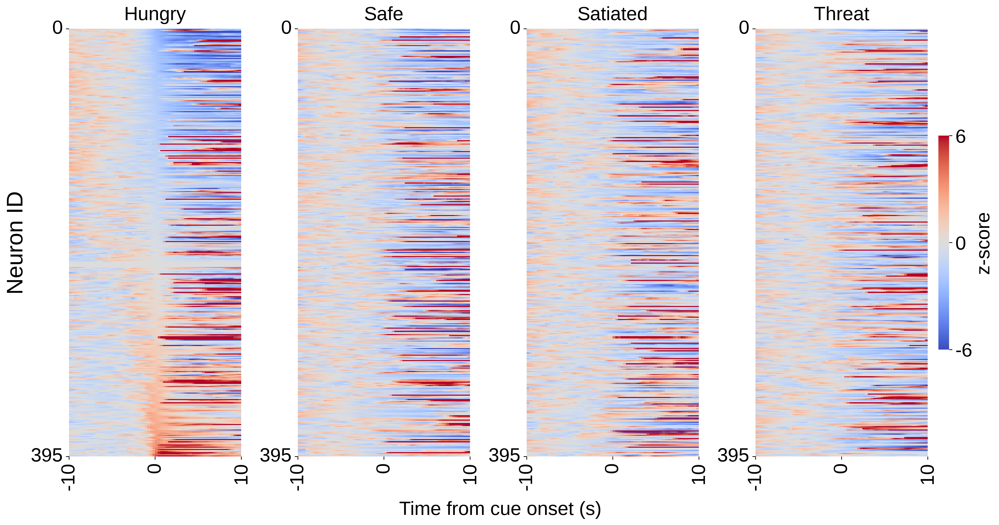

In [83]:
width_ratios = [trace_hungry_crossed_ranked.shape[1]*0.8, trace_safe_crossed_ranked.shape[1]*0.8, 
                trace_satiated_crossed_sorted.shape[1]*0.8, trace_threat_crossed_sorted.shape[1]]
fig = plt.figure(figsize=(16, 8), dpi=300)
gs = gridspec.GridSpec(1, 4, width_ratios=width_ratios)

# Create axes for the subplots with the gridspec
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax3 = fig.add_subplot(gs[2])
ax4 = fig.add_subplot(gs[3])

# fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, figsize=(6,3), dpi=300)
sns.heatmap(trace_hungry_crossed_ranked.iloc[:, 3:], vmin=-6, vmax=6, cmap="coolwarm",cbar=False, ax = ax1, rasterized=True)  # Exclude the last two columns (Animal_ID and cell_id)
ax1.set_xticks([0, Bins_before, Bins])
ax1.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax1.set_yticks([0, len(trace_hungry_crossed_ranked)])
ax1.set_yticklabels([0, len(trace_hungry_crossed_ranked)])
ax1.set_title('Hungry',fontsize =22, pad = 10)
ax1.set_ylabel('Neuron ID',fontsize =26)
ax1.tick_params(labelsize = 22)
# # Change font size of colorbar labels for the first heatmap
# cbar1 = ax1.collections[0].colorbar
# cbar1.ax.tick_params(labelsize=8) 

sns.heatmap(trace_safe_crossed_ranked.iloc[:, 3:], vmin=-6, vmax=6, cmap="coolwarm",cbar=False,  ax = ax2, rasterized=True)  # Exclude the last two columns (Animal_ID and cell_id)
ax2.set_xticks([0, Bins_before, Bins])
ax2.set_xticklabels([-TimeRange_before, 0, TimeRange_after], rotation=90)
ax2.set_yticks([0, len(trace_safe_crossed_ranked)])
ax2.set_yticklabels([0, len(trace_safe_crossed_ranked)])
ax2.set_title('Safe', fontsize =22, pad = 10)
ax2.tick_params(labelsize = 22)
# cbar2 = ax2.collections[0].colorbar
# cbar2.ax.tick_params(labelsize=8)

sns.heatmap(trace_satiated_crossed_sorted.iloc[:, 3:], vmin=-6, vmax=6, cmap="coolwarm", cbar=False, ax = ax3, rasterized=True)  # Exclude the last two columns (Animal_ID and cell_id)
ax3.set_xticks([0, Bins_before, Bins])
ax3.set_xticklabels([-TimeRange_before, 0, TimeRange_after], rotation=90)
ax3.set_yticks([0, len(trace_satiated_crossed_sorted)])
ax3.set_yticklabels([0, len(trace_satiated_crossed_sorted)])
ax3.set_title('Satiated', fontsize =22, pad = 10)
ax3.tick_params(labelsize = 22)
# cbar3 = ax3.collections[0].colorbar
# cbar3.ax.tick_params(labelsize=8)

sns.heatmap(trace_threat_crossed_sorted.iloc[:, 3:], vmin=-6, vmax=6, cmap="coolwarm", ax = ax4, cbar_kws={'shrink': 0.5}, rasterized=True)  # Exclude the last two columns (Animal_ID and cell_id)
ax4.set_xticks([0, Bins_before, Bins])
ax4.set_xticklabels([-TimeRange_before, 0, TimeRange_after], rotation=90)
ax4.set_yticks([0, len(trace_threat_crossed_sorted)])
ax4.set_yticklabels([0, len(trace_threat_crossed_sorted)])
ax4.set_title('Threat', fontsize =22, pad = 10)
ax4.tick_params(labelsize = 22)

ticks = [-6,0,6]
cbar4 = ax4.collections[0].colorbar
cbar4.set_ticks(ticks)
cbar4.set_ticklabels([tick for tick in ticks], fontsize = 22)
cbar4.ax.tick_params(labelsize=22)
cbar4.set_label('z-score', rotation=90, labelpad=3, fontsize = 22)

fig.text(0.5, -0.02, 'Time from cue onset (s)', fontsize=22,
         horizontalalignment='center', verticalalignment='center', rotation='horizontal')
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_heatmap_4_states.svg", transparent=True)

plt.show()

In [84]:
before_hungry = trace_hungry_crossed.iloc[:, (Bins_before - int(CompareRange_base * FR / BinSize)+2) : Bins_before+2]
after_hungry = trace_hungry_crossed.iloc[:, Bins_before+2:(Bins_before+int(CompareRange_after*FR/BinSize)+2)]
change_hungry = after_hungry.mean(axis= 1) - before_hungry.mean(axis=1)
change_hungry

0     -0.211243
1     -0.729654
2     -0.429586
3     -0.551850
4      0.817039
         ...   
390   -0.231649
391    0.170867
392   -0.109354
393   -1.058360
394    0.000000
Length: 395, dtype: float64

In [85]:
before_safe = trace_safe_crossed.iloc[:, (Bins_before - int(CompareRange_base * FR / BinSize)+2) : Bins_before+2]
after_safe = trace_safe_crossed.iloc[:, Bins_before+2:(Bins_before+int(CompareRange_after*FR/BinSize)+2)]
change_safe = after_safe.mean(axis= 1) - before_safe.mean(axis=1)
change_safe

0      0.505305
1      0.505305
2     -0.076936
3      0.031145
4     -0.028887
         ...   
390    0.096964
391    0.144694
392   -0.306535
393    0.202631
394   -0.330271
Length: 395, dtype: float64

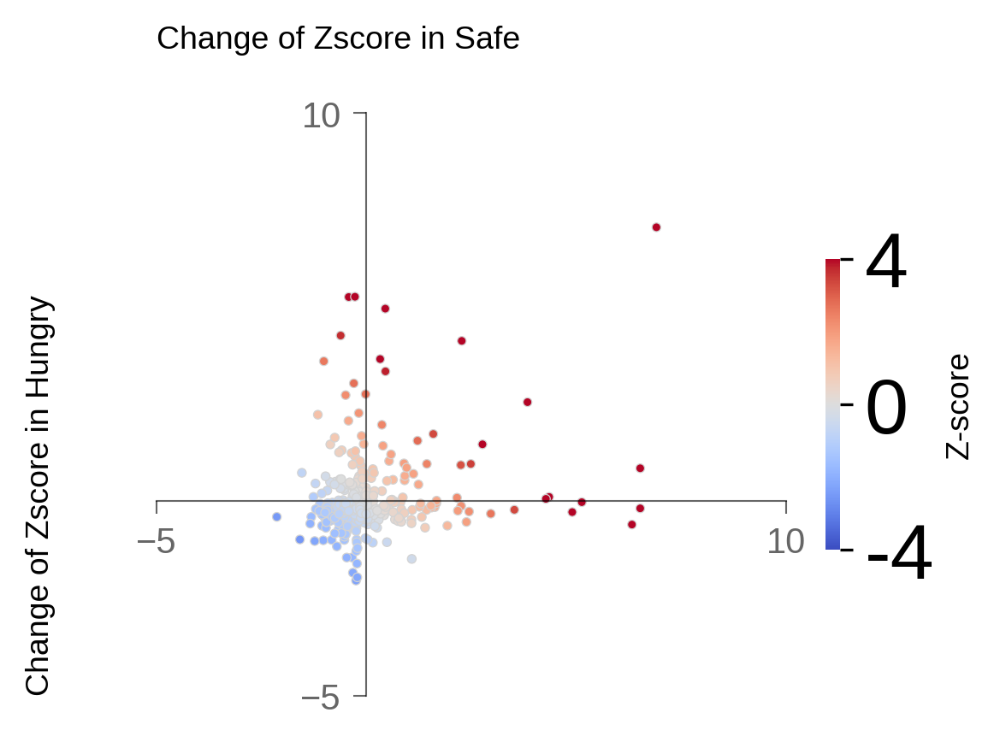

In [86]:
fig, ax = plt.subplots(figsize = (4,3),dpi =300)

# Calculating the combined metric (e.g., Euclidean distance from origin)
# Updated custom metric function
def custom_metric(x, y):
    """
    Assigns a value based on the specific range criteria.
    Points with both values within -1.645 and 1.96 are considered 'neutral' 
    and are assigned values to map them near the center of the colormap.
    Points outside this range are assigned values based on their deviation.
    """
#     neutral_zone = ((x > -1.645) & (x < 1.96)) & ((y > -1.645) & (y < 1.96))
    neutral_zone = ((x > 0) & (x < 0)) & ((y > 0) & (y < 0))

    # Mapping points within the neutral zone to values near zero
    metric = np.where(neutral_zone, (x+y)*0.25, x + y)
    return metric

# Calculate the custom metric for each point
combined_metric = custom_metric(change_hungry, change_safe)

# Normalizing the combined metric for the colormap
norm = plt.Normalize(-4, 4)
# colors = plt.cm.bwr(norm(combined_metric))
colors = plt.cm.coolwarm(norm(combined_metric))
cmap = plt.cm.coolwarm

scatter = ax.scatter(change_hungry, change_safe, s = 6, c =combined_metric, cmap = cmap, norm=norm, edgecolor = 'lightgrey', alpha = 1, lw = 0.3)
# # Adjusting the spines to cross at (0,0)
# Adjusting the spines to cross at (0,0) and making them thinner
for spine in ['left', 'bottom']:
    ax.spines[spine].set_position('zero')  # Moves the spine to the center
    ax.spines[spine].set_linewidth(0.5)  # Makes the spine thinner
    ax.spines[spine].set_alpha(0.6)

# # Hiding the top and right spines
ax.spines['right'].set_color('none')  # Hides the right spine
ax.spines['top'].set_color('none')  # Hides the top spine

# Set the alpha for tick labels
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_alpha(0.6)
    
ax.set_xticks([-5, 10])
ax.set_yticks([-5, 10])
ax.tick_params(width = 0.5, color=[0,0,0,0.6])
ax.set_ylim(-5, 10)
ax.set_xlim(-5, 10)

# Adding text for the x-axis and y-axis
ax.text(-0.16, 0, "Change of Zscore in Hungry", verticalalignment='bottom', horizontalalignment='right', transform=ax.transAxes, rotation=90, fontsize = 9)
ax.text(0, 1.1, "Change of Zscore in Safe", verticalalignment='bottom', horizontalalignment='left', transform=ax.transAxes, fontsize = 9)
cbar = plt.colorbar(scatter, ax = ax, shrink = 0.5)
cbar.outline.set_visible(False)
cbar.set_label('Z-score', rotation=90, labelpad=3, fontsize=9)
ticks = [-4,0,4]
cbar.set_ticks(ticks)
cbar.set_ticklabels([tick for tick in ticks], fontsize = 22)


plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_changeofzscore_hungry_vs_safe.svg", transparent=True)




In [87]:
before_satiated = trace_satiated_crossed.iloc[:, (Bins_before - int(CompareRange_base * FR / BinSize)+2) : Bins_before+2]
after_satiated = trace_satiated_crossed.iloc[:, Bins_before+2:(Bins_before+int(CompareRange_after*FR/BinSize)+2)]
change_satiated = after_satiated.mean(axis= 1) - before_satiated.mean(axis=1)
change_satiated

0     -0.188731
1     -0.701175
2     -0.736290
3     -0.462917
4      0.195082
         ...   
390   -0.280780
391   -0.323279
392   -0.205567
393   -0.723603
394   -0.242434
Length: 395, dtype: float64

In [88]:
before_threat = trace_threat_crossed.iloc[:, (Bins_before - int(CompareRange_base * FR / BinSize)+2) : Bins_before+2]
after_threat = trace_threat_crossed.iloc[:, Bins_before+2:(Bins_before+int(CompareRange_after*FR/BinSize)+2)]
change_threat = after_threat.mean(axis= 1) - before_threat.mean(axis=1)
change_threat

0      0.108412
1      0.108412
2     -0.167108
3     -0.977841
4     -0.615280
         ...   
390   -0.176646
391   -0.290621
392    0.403118
393   -0.389140
394    0.329299
Length: 395, dtype: float64

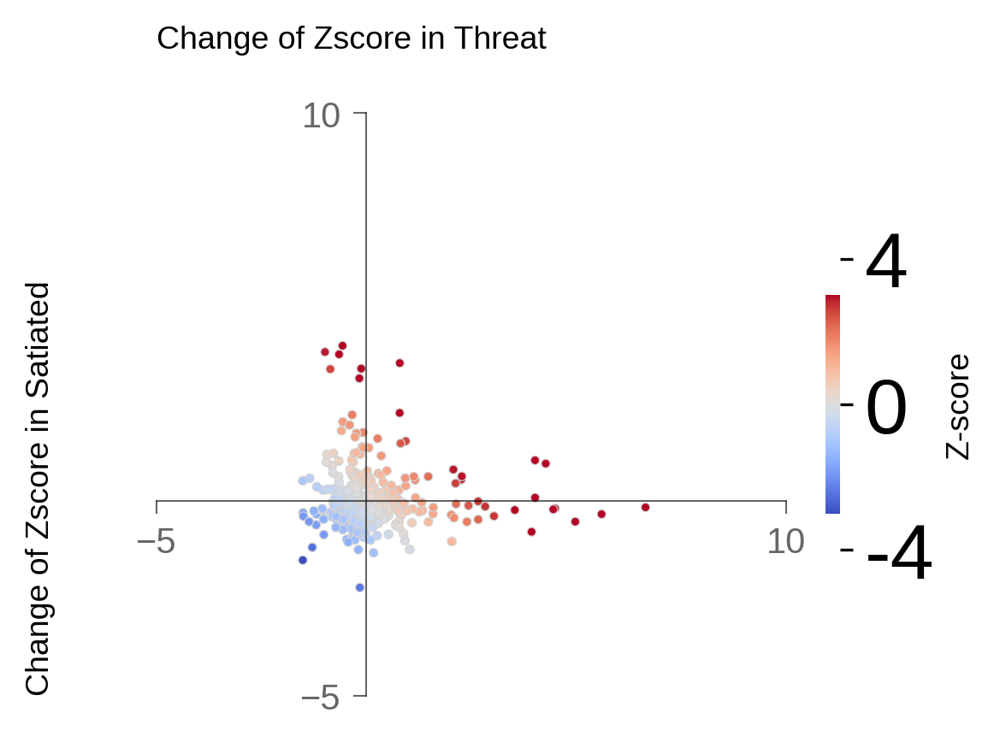

In [89]:
fig, ax = plt.subplots(figsize = (4,3),dpi =300)

# Calculating the combined metric (e.g., Euclidean distance from origin)
# Updated custom metric function
def custom_metric(x, y):
    """
    Assigns a value based on the specific range criteria.
    Points with both values within -1.645 and 1.96 are considered 'neutral' 
    and are assigned values to map them near the center of the colormap.
    Points outside this range are assigned values based on their deviation.
    """
#     neutral_zone = ((x > -1.645) & (x < 1.96)) & ((y > -1.645) & (y < 1.96))
    neutral_zone = ((x > 0) & (x < 0)) & ((y > 0) & (y < 0))

    # Mapping points within the neutral zone to values near zero
    metric = np.where(neutral_zone, (x+y)*0.25, x + y)
    return metric

# Calculate the custom metric for each point
combined_metric = custom_metric(change_satiated, change_threat)

# Normalizing the combined metric for the colormap
norm = plt.Normalize(-3, 3)
colors = plt.cm.coolwarm(norm(combined_metric))
cmap = plt.cm.coolwarm

scatter = ax.scatter(change_satiated, change_threat, s = 6, c =combined_metric, cmap = cmap, norm=norm, edgecolor = 'lightgrey', alpha = 1, lw = 0.3)
# # Adjusting the spines to cross at (0,0)
# Adjusting the spines to cross at (0,0) and making them thinner
for spine in ['left', 'bottom']:
    ax.spines[spine].set_position('zero')  # Moves the spine to the center
    ax.spines[spine].set_linewidth(0.5)  # Makes the spine thinner
    ax.spines[spine].set_alpha(0.6)

# # Hiding the top and right spines
ax.spines['right'].set_color('none')  # Hides the right spine
ax.spines['top'].set_color('none')  # Hides the top spine

# Set the alpha for tick labels
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_alpha(0.6)
    
ax.set_xticks([-5, 10])
ax.set_yticks([-5, 10])
ax.tick_params(width = 0.5, color=[0,0,0,0.6])
ax.set_ylim(-5, 10)
ax.set_xlim(-5, 10)

# Adding text for the x-axis and y-axis
ax.text(-0.16, 0, "Change of Zscore in Satiated", verticalalignment='bottom', horizontalalignment='right', transform=ax.transAxes, rotation=90, fontsize = 9)
ax.text(0, 1.1, "Change of Zscore in Threat", verticalalignment='bottom', horizontalalignment='left', transform=ax.transAxes, fontsize = 9)
cbar = plt.colorbar(scatter, ax = ax, shrink = 0.5)
cbar.outline.set_visible(False)
cbar.set_label('Z-score', rotation=90, labelpad=3, fontsize=9)
ticks = [-4,0,4]
cbar.set_ticks(ticks)
cbar.set_ticklabels([tick for tick in ticks], fontsize = 22)

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_changeofzscore_satiated_vs_threat.svg", transparent=True)



### Clustering


In [90]:
def standardize_plot_graphics(ax):
    [i.set_linewidth(0.5) for i in ax.spines.values()]
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    return ax

def fit_regression(x, y):
    lm = sm.OLS(y, sm.add_constant(x)).fit()
    x_range = sm.add_constant(np.array([x.min(), x.max()]))
    x_range_pred = lm.predict(x_range)
    return lm.pvalues[1], lm.params[1], x_range[:,1], x_range_pred, lm.rsquared

def CDFplot(x, ax, **kwargs):
    x = np.array(x)
    ix=np.argsort(x)
    ax.plot(x[ix], ECDF(x)(x)[ix], **kwargs)
    return ax

def fit_regression_and_plot(x, y, ax, plot_label='', color='k', linecolor='r', markersize=3,
                            show_pval=True):
    #linetype is a string like 'bo'
    pvalue, slope, temp, temppred, R2 = fit_regression(x, y)   
    if show_pval:
        plot_label = '%s p=%.2e\nr=%.3f'% (plot_label, pvalue, np.sign(slope)*np.sqrt(R2))
    else:
        plot_label = '%s r=%.3f'% (plot_label, np.sign(slope)*np.sqrt(R2))
    ax.scatter(x, y, color=color, label=plot_label, s=markersize)
    ax.plot(temp, temppred, color=linecolor)
    return ax, slope, pvalue, R2

In [91]:
basedir = './analysis_ouput'
hungry = trace_hungry_crossed.iloc[:,3:].to_numpy(dtype = float)
safe = trace_safe_crossed.iloc[:,3:].to_numpy(dtype = float)

TimeRange = 20
TotalBins = hungry.shape[1]

populationdata = np.concatenate([hungry,safe],axis =1)
trace_hungry_crossed = trace_hungry_crossed[~np.any(np.isnan(populationdata), axis=1)]
populationdata = populationdata[~np.any(np.isnan(populationdata), axis=1)]
populationdata

array([[-2.32640867, -1.93585597, -1.31251369, ...,  4.44663999,
         4.21023265,  3.99824003],
       [-1.62177772, -1.57391831, -1.09563558, ...,  4.44663999,
         4.21023265,  3.99824003],
       [-0.76161503, -0.84614766, -0.91091002, ...,  6.28167336,
         6.9314816 ,  6.69343412],
       ...,
       [-0.6622342 , -0.68191757, -0.69898035, ..., -2.02794067,
        -2.17750484, -2.30785512],
       [ 0.7417406 ,  0.35602804,  0.01991057, ...,  1.93573766,
         1.71535509,  1.36345098],
       [ 0.        ,  0.        ,  0.        , ..., -1.28603781,
        -1.41033591, -1.53756105]])

In [92]:
populationdata.shape

(395, 132)

In [93]:
BinSizeSC = 0.3
framerate = 1/BinSizeSC
pre_window_size = int(0.5*TimeRange*framerate) # 6 seconds multipled by 5 frames. Corresponds to baseline prior to cues.
window_size = TotalBins # Total number of frames plotted around a cue
frames_to_reward = int(0.5*TimeRange*framerate) # 6 seconds until reward after CS+

sortwindow = [pre_window_size, pre_window_size + int(1*framerate)] # Sort responses between CS+ onset and reward.
sortresponse = np.argsort(np.mean(populationdata[:,sortwindow[0]:sortwindow[1]], axis=1))[::-1]
# sortresponse corresponds to an ordering of the neurons based on their average response in the sortwindow

cmax = 4 # Maximum colormap value. 
cmin = -4

trial_types = ['Hungry', 'Safe']

/tmp/ipykernel_68145/2630381658.py:55: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


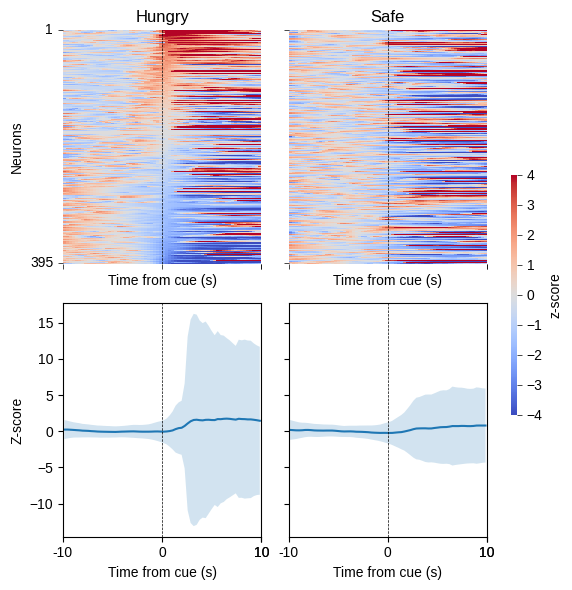

In [94]:
fig, axs = plt.subplots(2,2,figsize=(3*2,3*2), sharex='all', sharey='row')
cbar_ax = fig.add_axes([0.86, .3, .01, .4])
cbar_ax.tick_params(width=0.5) 

def tsplot(ax, data,**kw):
    x = np.arange(window_size)
    est = np.mean(data, axis=0)
    sd = np.std(data, axis=0)
    cis = (est - sd, est + sd)
    ax.fill_between(x+0.5,cis[0],cis[1], alpha=0.2, **kw)
    ax.plot(x+0.5,est,**kw)
    ax.margins(x=0)


for t in range(len(trial_types)):
    axs[0,t].set_title(trial_types[t])
    ax = axs[0,t]
    sns.heatmap(populationdata[sortresponse, t*window_size: (t+1)*window_size],
                ax=ax,
                cmap=plt.get_cmap('coolwarm'),
                vmin=cmin,
                vmax=cmax,
                cbar=(t==0),
                cbar_ax=cbar_ax if (t==0) else None,
                cbar_kws={'label': 'z-score'})
    ax.grid(False)
    ax.tick_params(width=0.5)   
    ax.set_xticks([0, pre_window_size, pre_window_size + frames_to_reward, window_size]) 
    ax.set_xticklabels([str(int((a-pre_window_size+0.0)/framerate))
                                     for a in [0, pre_window_size,
                                               pre_window_size + frames_to_reward, window_size]])
    ax.set_yticks([0, len(sortresponse)-1])
    ax.set_yticklabels(['1', str(len(sortresponse))])
    ax.axvline(pre_window_size, linestyle='--', color='k', linewidth=0.5)    
    ax.axvline(pre_window_size + frames_to_reward, linestyle='--', color='k', linewidth=0.5)    
    ax.set_xlabel('Time from cue (s)')
    
        
    ax = axs[1,t]
    tsplot(ax, populationdata[sortresponse, t*window_size:(t+1)*window_size])
    ax.set_xticks(np.arange(0, window_size + 1, frames_to_reward))
    ax.set_xticklabels([str(int((a - pre_window_size) / framerate)) for a in np.arange(0, window_size + 1, frames_to_reward)])

    ax.axvline(pre_window_size, linestyle='--', color='k', linewidth=0.5)    
    ax.axvline(pre_window_size + frames_to_reward, linestyle='--', color='k', linewidth=0.5)    
    ax.set_xlabel('Time from cue (s)')
    ax.set_xticks([0, pre_window_size, pre_window_size + frames_to_reward, window_size]) 
    ax.set_xticklabels([str(int(round((a-pre_window_size+0.0)/framerate)))
                                     for a in [0, pre_window_size,
                                               pre_window_size + frames_to_reward, window_size]])

axs[0,0].set_ylabel('Neurons')
axs[1,0].set_ylabel('Z-score')

fig.tight_layout()
fig.subplots_adjust(right=0.82)

Number of PCs = 132
Number of PCs to keep = 8


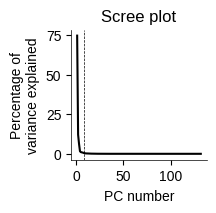

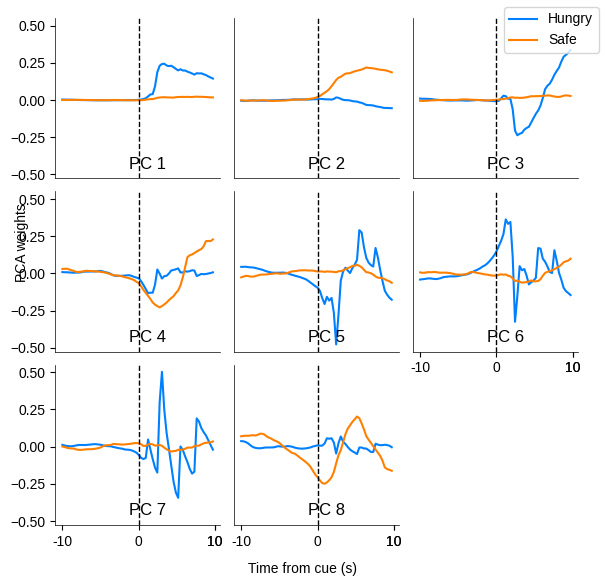

In [95]:
load_savedpca_or_dopca = 'dopca'
# Select 'dopca' for doing PCA on the data. Select 'savedpca' for loading my previous results

if load_savedpca_or_dopca == 'dopca':
    pca = PCA(n_components=populationdata.shape[1], whiten=True)
    pca.fit(populationdata) 
    with open(os.path.join(basedir, 'pcaresults_hungry_vs_safe.pickle'), 'wb') as f:
        pickle.dump(pca, f)
elif load_savedpca_or_dopca == 'savedpca':
    with open(os.path.join(basedir, 'pcaresults_hungry_vs_safe.pickle'), 'rb') as f:
        pca = pickle.load(f)
    
transformed_data = pca.transform(populationdata)

pca_vectors = pca.components_
print ('Number of PCs = %d'%(pca_vectors.shape[0]))

x = 100*pca.explained_variance_ratio_
xprime = x - (x[0] + (x[-1]-x[0])/(x.size-1)*np.arange(x.size))
#xprime = (x - np.mean(x))/(np.max(x)-np.min(x))
num_retained_pcs = 8#np.min(np.where(np.cumsum(x)>95))+1 #np.argmin(xprime)
# Number of PCs to be kept is defined as the number at which the 
# scree plot bends. This is done by simply bending the scree plot
# around the line joining (1, variance explained by first PC) and
# (num of PCs, variance explained by the last PC) and finding the 
# number of components just below the minimum of this rotated plot
print ('Number of PCs to keep = %d'%(num_retained_pcs))

fig, ax = plt.subplots(figsize=(2,2))
ax.plot(np.arange(pca.explained_variance_ratio_.shape[0]).astype(int)+1, x, 'k')
ax.set_ylabel('Percentage of\nvariance explained')
ax.set_xlabel('PC number')
ax.axvline(num_retained_pcs, linestyle='--', color='k', linewidth=0.5)
ax.set_title('Scree plot')
#ax.set_xlim([0,5])
[i.set_linewidth(0.5) for i in ax.spines.values()]
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

fig.subplots_adjust(left=0.3)
fig.subplots_adjust(right=0.98)
fig.subplots_adjust(bottom=0.25)
fig.subplots_adjust(top=0.9)

colors_for_key = {}
colors_for_key[trial_types[0]] = (0,0.5,1)
colors_for_key[trial_types[1]] = (1,0.5,0)

numcols = 3.0
fig, axs = plt.subplots(int(np.ceil(num_retained_pcs/numcols)), int(numcols), sharey='all',
                        figsize=(2*numcols, 2*int(np.ceil(num_retained_pcs/numcols))))
for pc in range(num_retained_pcs):
    ax = axs.flat[pc]
    for k, tempkey in enumerate(trial_types):
        ax.plot(pca_vectors[pc, k*window_size:(k+1)*window_size], color=colors_for_key[tempkey],
                label='PC %d: %s'%(pc+1, tempkey))
    ax.axvline(pre_window_size, linestyle='--', color='k', linewidth=1)
    ax.annotate(text='PC %d'%(pc+1), xy=(0.45, 0.06), xytext=(0.45, 0.06), xycoords='axes fraction',
            textcoords='axes fraction', multialignment='center', size='large')
    if pc >= num_retained_pcs-numcols:
        ax.set_xticks([0, pre_window_size,
                       pre_window_size + frames_to_reward, window_size])
        ax.set_xticklabels([str(int(round((a-pre_window_size+0.0)/framerate)))
                             for a in [0, pre_window_size,
                                       pre_window_size + frames_to_reward, window_size]])
    else:
        ax.set_xticks([])
        ax.xaxis.set_ticks_position('none')
    if pc%numcols:
        ax.yaxis.set_ticks_position('none')
    [i.set_linewidth(0.5) for i in ax.spines.values()]
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)


fig.text(0.5, 0.05, 'Time from cue (s)', horizontalalignment='center', rotation='horizontal')
fig.text(0.02, 0.6, 'PCA weights', verticalalignment='center', rotation='vertical')
fig.tight_layout()
fig.legend(trial_types,)
for ax in axs.flat[num_retained_pcs:]:
    ax.set_visible(False)

fig.subplots_adjust(wspace=0.08, hspace=0.08)
fig.subplots_adjust(bottom=0.13)

In [96]:
np.sum(x[:8])

97.63716599747772

In [557]:
max_n_clusters = 9 # Maximum number of clusters expected. I already ran this with up to 20 clusters and know
# that the optimal number is 9. So, I am leaving this at 11. In your data, might be worth increasing this, but
# it will take more time to run.

possible_n_clusters = np.arange(3, max_n_clusters+1) #This requires a minimum of 2 clusters.
# When the data contain no clusters at all, it will be quite visible when inspecting the two obtained clusters, 
# as the responses of the clusters will be quite similar. This will also be visible when plotting the data in
# the reduced dimensionality PC space (done below).

possible_n_nearest_neighbors = np.array([5, 10, 15, 20, 25,30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90,95, 100, 150, 200]) #np.array([100, 500, 1000, 2000, 4000]) # This should be selected for each dataset

# possible_n_nearest_neighbors = np.array([5, 10, 50, 80,100, 200, 300]) #np.array([100, 500, 1000, 2000, 4000]) # This should be selected for each dataset
# appropriately. When 4813 neurons are present, the above number of nearest neighbors provides a good sweep of the
# parameter space. But it will need to be changed for other data.
    
silhouette_scores = np.nan*np.ones((possible_n_clusters.size,
                                    possible_n_nearest_neighbors.size))

for n_clustersidx, n_clusters in enumerate(possible_n_clusters):
    for nnidx, nn in enumerate(possible_n_nearest_neighbors):
        model = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', n_neighbors=nn)
        model.fit(transformed_data[:,:num_retained_pcs])
        silhouette_scores[n_clustersidx, nnidx] = silhouette_score(transformed_data[:,:num_retained_pcs],
                                                                   model.labels_,
                                                                   metric='cosine')
        print ('Done with numclusters = %d, num nearest neighbors = %d: score = %.3f'%(n_clusters,
                                                                                      nn,
                                                                                      silhouette_scores[n_clustersidx,                                                                           
                                                                                                        nnidx]))

print ('Done with model fitting')

temp = {}
temp['possible_n_clusters'] = possible_n_clusters
temp['possible_n_nearest_neighbors'] = possible_n_nearest_neighbors
temp['silhouette_scores'] = silhouette_scores
temp['shape'] = 'cluster_nn'
with open(os.path.join(basedir, 'silhouette_scores_hungry_safe.pickle'), 'wb') as f:
    pickle.dump(temp, f)

Done with numclusters = 3, num nearest neighbors = 5: score = 0.328
Done with numclusters = 3, num nearest neighbors = 10: score = 0.332
Done with numclusters = 3, num nearest neighbors = 15: score = 0.347
Done with numclusters = 3, num nearest neighbors = 20: score = 0.353
Done with numclusters = 3, num nearest neighbors = 25: score = 0.355
Done with numclusters = 3, num nearest neighbors = 30: score = 0.354
Done with numclusters = 3, num nearest neighbors = 35: score = 0.353
Done with numclusters = 3, num nearest neighbors = 40: score = 0.358
Done with numclusters = 3, num nearest neighbors = 45: score = 0.358
Done with numclusters = 3, num nearest neighbors = 50: score = 0.357
Done with numclusters = 3, num nearest neighbors = 55: score = 0.360
Done with numclusters = 3, num nearest neighbors = 60: score = 0.357
Done with numclusters = 3, num nearest neighbors = 65: score = 0.359
Done with numclusters = 3, num nearest neighbors = 70: score = 0.359
Done with numclusters = 3, num near

Done with numclusters = 8, num nearest neighbors = 65: score = 0.314
Done with numclusters = 8, num nearest neighbors = 70: score = 0.320
Done with numclusters = 8, num nearest neighbors = 75: score = 0.320
Done with numclusters = 8, num nearest neighbors = 80: score = 0.326
Done with numclusters = 8, num nearest neighbors = 85: score = 0.327
Done with numclusters = 8, num nearest neighbors = 90: score = 0.328
Done with numclusters = 8, num nearest neighbors = 95: score = 0.330
Done with numclusters = 8, num nearest neighbors = 100: score = 0.390
Done with numclusters = 8, num nearest neighbors = 150: score = 0.323
Done with numclusters = 8, num nearest neighbors = 200: score = 0.283
Done with numclusters = 9, num nearest neighbors = 5: score = 0.100
Done with numclusters = 9, num nearest neighbors = 10: score = 0.255
Done with numclusters = 9, num nearest neighbors = 15: score = 0.249
Done with numclusters = 9, num nearest neighbors = 20: score = 0.260
Done with numclusters = 9, num n

In [103]:
with open(os.path.join(basedir, 'silhouette_scores_hungry_safe.pickle'), 'rb') as f:
    silhouette_scores = pickle.load(f)
    
transformed_data = transformed_data #np.load(os.path.join(basedir, 'OFCCaMKII_transformed_data.npy'))

# Identify optimal parameters from the above parameter space
temp = np.where(silhouette_scores['silhouette_scores']==np.nanmax(silhouette_scores['silhouette_scores']))
n_clusters = silhouette_scores['possible_n_clusters'][temp[0][0]]
n_nearest_neighbors = silhouette_scores['possible_n_nearest_neighbors'][temp[1][0]]

print (n_clusters, n_nearest_neighbors)

# Redo clustering with these optimal parameters
model = SpectralClustering(n_clusters=n_clusters,
                           affinity='nearest_neighbors',
                           n_neighbors=n_nearest_neighbors)

# model = KMeans(n_clusters=n_clusters)

# model = AgglomerativeClustering(n_clusters=9,
#                                 affinity='l1',
#                                 linkage='average')

model.fit(transformed_data[:,:num_retained_pcs])

temp = silhouette_score(transformed_data[:,:num_retained_pcs], model.labels_, metric='cosine')

print ('Number of clusters = %d, average silhouette = %.3f'%(len(set(model.labels_)), temp))

# Save this optimal clustering model.
# with open(os.path.join(basedir, 'clusteringmodel.pickle'), 'wb') as f:
#     pickle.dump(model, f)

          
# Since the clustering labels are arbitrary, I rename the clusters so that the first cluster will have the most
# positive response and the last cluster will have the most negative response.
def reorder_clusters(rawlabels):
    uniquelabels = list(set(rawlabels))
    responses = np.nan*np.ones((len(uniquelabels),))
    for l, label in enumerate(uniquelabels):
        responses[l] = np.mean(populationdata[rawlabels==label, pre_window_size:2*pre_window_size])-np.mean(populationdata[rawlabels==label, window_size+pre_window_size:window_size+2*pre_window_size])
    temp = np.argsort(responses).astype(int)[::-1]
    temp = np.array([np.where(temp==a)[0][0] for a in uniquelabels])
    outputlabels = np.array([temp[a] for a in list(np.digitize(rawlabels, uniquelabels)-1)])
    return outputlabels
newlabels = reorder_clusters(model.labels_)

# Create a new variable containing all unique cluster labels
uniquelabels = list(set(newlabels))

# np.save(os.path.join(basedir, 'OFCCaMKII_clusterlabels.npy'), newlabels)

colors_for_cluster = [[0.933, 0.250, 0.211],
                      [0.941, 0.352, 0.156],
                      [0.964, 0.572, 0.117],
                      [0.980, 0.686, 0.250],
                      [0.545, 0.772, 0.247],
                      [0.215, 0.701, 0.290],
                      [0, 0.576, 0.270],
                      [0, 0.650, 0.611],
                      [0.145, 0.662, 0.878]]

def desaturate_color(rgb_color, saturation_factor):
    # Convert RGB to HSV
    hsv_color = rgb_to_hsv(rgb_color[:3])  # Exclude the alpha value if present
    # Reduce the saturation component
    hsv_color[1] *= saturation_factor
    # Convert back to RGB and return with original alpha if it was included
    return hsv_to_rgb(hsv_color)


colors_for_cluster = [desaturate_color(cm.get_cmap("tab20")(i / 20.0), 0.7) for i in range(0,20)]


8 100
Number of clusters = 8, average silhouette = 0.389


/tmp/ipykernel_68145/3288784028.py:72: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_for_cluster = [desaturate_color(cm.get_cmap("tab20")(i / 20.0), 0.7) for i in range(0,20)]


In [104]:
def make_silhouette_plot(X, cluster_labels):
    
    n_clusters = len(set(cluster_labels))
    
    fig, ax = plt.subplots(1, 1, dpi = 300)
    fig.set_size_inches(4, 4)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax.set_xlim([-0.4, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax.set_ylim([0, len(X) + (n_clusters + 1) * 10])
    silhouette_avg = silhouette_score(X, cluster_labels, metric='cosine')

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels, metric='cosine')

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = colors_for_cluster[i]
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.9)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i+1), fontsize = 12)

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax.set_title("The silhouette plot for the various clusters", fontsize = 16)
    ax.set_xlabel("The silhouette coefficient values",  fontsize = 16)
    ax.set_ylabel("Cluster label",  fontsize = 16)

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])
    ax.set_xticklabels([-0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1], fontsize = 16)

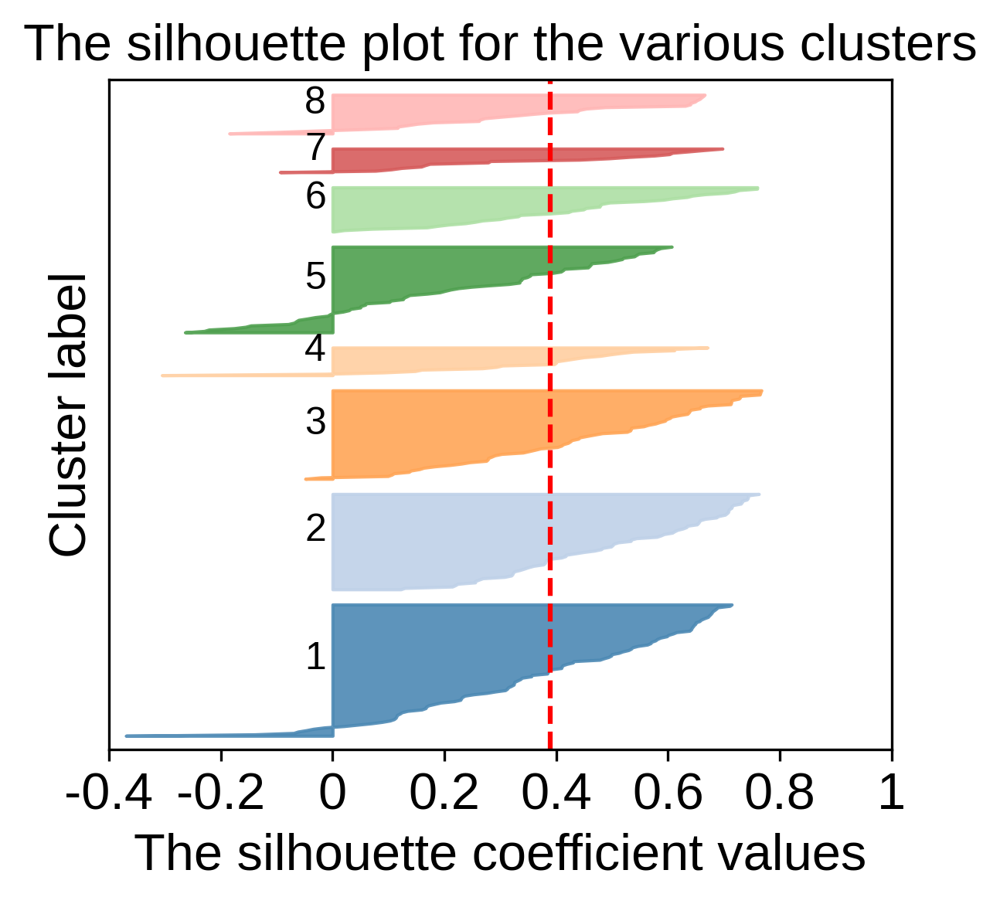

In [105]:
make_silhouette_plot(transformed_data[:,:num_retained_pcs], model.labels_)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_cluster_hungry_vs_safe.svg", transparent=True)


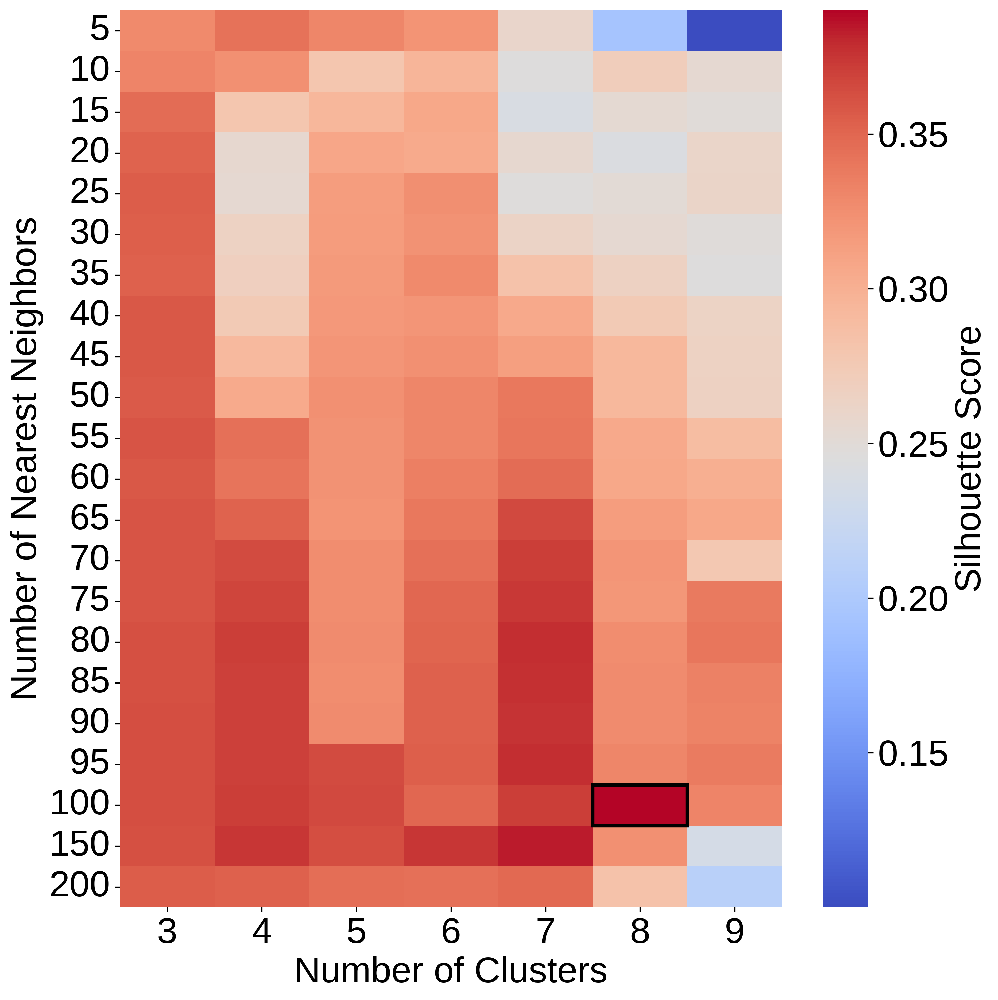

In [106]:
max_n_clusters = 9
possible_n_clusters = np.arange(3, max_n_clusters+1) #This requires a minimum of 2 clusters.
# When the data contain no clusters at all, it will be quite visible when inspecting the two obtained clusters, 
# as the responses of the clusters will be quite similar. This will also be visible when plotting the data in
# the reduced dimensionality PC space (done below).

possible_n_nearest_neighbors = np.array([5, 10, 15, 20, 25,30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90,95, 100, 150, 200]) #np.array([100, 500, 1000, 2000, 4000]) # This should be selected for each dataset

n_clusters_idx = np.where(possible_n_clusters == n_clusters)[0][0]  
n_nearest_neighbors_idx = np.where(possible_n_nearest_neighbors == n_nearest_neighbors)[0][0] 

fig, ax = plt.subplots(figsize = (10, 10), dpi =300)
sns_heatmap = sns.heatmap(silhouette_scores['silhouette_scores'].T, cmap = 'coolwarm', 
                    cbar_kws={'label': 'Silhouette Score'}, ax = ax)
cbar = sns_heatmap.collections[0].colorbar
cbar.ax.set_ylabel('Silhouette Score', fontsize=26)
cbar.ax.tick_params(labelsize=26)  # This sets the tick label size
ax.set_yticklabels(possible_n_nearest_neighbors, rotation = 0, fontsize = 26)
ax.set_xticklabels(possible_n_clusters, fontsize = 26)
ax.set_xlabel('Number of Clusters', fontsize = 26)
ax.set_ylabel('Number of Nearest Neighbors', fontsize = 26)

rectangle = patches.Rectangle((n_clusters_idx, n_nearest_neighbors_idx), 1, 1, linewidth=2.5, edgecolor='black', facecolor='none', transform=ax.transData)
ax.add_patch(rectangle)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_cluster_hungry_vs_safe_num_silhouette.svg", transparent=True)

plt.show()

In [562]:
# np.savetxt(os.path.join(basedir, "populationdata_hungry_vs_save.csv"), populationdata, delimiter=",")
# np.savetxt(os.path.join(basedir, "newlabels_hungry_vs_save.csv"), newlabels, delimiter=",")

In [107]:
populationdata = pd.read_csv(os.path.join(basedir, "populationdata_hungry_vs_save.csv"), header = None).to_numpy()
newlabels = pd.read_csv(os.path.join(basedir, "newlabels_hungry_vs_save.csv"), header = None).to_numpy(dtype = int)
uniquelabels = np.unique(newlabels)


/tmp/ipykernel_68145/816047798.py:70: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


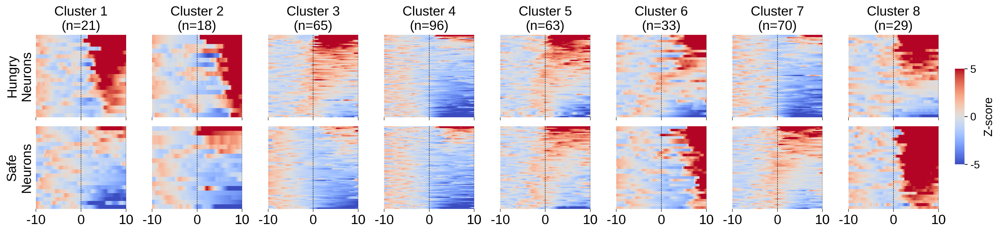

In [108]:
cmax = 5
cmin = -5
#sortwindow = [15, 100]
sortwindow = [pre_window_size+1, window_size]

fig, axs = plt.subplots(len(trial_types),len(uniquelabels),
                        figsize=(2*len(uniquelabels),2*len(trial_types)), dpi = 300)
cbar_ax = fig.add_axes([1, .3, .01, .4])
cbar_ax.tick_params(width=0.8) 

numroisincluster = np.nan*np.ones((len(uniquelabels),))

for c, cluster in enumerate(uniquelabels):
    for k, tempkey in enumerate(trial_types):
        temp = populationdata[np.where(newlabels==cluster)[0], k*window_size:(k+1)*window_size]
        numroisincluster[c] = temp.shape[0]
        sortresponse = np.argsort(np.mean(temp[:,sortwindow[0]:sortwindow[1]], axis=1))[::-1]
        sns.heatmap(temp[sortresponse],
                    ax=axs[k, cluster],
                    cmap=plt.get_cmap('coolwarm'),
                    vmin=cmin,
                    vmax=cmax,
                    cbar=(cluster==0),
                    cbar_ax=cbar_ax if (cluster==0) else None,
                    cbar_kws={'label': 'Z-score'},
                    rasterized=True)
        axs[k, cluster].grid(False)
        if k==len(trial_types)-1:
            axs[k, cluster].set_xticks([0, pre_window_size,
                                        pre_window_size + frames_to_reward, window_size])
            axs[k, cluster].set_xticklabels([str(int(round((a-pre_window_size+0.0)/framerate)))
                                         for a in [0, pre_window_size,
                                                   pre_window_size + frames_to_reward, window_size]])
        else:
            axs[k, cluster].set_xticks([])
        axs[k, cluster].tick_params(width=0.5, labelsize=16)
        axs[k, cluster].set_xticks([0, pre_window_size,
                            pre_window_size + frames_to_reward, window_size])

        
        axs[k, cluster].set_yticks([])
        axs[k, cluster].axvline(pre_window_size, linestyle='--', color='k', linewidth=0.5)
        axs[k, cluster].axvline(pre_window_size + frames_to_reward, linestyle='--', color='k', linewidth=0.5)
        if cluster==0:
            axs[k, 0].set_ylabel('%s\nNeurons'%(tempkey), fontsize = 16)
    axs[0, cluster].set_title('Cluster %d\n(n=%d)'%(cluster+1, numroisincluster[c]), fontsize = 16)

    if cluster == 0:  # Adjustments are only needed for the first cluster where the colorbar is created
        # Set colorbar label size (if needed to adjust)
        cbar_ax.set_ylabel('Z-score', fontsize=14)  # Adjust font size as needed
        cbar_ticks = [cmin, (cmin+cmax)/2, cmax]
        # Update the colorbar ticks
        cbar_ax.set_yticks(cbar_ticks)
        # Optionally, update the tick labels, for example, showing the limits and the midpoint
        cbar_ax.set_yticklabels([str(cmin), f'{(cmin+cmax)/2:.0f}', str(cmax)])
        # Set colorbar tick label size
        cbar_ax.tick_params(labelsize=13)  # Adjust the tick label font size as needed

    
# fig.text(0.5, 0.05, 'Time from cue onset (s)', fontsize=16,
#          horizontalalignment='center', verticalalignment='center', rotation='horizontal')
#fig.tight_layout()

fig.subplots_adjust(wspace=0.2, hspace=0.1)
fig.subplots_adjust(left=0.03)
fig.subplots_adjust(right=0.93)
fig.subplots_adjust(bottom=0.2)
fig.subplots_adjust(top=0.83)

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_cluster_hungry_vs_safe_heatmap.svg", transparent=True, bbox_inches='tight')


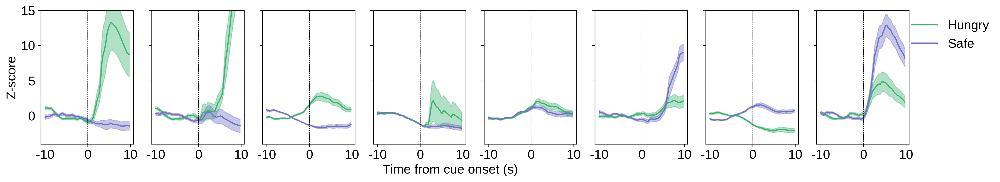

In [109]:
fig, axs = plt.subplots(1, len(uniquelabels),
                        figsize=(2 * len(uniquelabels), 2 * len(trial_types)-1),dpi =300)

numroisincluster = np.nan * np.ones((len(uniquelabels),))
colors = ['mediumseagreen', '#7171C6']
trials = trial_types
lines = []

for c, cluster in enumerate(uniquelabels):
    for k, tempkey in enumerate(trial_types):
        temp = populationdata[np.where(newlabels == cluster)[0], k * window_size:(k + 1) * window_size]
        numroisincluster[c] = temp.shape[0]

        mean_temp = np.mean(temp, axis=0)
        std_temp = np.std(temp, axis=0)/np.sqrt(len(temp))

        # Store the Line2D instances for creating the legend later
        line, = axs[cluster].plot(mean_temp, label= trials[k], color= colors[k])
        lines.append(line)

        axs[cluster].fill_between(range(len(mean_temp)), mean_temp - std_temp, mean_temp + std_temp,
                                     color=colors[k], alpha=0.4)

        #axs[cluster].grid(True)
        if k == len(trial_types) - 1:
            axs[cluster].set_xticks([0, pre_window_size,
                                        pre_window_size + frames_to_reward, window_size])
        else:
            axs[cluster].set_xticks([])

        axs[cluster].tick_params(width=0.5)
        axs[cluster].set_xticks([0, pre_window_size,
                                     pre_window_size + frames_to_reward, window_size])

        axs[cluster].set_xticklabels([str(int(round((a-pre_window_size+0.0)/framerate)))
                                          for a in [0, pre_window_size,
                                                    pre_window_size + frames_to_reward, window_size]])
        #axs[k, cluster].set_yticks()
        axs[cluster].set_ylim(-4,15)
        axs[cluster].axvline(pre_window_size, linestyle='--', color='k', linewidth=0.5)
        axs[cluster].axhline(0, linestyle='--', color='k', linewidth=0.5)
        #axs[cluster].axvline(pre_window_size + frames_to_reward, linestyle='--', color='k', linewidth=0.5)
        if cluster != 0:
            axs[cluster].set_yticklabels([])
        if cluster == 0:
            axs[0].set_ylabel('Z-score', fontsize = 16)
 
#     axs[cluster].set_title('Cluster %d\n(n=%d)' % (cluster + 1, numroisincluster[c]), fontsize = 16)
    axs[cluster].tick_params(labelsize=16)

# Create the legend at the end, outside of the loop
fig.legend(lines, trials,frameon = False, loc='center right', bbox_to_anchor=(0.585, 0.53, 0.5, 0.5), fontsize = 16 )

fig.text(0.49, 0.0, 'Time from cue onset (s)', fontsize=16,
         horizontalalignment='center', verticalalignment='center', rotation='horizontal')

fig.subplots_adjust(wspace=0.2, hspace=0.1)
fig.subplots_adjust(left=0.03)
fig.subplots_adjust(right=0.93)
fig.subplots_adjust(bottom=0.2)
fig.subplots_adjust(top=0.83)

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_cluster_hungry_vs_safe_hline.svg", transparent=True,  bbox_inches='tight')

plt.show()

In [110]:
hungry_data = populationdata[np.where(newlabels == 7)[0], 0 * window_size:(0 + 1) * window_size]
safe_data = populationdata[np.where(newlabels == 7)[0], 1 * window_size:(1 + 1) * window_size]

In [111]:
Bins_before+int(1.5*FR/BinSize)

38

In [112]:
np.where(hungry_data[:, Bins_before:Bins_before+int(1.5*FR/BinSize)] > 0,
                       hungry_data[:, Bins_before:Bins_before+int(1.5*FR/BinSize)],
                       0).sum(axis=1)

array([7.96147013e-01, 0.00000000e+00, 0.00000000e+00, 3.48953661e+00,
       5.62709729e+00, 0.00000000e+00, 0.00000000e+00, 5.21130985e+00,
       2.64177852e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       4.92254087e+00, 5.62242391e+00, 1.20683948e+01, 1.29678278e+01,
       1.20489345e+01, 0.00000000e+00, 1.25610153e+01, 2.64312954e+01,
       0.00000000e+00, 1.37680658e+01, 6.32741233e+00, 7.99648669e+00,
       0.00000000e+00, 2.10035862e-02, 5.50582297e+01, 5.10677450e+00,
       7.20559234e+00])

In [113]:
data_hungry = hungry_data[:, Bins_before:Bins_before+int(1.5*FR/BinSize)].sum(axis = 1)
data_safe = safe_data[:, Bins_before:Bins_before+int(1.5*FR/BinSize)].sum(axis = 1)

In [114]:


# For 'hungry_data', sum only positive values in the specified range
data_hungry = np.where(hungry_data[:, Bins_before:Bins_before+int(1.5*FR/BinSize)] > 0,
                       hungry_data[:, Bins_before:Bins_before+int(1.5*FR/BinSize)],
                       0).sum(axis=1)

# For 'safe_data', sum only positive values in the specified range
data_safe = np.where(safe_data[:, Bins_before:Bins_before+int(1.5*FR/BinSize)] > 0,
                     safe_data[:, Bins_before:Bins_before+int(1.5*FR/BinSize)],
                     0).sum(axis=1)


/work/09117/xz6783/ls6/Anaconda/envs/sklearn/lib/python3.11/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


Wilcoxon signed-rank test results: Statistics = 111.0, p-value = 0.4115302280988584


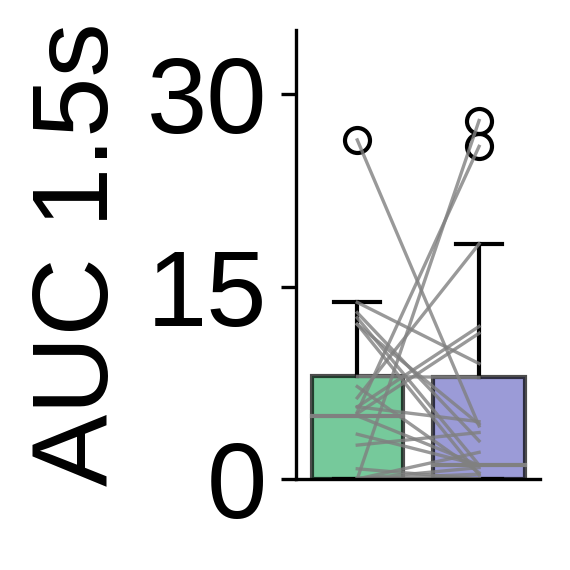

In [115]:
normality1 = stats.shapiro(data_hungry - data_safe)

# Check if both datasets are normally distributed
if normality1[1] > 0.05:
    # Perform paired t-test
    t_stat, p_value = stats.ttest_rel(data_hungry, data_safe)
    print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
else:
    # Perform Wilcoxon signed-rank test
    w_stat, p_value = stats.wilcoxon(data_hungry, data_safe)
    print(f"Wilcoxon signed-rank test results: Statistics = {w_stat}, p-value = {p_value}")

    
# Combine the data into a list of arrays for boxplot
data_to_plot = [data_hungry, data_safe]

fig, ax = plt.subplots(figsize = (2,2),dpi =300)
# Create the boxplot
positions = [1, 1.2]  # Adjust the positions to control the distance between boxplots
boxplots = ax.boxplot(data_to_plot, positions=positions, widths=0.15, patch_artist=True)  # Adjust the width as needed

colors = ['mediumseagreen', '#7171C6']
for patch, color in zip(boxplots['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# Change the median line color
median_color = 'grey'  # Change this to your desired color
for median in boxplots['medians']:
    median.set_color(median_color)
    median.set_linewidth(1)  # You can adjust the line width as needed

# Add connecting lines for individual points
for p1, p2 in zip(data_hungry, data_safe):
    ax.plot([1, 1.2], [p1, p2], color="grey", alpha=0.8, lw = 0.8)
    
# Set x-tick labels if needed
ax.set_xticks([])
ax.set_ylabel('AUC 1.5s', fontsize = 26)
ax.set_ylim(0, 35)
ax.set_xlim(0.9, 1.3)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
ax.yaxis.set_major_locator(MaxNLocator(3,integer=True))
ax.tick_params(labelsize = 26)
if p_value< 0.05:
    x1, x2 = 1, 1.25
    y, h, col = ax.get_ylim()[1]-5, 0, 'k'
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c=col,clip_on=False)
    ax.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col, fontsize = 28)

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_cluster_hungry_vs_safe_box.svg", transparent=False)


plt.show()

In [116]:
cluster8_inhungry =np.where(newlabels == 7)[0]

/tmp/ipykernel_68145/1642042210.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_for_cluster = [desaturate_color(cm.get_cmap("tab20")(i / 20.0), 0.7) for i in range(0,20)]


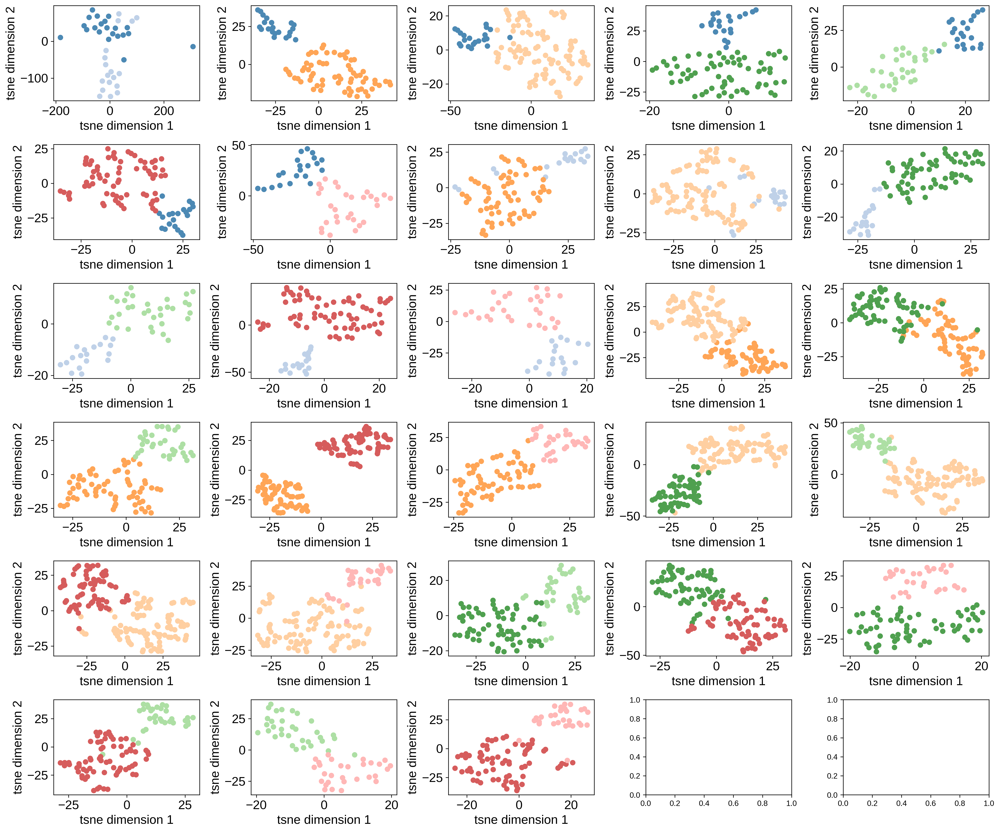

In [120]:
colors_for_cluster = [[0.933, 0.250, 0.211],
                      [0.941, 0.352, 0.156],
                      [0.964, 0.572, 0.117],
                      [0.980, 0.686, 0.250],
                      [0.545, 0.772, 0.247],
                      [0.215, 0.701, 0.290],
                      [0, 0.576, 0.270],
                      [0, 0.650, 0.611],
                      [0.145, 0.662, 0.878]]

def desaturate_color(rgb_color, saturation_factor):
    # Convert RGB to HSV
    hsv_color = rgb_to_hsv(rgb_color[:3])  # Exclude the alpha value if present
    # Reduce the saturation component
    hsv_color[1] *= saturation_factor
    # Convert back to RGB and return with original alpha if it was included
    return hsv_to_rgb(hsv_color)


colors_for_cluster = [desaturate_color(cm.get_cmap("tab20")(i / 20.0), 0.7) for i in range(0,20)]

num_clusterpairs = len(uniquelabels)*(len(uniquelabels)-1)/2

numrows = int(np.ceil(num_clusterpairs**0.5))
numcols = int(np.ceil(num_clusterpairs/np.ceil(num_clusterpairs**0.5)))
fig, axs = plt.subplots(numrows, numcols, figsize=(3*numrows, 3*numcols), dpi =300)

tempsum = 0
for c1, cluster1 in enumerate(uniquelabels):
    for c2, cluster2 in enumerate(uniquelabels):
        if cluster1>=cluster2:
            continue
        temp1 = transformed_data[np.where(newlabels==cluster1)[0], :num_retained_pcs]
        temp2 = transformed_data[np.where(newlabels==cluster2)[0], :num_retained_pcs]
        X = np.concatenate((temp1, temp2), axis=0)
        tsne = TSNE(n_components=2, init='random',
                    random_state=0, perplexity=X.shape[1]-1)
        Y = tsne.fit_transform(X)
        if numrows * numcols == 1:
            ax = axs
        else:
            ax = axs[tempsum // numcols, tempsum - (tempsum // numcols) * numcols]


        ax.scatter(Y[:np.sum(newlabels==cluster1),0],
                   Y[:np.sum(newlabels==cluster1),1],
                   color=colors_for_cluster[cluster1], alpha=1)
        ax.scatter(Y[np.sum(newlabels==cluster1):,0],
                   Y[np.sum(newlabels==cluster1):,1],
                   color=colors_for_cluster[cluster2], alpha=1)

        ax.set_xlabel('tsne dimension 1', fontsize = 16)
        ax.set_ylabel('tsne dimension 2', fontsize = 16)
        ax.tick_params(labelsize = 16)
#         ax.legend(fontsize = 13, frameon = False)
        tempsum += 1
fig.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_cluster_hungry_vs_safe_tsne.svg", transparent=True)


In [121]:
basedir = './analysis_ouput'
satiated = trace_satiated_crossed.iloc[:,3:].to_numpy(dtype = float)
threat = trace_threat_crossed.iloc[:,3:].to_numpy(dtype = float)

TimeRange = 20
TotalBins = satiated.shape[1]

populationdata_satiated = np.concatenate([satiated,threat],axis =1)
trace_satiated_crossed = trace_satiated_crossed[~np.any(np.isnan(populationdata_satiated), axis=1)]
populationdata_satiated = populationdata_satiated[~np.any(np.isnan(populationdata_satiated), axis=1)]
populationdata_satiated

array([[ 2.09014346,  1.89047442,  1.70040889, ..., -0.50464756,
        -0.62631931, -0.76560259],
       [-0.65276964, -0.45387318, -0.50668327, ..., -0.50464756,
        -0.62631931, -0.76560259],
       [ 1.07226683,  1.69840739,  1.99859503, ..., -2.98613615,
        -3.0684503 , -3.22705399],
       ...,
       [-1.44114198, -1.30920774, -1.17820647, ...,  5.62584757,
         5.01731925,  4.39419772],
       [ 1.92433894,  1.50488066,  1.13234194, ..., -0.76731714,
        -0.85867395, -0.95101937],
       [-1.39101677, -1.21805194, -1.05707948, ..., -5.82481476,
        -5.4116184 , -4.91562466]])

In [122]:
populationdata_satiated.shape

(395, 132)

In [123]:
BinSizeSC = 0.3
framerate = 1/BinSizeSC
pre_window_size = int(0.5*TimeRange*framerate) # 6 seconds multipled by 5 frames. Corresponds to baseline prior to cues.
window_size = TotalBins # Total number of frames plotted around a cue
frames_to_reward = int(0.5*TimeRange*framerate) # 6 seconds until reward after CS+

sortwindow = [pre_window_size, pre_window_size + int(1*framerate)] # Sort responses between CS+ onset and reward.
sortresponse = np.argsort(np.mean(populationdata_satiated[:,sortwindow[0]:sortwindow[1]], axis=1))[::-1]
# sortresponse corresponds to an ordering of the neurons based on their average response in the sortwindow

cmax = 4 # Maximum colormap value. 
cmin = -4

trial_types = ['Satiated', 'Threat']

In [124]:
round((0-pre_window_size+0.0)/framerate)

-10

/tmp/ipykernel_68145/3217375947.py:55: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


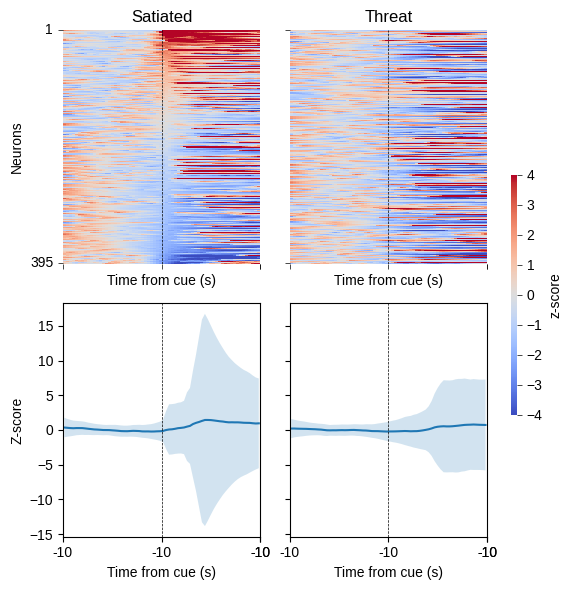

In [125]:
fig, axs = plt.subplots(2,2,figsize=(3*2,3*2), sharex='all', sharey='row')
cbar_ax = fig.add_axes([0.86, .3, .01, .4])
cbar_ax.tick_params(width=0.5) 

def tsplot(ax, data,**kw):
    x = np.arange(window_size)
    est = np.mean(data, axis=0)
    sd = np.std(data, axis=0)
    cis = (est - sd, est + sd)
    ax.fill_between(x+0.5,cis[0],cis[1], alpha=0.2, **kw)
    ax.plot(x+0.5,est,**kw)
    ax.margins(x=0)


for t in range(len(trial_types)):
    axs[0,t].set_title(trial_types[t])
    ax = axs[0,t]
    sns.heatmap(populationdata_satiated[sortresponse, t*window_size: (t+1)*window_size],
                ax=ax,
                cmap=plt.get_cmap('coolwarm'),
                vmin=cmin,
                vmax=cmax,
                cbar=(t==0),
                cbar_ax=cbar_ax if (t==0) else None,
                cbar_kws={'label': 'z-score'})
    ax.grid(False)
    ax.tick_params(width=0.5)   
    ax.set_xticks([0, pre_window_size, pre_window_size + frames_to_reward, window_size]) 
    ax.set_xticklabels([str(int((a-pre_window_size+0.0)/framerate))
                                     for a in [0, pre_window_size,
                                               pre_window_size + frames_to_reward, window_size]])
    ax.set_yticks([0, len(sortresponse)-1])
    ax.set_yticklabels(['1', str(len(sortresponse))])
    ax.axvline(pre_window_size, linestyle='--', color='k', linewidth=0.5)    
    ax.axvline(pre_window_size + frames_to_reward, linestyle='--', color='k', linewidth=0.5)    
    ax.set_xlabel('Time from cue (s)')
    
        
    ax = axs[1,t]
    tsplot(ax, populationdata_satiated[sortresponse, t*window_size:(t+1)*window_size])
    ax.set_xticks(np.arange(0, window_size + 1, frames_to_reward))
    ax.set_xticklabels([str(int(round((a-pre_window_size+0.0)/framerate))) for a in np.arange(0, window_size + 1, frames_to_reward)])

    ax.axvline(pre_window_size, linestyle='--', color='k', linewidth=0.5)    
    ax.axvline(pre_window_size + frames_to_reward, linestyle='--', color='k', linewidth=0.5)    
    ax.set_xlabel('Time from cue (s)')
    ax.set_xticks([0, pre_window_size, pre_window_size + frames_to_reward, window_size]) 
    ax.set_xticklabels([str(int(round((0-pre_window_size+0.0)/framerate)))
                                     for a in [0, pre_window_size,
                                               pre_window_size + frames_to_reward, window_size]])

axs[0,0].set_ylabel('Neurons')
axs[1,0].set_ylabel('Z-score')

fig.tight_layout()
fig.subplots_adjust(right=0.82)

Number of PCs = 132
Number of PCs to keep = 9


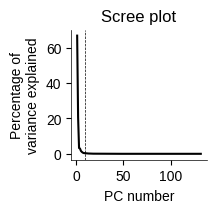

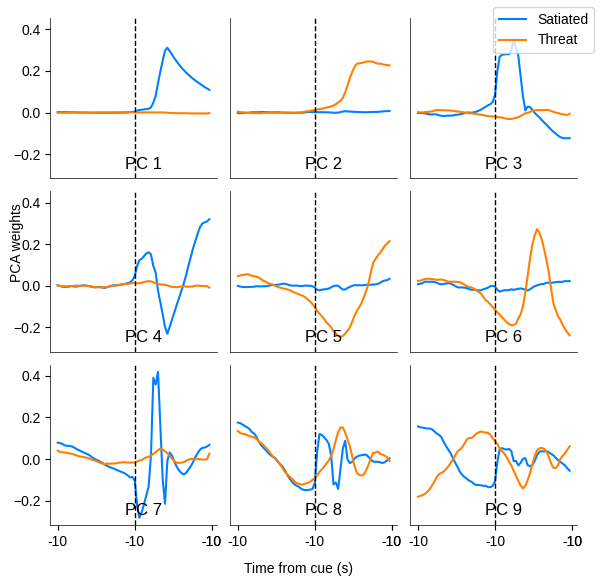

In [126]:
load_savedpca_or_dopca = 'dopca'
# Select 'dopca' for doing PCA on the data. Select 'savedpca' for loading my previous results

if load_savedpca_or_dopca == 'dopca':
    pca = PCA(n_components=populationdata_satiated.shape[1], whiten=True)
    pca.fit(populationdata_satiated) 
    with open(os.path.join(basedir, 'pcaresults_satiated_vs_threat.pickle'), 'wb') as f:
        pickle.dump(pca, f)
elif load_savedpca_or_dopca == 'savedpca':
    with open(os.path.join(basedir, 'pcaresults_satiated_vs_threat.pickle'), 'rb') as f:
        pca = pickle.load(f)
    
transformed_data = pca.transform(populationdata_satiated)

pca_vectors = pca.components_
print ('Number of PCs = %d'%(pca_vectors.shape[0]))

x = 100*pca.explained_variance_ratio_
xprime = x - (x[0] + (x[-1]-x[0])/(x.size-1)*np.arange(x.size))
#xprime = (x - np.mean(x))/(np.max(x)-np.min(x))
num_retained_pcs = 9#np.min(np.where(np.cumsum(x)>50))+1 #np.argmin(xprime)
# Number of PCs to be kept is defined as the number at which the 
# scree plot bends. This is done by simply bending the scree plot
# around the line joining (1, variance explained by first PC) and
# (num of PCs, variance explained by the last PC) and finding the 
# number of components just below the minimum of this rotated plot
print ('Number of PCs to keep = %d'%(num_retained_pcs))

fig, ax = plt.subplots(figsize=(2,2))
ax.plot(np.arange(pca.explained_variance_ratio_.shape[0]).astype(int)+1, x, 'k')
ax.set_ylabel('Percentage of\nvariance explained')
ax.set_xlabel('PC number')
ax.axvline(num_retained_pcs, linestyle='--', color='k', linewidth=0.5)
ax.set_title('Scree plot')
#ax.set_xlim([0,5])
[i.set_linewidth(0.5) for i in ax.spines.values()]
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

fig.subplots_adjust(left=0.3)
fig.subplots_adjust(right=0.98)
fig.subplots_adjust(bottom=0.25)
fig.subplots_adjust(top=0.9)

colors_for_key = {}
colors_for_key[trial_types[0]] = (0,0.5,1)
colors_for_key[trial_types[1]] = (1,0.5,0)

numcols = 3.0
fig, axs = plt.subplots(int(np.ceil(num_retained_pcs/numcols)), int(numcols), sharey='all',
                        figsize=(2*numcols, 2*int(np.ceil(num_retained_pcs/numcols))))
for pc in range(num_retained_pcs):
    ax = axs.flat[pc]
    for k, tempkey in enumerate(trial_types):
        ax.plot(pca_vectors[pc, k*window_size:(k+1)*window_size], color=colors_for_key[tempkey],
                label='PC %d: %s'%(pc+1, tempkey))
    ax.axvline(pre_window_size, linestyle='--', color='k', linewidth=1)
    ax.annotate(text='PC %d'%(pc+1), xy=(0.45, 0.06), xytext=(0.45, 0.06), xycoords='axes fraction',
            textcoords='axes fraction', multialignment='center', size='large')
    if pc >= num_retained_pcs-numcols:
        ax.set_xticks([0, pre_window_size,
                       pre_window_size + frames_to_reward, window_size])
        ax.set_xticklabels([str(int(round((0-pre_window_size+0.0)/framerate)))
                             for a in [0, pre_window_size,
                                       pre_window_size + frames_to_reward, window_size]])
    else:
        ax.set_xticks([])
        ax.xaxis.set_ticks_position('none')
    if pc%numcols:
        ax.yaxis.set_ticks_position('none')
    [i.set_linewidth(0.5) for i in ax.spines.values()]
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)


fig.text(0.5, 0.05, 'Time from cue (s)', horizontalalignment='center', rotation='horizontal')
fig.text(0.02, 0.6, 'PCA weights', verticalalignment='center', rotation='vertical')
fig.tight_layout()
fig.legend(trial_types,)
for ax in axs.flat[num_retained_pcs:]:
    ax.set_visible(False)

fig.subplots_adjust(wspace=0.08, hspace=0.08)
fig.subplots_adjust(bottom=0.13)

In [127]:
sum(x[:9])

97.94573416720083

In [421]:
max_n_clusters = 9 # Maximum number of clusters expected. I already ran this with up to 20 clusters and know
# that the optimal number is 9. So, I am leaving this at 11. In your data, might be worth increasing this, but
# it will take more time to run.

possible_n_clusters = np.arange(3, max_n_clusters+1) #This requires a minimum of 2 clusters.
# When the data contain no clusters at all, it will be quite visible when inspecting the two obtained clusters, 
# as the responses of the clusters will be quite similar. This will also be visible when plotting the data in
# the reduced dimensionality PC space (done below).

possible_n_nearest_neighbors = np.array([5, 10, 15, 20, 25,30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90,95, 100, 150, 200]) #np.array([100, 500, 1000, 2000, 4000]) # This should be selected for each dataset

# possible_n_nearest_neighbors = np.array([5, 10, 50, 80,100, 200, 300]) #np.array([100, 500, 1000, 2000, 4000]) # This should be selected for each dataset
# appropriately. When 4813 neurons are present, the above number of nearest neighbors provides a good sweep of the
# parameter space. But it will need to be changed for other data.
    
silhouette_scores = np.nan*np.ones((possible_n_clusters.size,
                                    possible_n_nearest_neighbors.size))

for n_clustersidx, n_clusters in enumerate(possible_n_clusters):
    for nnidx, nn in enumerate(possible_n_nearest_neighbors):
        model = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', n_neighbors=nn)
        model.fit(transformed_data[:,:num_retained_pcs])
        silhouette_scores[n_clustersidx, nnidx] = silhouette_score(transformed_data[:,:num_retained_pcs],
                                                                   model.labels_,
                                                                   metric='cosine')
        print ('Done with numclusters = %d, num nearest neighbors = %d: score = %.3f'%(n_clusters,
                                                                                      nn,
                                                                                      silhouette_scores[n_clustersidx,                                                                           
                                                                                                        nnidx]))

print ('Done with model fitting')

temp = {}
temp['possible_n_clusters'] = possible_n_clusters
temp['possible_n_nearest_neighbors'] = possible_n_nearest_neighbors
temp['silhouette_scores'] = silhouette_scores
temp['shape'] = 'cluster_nn'
with open(os.path.join(basedir, 'silhouette_scores_satiated_threat.pickle'), 'wb') as f:
    pickle.dump(temp, f)

Done with numclusters = 3, num nearest neighbors = 5: score = 0.260
Done with numclusters = 3, num nearest neighbors = 10: score = 0.284
Done with numclusters = 3, num nearest neighbors = 15: score = 0.312
Done with numclusters = 3, num nearest neighbors = 20: score = 0.308
Done with numclusters = 3, num nearest neighbors = 25: score = 0.314
Done with numclusters = 3, num nearest neighbors = 30: score = 0.318
Done with numclusters = 3, num nearest neighbors = 35: score = 0.318
Done with numclusters = 3, num nearest neighbors = 40: score = 0.318
Done with numclusters = 3, num nearest neighbors = 45: score = 0.319
Done with numclusters = 3, num nearest neighbors = 50: score = 0.320
Done with numclusters = 3, num nearest neighbors = 55: score = 0.322
Done with numclusters = 3, num nearest neighbors = 60: score = 0.320
Done with numclusters = 3, num nearest neighbors = 65: score = 0.324
Done with numclusters = 3, num nearest neighbors = 70: score = 0.325
Done with numclusters = 3, num near

Done with numclusters = 8, num nearest neighbors = 65: score = 0.406
Done with numclusters = 8, num nearest neighbors = 70: score = 0.405
Done with numclusters = 8, num nearest neighbors = 75: score = 0.407
Done with numclusters = 8, num nearest neighbors = 80: score = 0.405
Done with numclusters = 8, num nearest neighbors = 85: score = 0.410
Done with numclusters = 8, num nearest neighbors = 90: score = 0.410
Done with numclusters = 8, num nearest neighbors = 95: score = 0.402
Done with numclusters = 8, num nearest neighbors = 100: score = 0.405
Done with numclusters = 8, num nearest neighbors = 150: score = 0.382
Done with numclusters = 8, num nearest neighbors = 200: score = 0.318
Done with numclusters = 9, num nearest neighbors = 5: score = 0.303
Done with numclusters = 9, num nearest neighbors = 10: score = 0.376
Done with numclusters = 9, num nearest neighbors = 15: score = 0.379
Done with numclusters = 9, num nearest neighbors = 20: score = 0.383
Done with numclusters = 9, num n

In [128]:
with open(os.path.join(basedir, 'silhouette_scores_satiated_threat.pickle'), 'rb') as f:
    silhouette_scores = pickle.load(f)
    
transformed_data = transformed_data #np.load(os.path.join(basedir, 'OFCCaMKII_transformed_data.npy'))

# Identify optimal parameters from the above parameter space
temp = np.where(silhouette_scores['silhouette_scores']==np.nanmax(silhouette_scores['silhouette_scores']))
n_clusters = silhouette_scores['possible_n_clusters'][temp[0][0]]
n_nearest_neighbors = silhouette_scores['possible_n_nearest_neighbors'][temp[1][0]]

print (n_clusters, n_nearest_neighbors)

# Redo clustering with these optimal parameters
model = SpectralClustering(n_clusters=n_clusters,
                           affinity='nearest_neighbors',
                           n_neighbors=n_nearest_neighbors)

# model = KMeans(n_clusters=n_clusters)

# model = AgglomerativeClustering(n_clusters=9,
#                                 affinity='l1',
#                                 linkage='average')

model.fit(transformed_data[:,:num_retained_pcs])

temp = silhouette_score(transformed_data[:,:num_retained_pcs], model.labels_, metric='cosine')

print ('Number of clusters = %d, average silhouette = %.3f'%(len(set(model.labels_)), temp))

# Save this optimal clustering model.
# with open(os.path.join(basedir, 'clusteringmodel.pickle'), 'wb') as f:
#     pickle.dump(model, f)

          
# Since the clustering labels are arbitrary, I rename the clusters so that the first cluster will have the most
# positive response and the last cluster will have the most negative response.
def reorder_clusters(rawlabels):
    uniquelabels = list(set(rawlabels))
    responses = np.nan*np.ones((len(uniquelabels),))
    for l, label in enumerate(uniquelabels):
        responses[l] = np.mean(populationdata_satiated[rawlabels==label, pre_window_size:2*pre_window_size])-np.mean(populationdata_satiated[rawlabels==label, window_size+pre_window_size:window_size+2*pre_window_size])
    temp = np.argsort(responses).astype(int)[::-1]
    temp = np.array([np.where(temp==a)[0][0] for a in uniquelabels])
    outputlabels = np.array([temp[a] for a in list(np.digitize(rawlabels, uniquelabels)-1)])
    return outputlabels
newlabels = reorder_clusters(model.labels_)

# Create a new variable containing all unique cluster labels
uniquelabels = list(set(newlabels))

# np.save(os.path.join(basedir, 'OFCCaMKII_clusterlabels.npy'), newlabels)

colors_for_cluster = [[0.933, 0.250, 0.211],
                      [0.941, 0.352, 0.156],
                      [0.964, 0.572, 0.117],
                      [0.980, 0.686, 0.250],
                      [0.545, 0.772, 0.247],
                      [0.215, 0.701, 0.290],
                      [0, 0.576, 0.270],
                      [0, 0.650, 0.611],
                      [0.145, 0.662, 0.878]]

def desaturate_color(rgb_color, saturation_factor):
    # Convert RGB to HSV
    hsv_color = rgb_to_hsv(rgb_color[:3])  # Exclude the alpha value if present
    # Reduce the saturation component
    hsv_color[1] *= saturation_factor
    # Convert back to RGB and return with original alpha if it was included
    return hsv_to_rgb(hsv_color)


colors_for_cluster = [desaturate_color(cm.get_cmap("tab20")(i / 20.0), 0.7) for i in range(0,20)]


8 85
Number of clusters = 8, average silhouette = 0.409


/tmp/ipykernel_68145/2336075705.py:72: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_for_cluster = [desaturate_color(cm.get_cmap("tab20")(i / 20.0), 0.7) for i in range(0,20)]


In [129]:
def make_silhouette_plot(X, cluster_labels):
    
    n_clusters = len(set(cluster_labels))
    
    fig, ax = plt.subplots(1, 1, dpi = 300)
    fig.set_size_inches(4, 4)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax.set_xlim([-0.4, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax.set_ylim([0, len(X) + (n_clusters + 1) * 10])
    silhouette_avg = silhouette_score(X, cluster_labels, metric='cosine')

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels, metric='cosine')

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = colors_for_cluster[i]
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.9)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i+1), fontsize = 12)

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax.set_title("The silhouette plot for the various clusters", fontsize = 16)
    ax.set_xlabel("The silhouette coefficient values",  fontsize = 16)
    ax.set_ylabel("Cluster label",  fontsize = 16)

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])
    ax.set_xticklabels([-0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1], fontsize = 16)

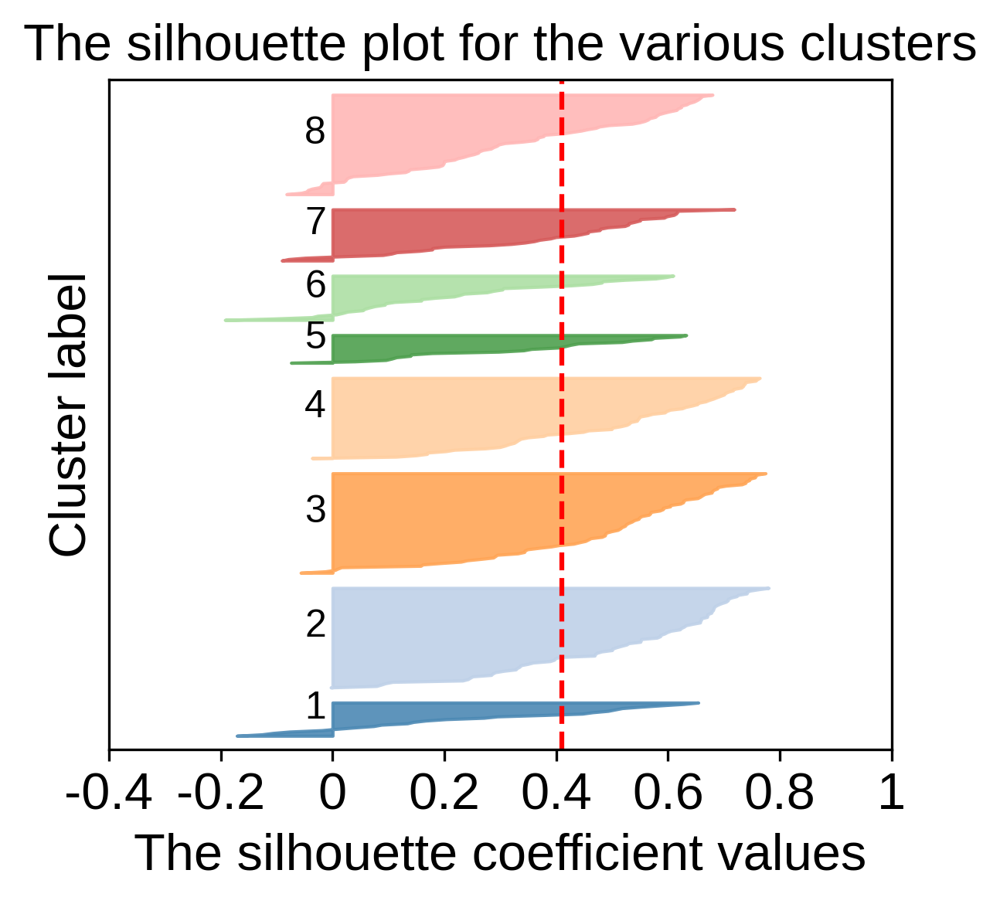

In [130]:
make_silhouette_plot(transformed_data[:,:num_retained_pcs], model.labels_)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_cluster_satiated_vs_threat.svg", transparent=True)


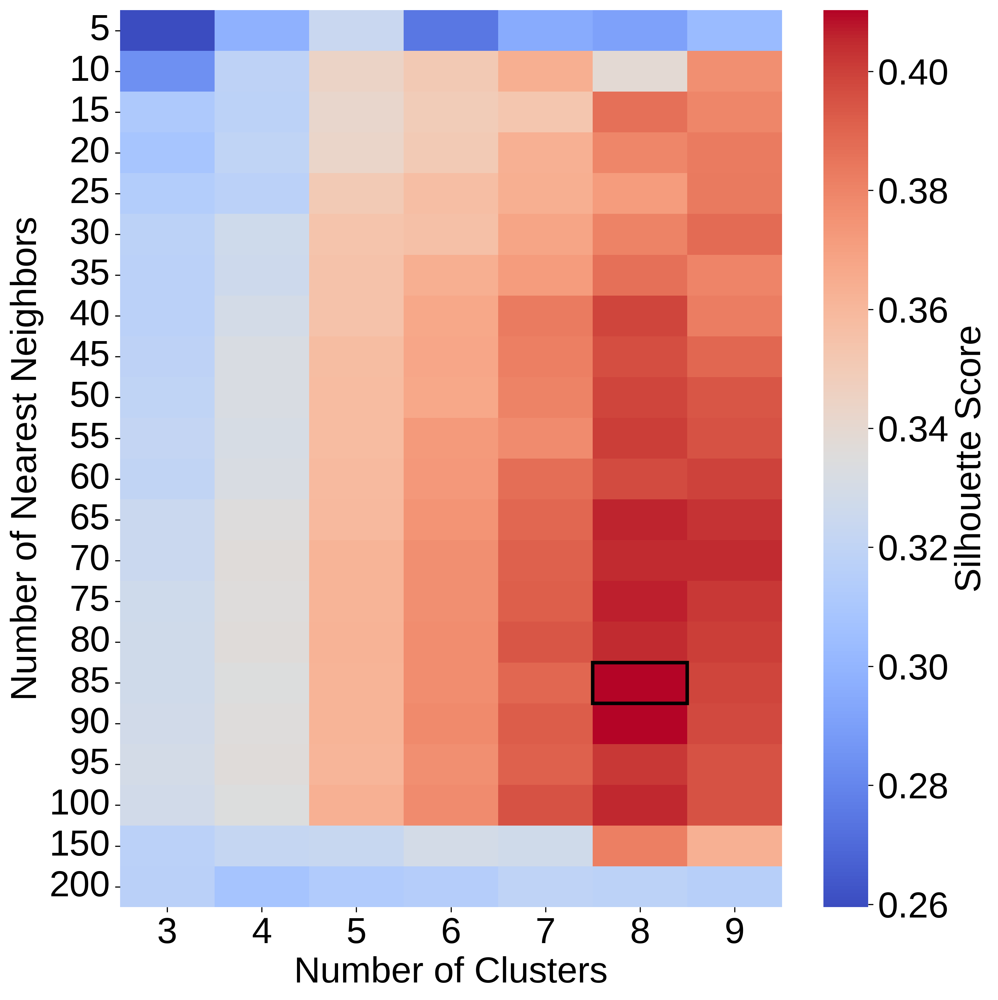

In [131]:
max_n_clusters = 9
possible_n_clusters = np.arange(3, max_n_clusters+1) #This requires a minimum of 2 clusters.
# When the data contain no clusters at all, it will be quite visible when inspecting the two obtained clusters, 
# as the responses of the clusters will be quite similar. This will also be visible when plotting the data in
# the reduced dimensionality PC space (done below).

possible_n_nearest_neighbors = np.array([5, 10, 15, 20, 25,30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90,95, 100, 150, 200]) #np.array([100, 500, 1000, 2000, 4000]) # This should be selected for each dataset

n_clusters_idx = np.where(possible_n_clusters == n_clusters)[0][0]  
n_nearest_neighbors_idx = np.where(possible_n_nearest_neighbors == n_nearest_neighbors)[0][0] 

fig, ax = plt.subplots(figsize = (10, 10), dpi =300)
sns_heatmap = sns.heatmap(silhouette_scores['silhouette_scores'].T, cmap = 'coolwarm', 
                    cbar_kws={'label': 'Silhouette Score'}, ax = ax)
cbar = sns_heatmap.collections[0].colorbar
cbar.ax.set_ylabel('Silhouette Score', fontsize=26)
cbar.ax.tick_params(labelsize=26)  # This sets the tick label size
ax.set_yticklabels(possible_n_nearest_neighbors, rotation = 0, fontsize = 26)
ax.set_xticklabels(possible_n_clusters, fontsize = 26)
ax.set_xlabel('Number of Clusters', fontsize = 26)
ax.set_ylabel('Number of Nearest Neighbors', fontsize = 26)

rectangle = patches.Rectangle((n_clusters_idx, n_nearest_neighbors_idx), 1, 1, linewidth=2.5, edgecolor='black', facecolor='none', transform=ax.transData)
ax.add_patch(rectangle)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_cluster_satiated_vs_threat_num_silhouette.svg", transparent=True)

plt.show()

In [132]:
# np.savetxt(os.path.join(basedir, "populationdata_satiated_satiated_vs_threat.csv"), populationdata_satiated, delimiter=",")
# np.savetxt(os.path.join(basedir, "newlabels_satiated_vs_threat.csv"), newlabels, delimiter=",")

In [133]:
populationdata_satiated = pd.read_csv(os.path.join(basedir, "populationdata_satiated_vs_threat.csv"), header = None).to_numpy()
newlabels_satiated = pd.read_csv(os.path.join(basedir, "newlabels_satiated_vs_threat.csv"), header = None).to_numpy(dtype = int)
uniquelabels = np.unique(newlabels_satiated)


/tmp/ipykernel_68145/3863442498.py:70: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


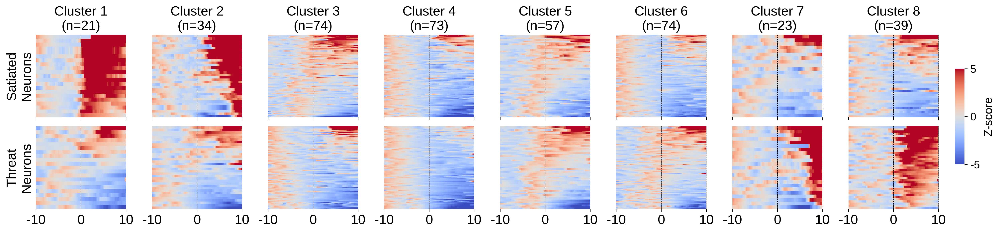

In [134]:
cmax = 5
cmin = -5
#sortwindow = [15, 100]
sortwindow = [pre_window_size+1, window_size]

fig, axs = plt.subplots(len(trial_types),len(uniquelabels),
                        figsize=(2*len(uniquelabels),2*len(trial_types)), dpi = 300)
cbar_ax = fig.add_axes([1, .3, .01, .4])
cbar_ax.tick_params(width=0.8) 

numroisincluster = np.nan*np.ones((len(uniquelabels),))

for c, cluster in enumerate(uniquelabels):
    for k, tempkey in enumerate(trial_types):
        temp = populationdata_satiated[np.where(newlabels_satiated==cluster)[0], k*window_size:(k+1)*window_size]
        numroisincluster[c] = temp.shape[0]
        sortresponse = np.argsort(np.mean(temp[:,sortwindow[0]:sortwindow[1]], axis=1))[::-1]
        sns.heatmap(temp[sortresponse],
                    ax=axs[k, cluster],
                    cmap=plt.get_cmap('coolwarm'),
                    vmin=cmin,
                    vmax=cmax,
                    cbar=(cluster==0),
                    cbar_ax=cbar_ax if (cluster==0) else None,
                    cbar_kws={'label': 'Z-score'},
                    rasterized=True)
        axs[k, cluster].grid(False)
        if k==len(trial_types)-1:
            axs[k, cluster].set_xticks([0, pre_window_size,
                                        pre_window_size + frames_to_reward, window_size])
            axs[k, cluster].set_xticklabels([str(int(round((a-pre_window_size+0.0)/framerate)))
                                         for a in [0, pre_window_size,
                                                   pre_window_size + frames_to_reward, window_size]])
        else:
            axs[k, cluster].set_xticks([])
        axs[k, cluster].tick_params(width=0.5, labelsize=16)
        axs[k, cluster].set_xticks([0, pre_window_size,
                            pre_window_size + frames_to_reward, window_size])

        
        axs[k, cluster].set_yticks([])
        axs[k, cluster].axvline(pre_window_size, linestyle='--', color='k', linewidth=0.5)
        axs[k, cluster].axvline(pre_window_size + frames_to_reward, linestyle='--', color='k', linewidth=0.5)
        if cluster==0:
            axs[k, 0].set_ylabel('%s\nNeurons'%(tempkey), fontsize = 16)
    axs[0, cluster].set_title('Cluster %d\n(n=%d)'%(cluster+1, numroisincluster[c]), fontsize = 16)

    if cluster == 0:  # Adjustments are only needed for the first cluster where the colorbar is created
        # Set colorbar label size (if needed to adjust)
        cbar_ax.set_ylabel('Z-score', fontsize=14)  # Adjust font size as needed
        cbar_ticks = [cmin, (cmin+cmax)/2, cmax]
        # Update the colorbar ticks
        cbar_ax.set_yticks(cbar_ticks)
        # Optionally, update the tick labels, for example, showing the limits and the midpoint
        cbar_ax.set_yticklabels([str(cmin), f'{(cmin+cmax)/2:.0f}', str(cmax)])
        # Set colorbar tick label size
        cbar_ax.tick_params(labelsize=13)  # Adjust the tick label font size as needed

    
# fig.text(0.5, 0.05, 'Time from cue onset (s)', fontsize=16,
#          horizontalalignment='center', verticalalignment='center', rotation='horizontal')
#fig.tight_layout()

fig.subplots_adjust(wspace=0.2, hspace=0.1)
fig.subplots_adjust(left=0.03)
fig.subplots_adjust(right=0.93)
fig.subplots_adjust(bottom=0.2)
fig.subplots_adjust(top=0.83)

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_cluster_satiated_vs_threat_heatmap.svg", transparent=True,  bbox_inches='tight')


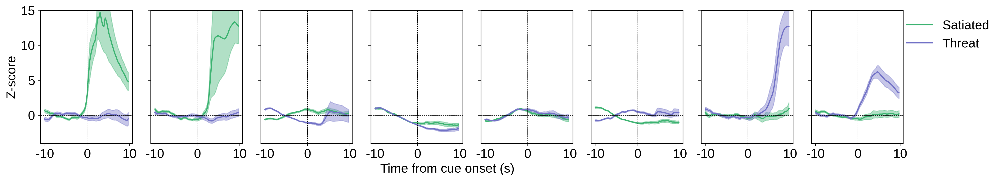

In [135]:
fig, axs = plt.subplots(1, len(uniquelabels),
                        figsize=(2 * len(uniquelabels), 2 * len(trial_types)-1),dpi =300)

numroisincluster = np.nan * np.ones((len(uniquelabels),))
colors = ['mediumseagreen', '#7171C6']
trials = trial_types
lines = []

for c, cluster in enumerate(uniquelabels):
    for k, tempkey in enumerate(trial_types):
        temp = populationdata_satiated[np.where(newlabels_satiated == cluster)[0], k * window_size:(k + 1) * window_size]
        numroisincluster[c] = temp.shape[0]

        mean_temp = np.mean(temp, axis=0)
        std_temp = np.std(temp, axis=0)/np.sqrt(len(temp))

        # Store the Line2D instances for creating the legend later
        line, = axs[cluster].plot(mean_temp, label= trials[k], color= colors[k])
        lines.append(line)

        axs[cluster].fill_between(range(len(mean_temp)), mean_temp - std_temp, mean_temp + std_temp,
                                     color=colors[k], alpha=0.4)

        #axs[cluster].grid(True)
        if k == len(trial_types) - 1:
            axs[cluster].set_xticks([0, pre_window_size,
                                        pre_window_size + frames_to_reward, window_size])
        else:
            axs[cluster].set_xticks([])

        axs[cluster].tick_params(width=0.5)
        axs[cluster].set_xticks([0, pre_window_size,
                                     pre_window_size + frames_to_reward, window_size])

        axs[cluster].set_xticklabels([str(int(round((a-pre_window_size+0.0)/framerate)))
                                          for a in [0, pre_window_size,
                                                    pre_window_size + frames_to_reward, window_size]])
        #axs[k, cluster].set_yticks()
        axs[cluster].set_ylim(-4,15)
        axs[cluster].axvline(pre_window_size, linestyle='--', color='k', linewidth=0.5)
        axs[cluster].axhline(0, linestyle='--', color='k', linewidth=0.5)
        #axs[cluster].axvline(pre_window_size + frames_to_reward, linestyle='--', color='k', linewidth=0.5)
        if cluster != 0:
            axs[cluster].set_yticklabels([])
        if cluster == 0:
            axs[0].set_ylabel('Z-score', fontsize = 16)
 
#     axs[cluster].set_title('Cluster %d\n(n=%d)' % (cluster + 1, numroisincluster[c]), fontsize = 16)
    axs[cluster].tick_params(labelsize=16)

# Create the legend at the end, outside of the loop
fig.legend(lines, trials,frameon = False, loc='center right', bbox_to_anchor=(0.592, 0.53, 0.5, 0.5), fontsize = 16 )

fig.text(0.49, 0, 'Time from cue onset (s)', fontsize=16,
         horizontalalignment='center', verticalalignment='center', rotation='horizontal')

fig.subplots_adjust(wspace=0.2, hspace=0.1)
fig.subplots_adjust(left=0.03)
fig.subplots_adjust(right=0.93)
fig.subplots_adjust(bottom=0.2)
fig.subplots_adjust(top=0.83)

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_cluster_satiated_vs_threat_line.svg", transparent=True,  bbox_inches='tight')

plt.show()

/tmp/ipykernel_68145/1271029083.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_for_cluster = [desaturate_color(cm.get_cmap("tab20")(i / 20.0), 0.7) for i in range(0,20)]


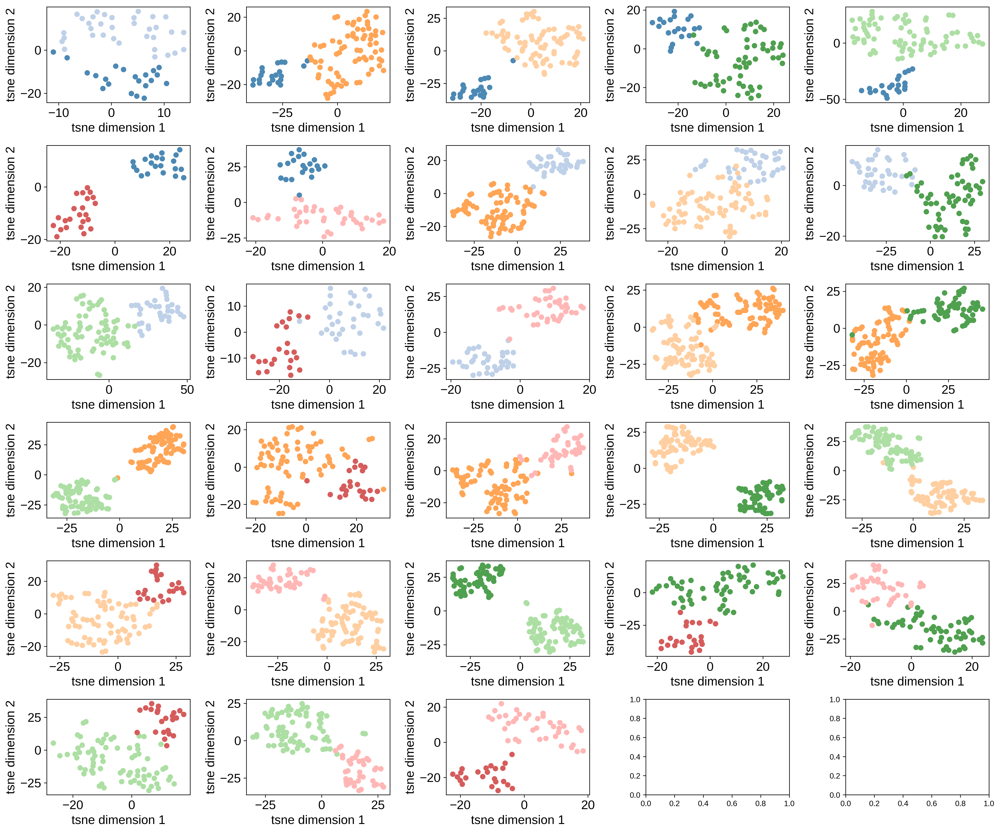

In [136]:
colors_for_cluster = [[0.933, 0.250, 0.211],
                      [0.941, 0.352, 0.156],
                      [0.964, 0.572, 0.117],
                      [0.980, 0.686, 0.250],
                      [0.545, 0.772, 0.247],
                      [0.215, 0.701, 0.290],
                      [0, 0.576, 0.270],
                      [0, 0.650, 0.611],
                      [0.145, 0.662, 0.878]]
def desaturate_color(rgb_color, saturation_factor):
    # Convert RGB to HSV
    hsv_color = rgb_to_hsv(rgb_color[:3])  # Exclude the alpha value if present
    # Reduce the saturation component
    hsv_color[1] *= saturation_factor
    # Convert back to RGB and return with original alpha if it was included
    return hsv_to_rgb(hsv_color)


colors_for_cluster = [desaturate_color(cm.get_cmap("tab20")(i / 20.0), 0.7) for i in range(0,20)]

num_clusterpairs = len(uniquelabels)*(len(uniquelabels)-1)/2

numrows = int(np.ceil(num_clusterpairs**0.5))
numcols = int(np.ceil(num_clusterpairs/np.ceil(num_clusterpairs**0.5)))
fig, axs = plt.subplots(numrows, numcols, figsize=(3*numrows, 3*numcols), dpi =300)

tempsum = 0
for c1, cluster1 in enumerate(uniquelabels):
    for c2, cluster2 in enumerate(uniquelabels):
        if cluster1>=cluster2:
            continue
        temp1 = transformed_data[np.where(newlabels_satiated==cluster1)[0], :num_retained_pcs]
        temp2 = transformed_data[np.where(newlabels_satiated==cluster2)[0], :num_retained_pcs]
        X = np.concatenate((temp1, temp2), axis=0)
        tsne = TSNE(n_components=2, init='random',
                    random_state=0, perplexity=X.shape[1]-1)
        Y = tsne.fit_transform(X)
        if numrows * numcols == 1:
            ax = axs
        else:
            ax = axs[tempsum // numcols, tempsum - (tempsum // numcols) * numcols]


        ax.scatter(Y[:np.sum(newlabels_satiated==cluster1),0],
                   Y[:np.sum(newlabels_satiated==cluster1),1],
                   color=colors_for_cluster[cluster1], alpha=1)
        ax.scatter(Y[np.sum(newlabels_satiated==cluster1):,0],
                   Y[np.sum(newlabels_satiated==cluster1):,1],
                   color=colors_for_cluster[cluster2], alpha=1)

        ax.set_xlabel('tsne dimension 1', fontsize = 16)
        ax.set_ylabel('tsne dimension 2', fontsize = 16)
        ax.tick_params(labelsize = 16)
#         ax.legend(fontsize = 13, frameon = False)
        tempsum += 1
fig.tight_layout()

# plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_cluster_satiated_vs_threat_tsne.svg", transparent=True,  bbox_inches='tight')


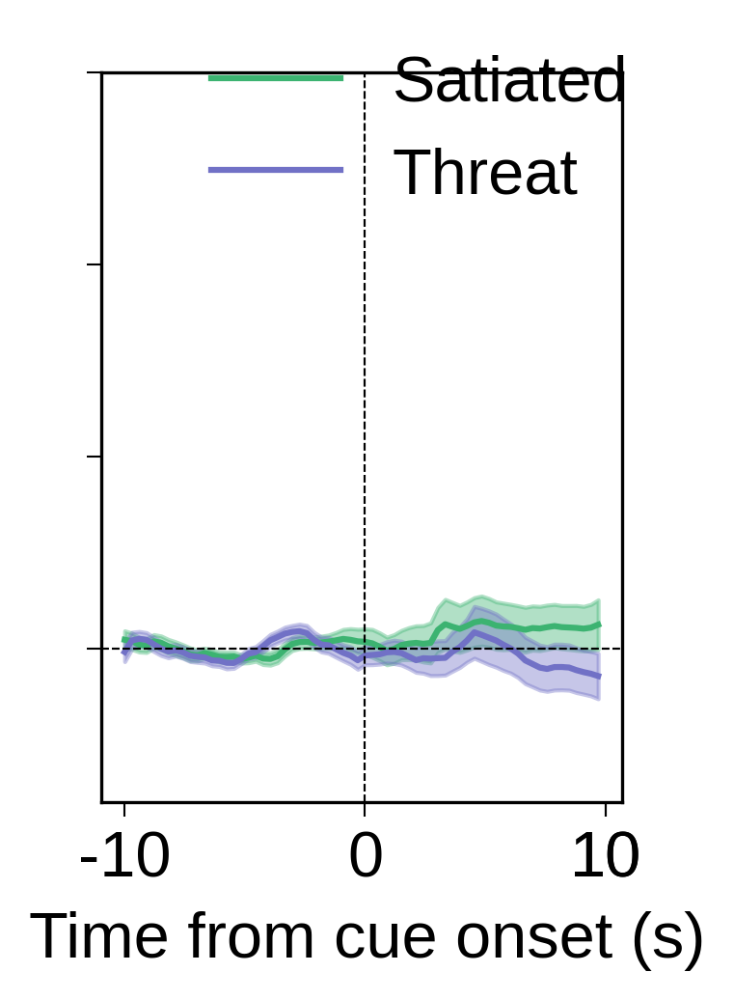

In [150]:
fig, axs = plt.subplots(1, len(uniquelabels[-1:]),
                        figsize=(2 * len(uniquelabels[-1:]), 2 * len(trial_types)),dpi =300)

numroisincluster = np.nan * np.ones((len(uniquelabels),))
colors = ['mediumseagreen', '#7171C6']
trials = trial_types
lines = []

cluster = uniquelabels[-1]
c = 0
for k, tempkey in enumerate(trial_types):
    temp = populationdata_satiated[cluster8_inhungry, k * window_size:(k + 1) * window_size]
    numroisincluster[c] = temp.shape[0]

    mean_temp = np.mean(temp, axis=0)
    std_temp = np.std(temp, axis=0)/np.sqrt(len(temp))

    # Store the Line2D instances for creating the legend later
    line, = axs.plot(mean_temp, label= trials[k], color= colors[k])
    lines.append(line)

    axs.fill_between(range(len(mean_temp)), mean_temp - std_temp, mean_temp + std_temp,
                                 color=colors[k], alpha=0.4)

    #axs[cluster].grid(True)
    if k == len(trial_types) - 1:
        axs.set_xticks([0, pre_window_size,
                                    pre_window_size + frames_to_reward, window_size])
    else:
        axs.set_xticks([])

    axs.tick_params(width=0.5)
    axs.set_xticks([0, pre_window_size,
                                 pre_window_size + frames_to_reward, window_size])

    axs.set_xticklabels([str(int(round((a-pre_window_size+0.0)/framerate)))
                                      for a in [0, pre_window_size,
                                                pre_window_size + frames_to_reward, window_size]])
    #axs[k, cluster].set_yticks()
    axs.set_ylim(-4,15)
    axs.axvline(pre_window_size, linestyle='--', color='k', linewidth=0.5)
    axs.axhline(0, linestyle='--', color='k', linewidth=0.5)
    #axs[cluster].axvline(pre_window_size + frames_to_reward, linestyle='--', color='k', linewidth=0.5)
    if cluster != 0:
        axs.set_yticklabels([])
    if cluster == 0:
        axs[0].set_ylabel('Z-score', fontsize = 16)

#     axs[cluster].set_title('Cluster %d\n(n=%d)' % (cluster + 1, numroisincluster[c]), fontsize = 16)
axs.tick_params(labelsize=16)

# Create the legend at the end, outside of the loop
fig.legend(lines, trials,frameon = False, loc='center right', bbox_to_anchor=(0.54, 0.53, 0.5, 0.5), fontsize = 16 )

fig.text(0.49, 0.08, 'Time from cue onset (s)', fontsize=16,
         horizontalalignment='center', verticalalignment='center', rotation='horizontal')

fig.subplots_adjust(wspace=0.2, hspace=0.1)
fig.subplots_adjust(left=0.03)
fig.subplots_adjust(right=0.93)
fig.subplots_adjust(bottom=0.2)
fig.subplots_adjust(top=0.83)

plt.show()

In [495]:
populationdatas = []
populationdatas.append(populationdata)
populationdatas.append(populationdata_satiated)
populationdatas

[array([[-2.32640867, -1.93585597, -1.31251369, ...,  4.44663999,
          4.21023265,  3.99824003],
        [-1.62177772, -1.57391831, -1.09563558, ...,  4.44663999,
          4.21023265,  3.99824003],
        [-0.76161503, -0.84614766, -0.91091002, ...,  6.28167336,
          6.9314816 ,  6.69343412],
        ...,
        [-0.6622342 , -0.68191757, -0.69898035, ..., -2.02794067,
         -2.17750484, -2.30785512],
        [ 0.7417406 ,  0.35602804,  0.01991057, ...,  1.93573766,
          1.71535509,  1.36345098],
        [ 0.        ,  0.        ,  0.        , ..., -1.28603781,
         -1.41033591, -1.53756105]]),
 array([[ 2.09014346,  1.89047442,  1.70040889, ..., -0.50464756,
         -0.62631931, -0.76560259],
        [-0.65276964, -0.45387318, -0.50668327, ..., -0.50464756,
         -0.62631931, -0.76560259],
        [ 1.07226683,  1.69840739,  1.99859503, ..., -2.98613615,
         -3.0684503 , -3.22705399],
        ...,
        [-1.44114198, -1.30920774, -1.17820647, ...,  

/tmp/ipykernel_3802859/1297936060.py:68: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


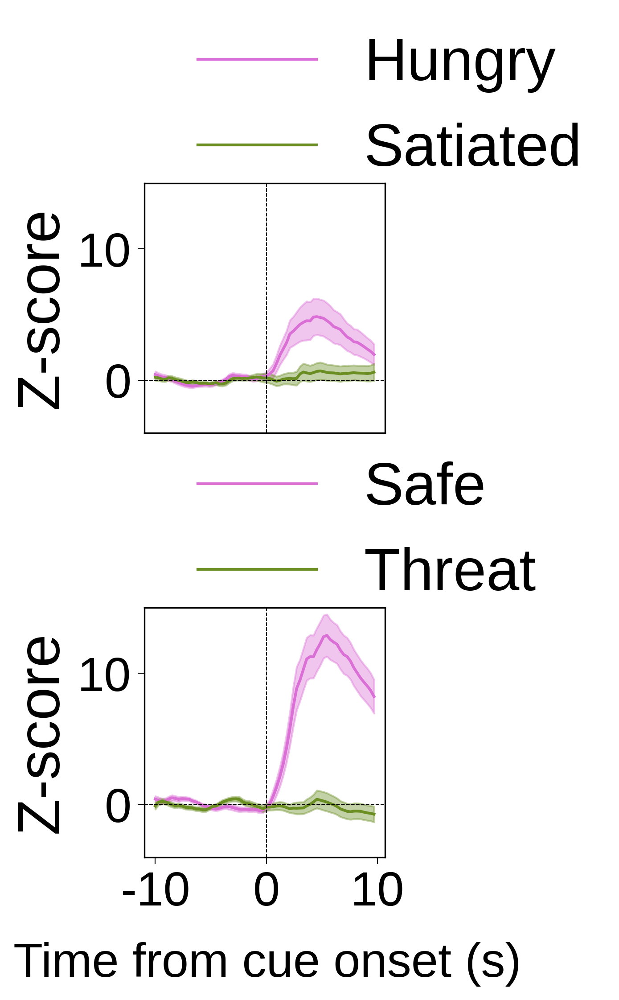

In [497]:
fig, axs = plt.subplots(len(populationdatas),1,
                        figsize=(len(trial_types), 4 * len(populationdatas),),dpi =300)

numroisincluster = np.nan * np.ones((len(populationdatas),))
colors = ['orchid', 'olivedrab']
trials = trial_types
trials_all = [['Hungry','Satiated'], ['Safe', 'Threat']]
lines = []

for c in range(len(populationdatas)):
    for k, tempkey in enumerate(trial_types):
        temp = populationdatas[k][cluster8_inhungry, c * window_size:(c + 1) * window_size]
        numroisincluster[c] = temp.shape[0]

        mean_temp = np.mean(temp, axis=0)
        std_temp = np.std(temp, axis=0)/np.sqrt(len(temp))

        # Store the Line2D instances for creating the legend later
        line, = axs[c].plot(mean_temp, label= trials[k], color= colors[k])
        lines.append(line)

        axs[c].fill_between(range(len(mean_temp)), mean_temp - std_temp, mean_temp + std_temp,
                                     color=colors[k], alpha=0.4)

        #axs[cluster].grid(True)
        if c == len(trial_types) - 1:
            axs[c].set_xticks([0, pre_window_size,
                                        pre_window_size + frames_to_reward, window_size])
            axs[c].set_xticklabels([str(int(round((a-pre_window_size+0.0)/framerate)))
                                          for a in [0, pre_window_size,
                                                    pre_window_size + frames_to_reward, window_size]])
        else:
            axs[c].set_xticks([])

        axs[c].tick_params(width=0.5)
#         axs[c].set_xticks([0, pre_window_size,
#                                      pre_window_size + frames_to_reward, window_size])

#         axs[c].set_xticklabels([str(int(round((a-pre_window_size+0.0)/framerate)))
#                                           for a in [0, pre_window_size,
#                                                     pre_window_size + frames_to_reward, window_size]])
        #axs[k, cluster].set_yticks()
        axs[c].set_ylim(-4,15)
        axs[c].axvline(pre_window_size, linestyle='--', color='k', linewidth=0.5)
        axs[c].axhline(0, linestyle='--', color='k', linewidth=0.5)
        #axs[cluster].axvline(pre_window_size + frames_to_reward, linestyle='--', color='k', linewidth=0.5)
#         if c != 0:
#             axs[c].set_yticklabels([])
#         if c == 0:
        axs[c].set_ylabel('Z-score', fontsize = 32)
#     axs[cluster].set_title('Cluster %d\n(n=%d)' % (cluster + 1, numroisincluster[c]), fontsize = 16)
    axs[c].legend(lines, trials_all[c], frameon = False, loc='upper left', bbox_to_anchor=(0, 1.8), fontsize = 32 )

    axs[c].tick_params(labelsize=26)

# Create the legend at the end, outside of the loop
# fig.legend(lines, trials,frameon = False, loc='center right', bbox_to_anchor=(0.54, 0.53, 0.5, 0.5), fontsize = 16 )

fig.text(0.49, 0.1, 'Time from cue onset (s)', fontsize=26,
         horizontalalignment='center', verticalalignment='center', rotation='horizontal')

fig.subplots_adjust(wspace=0.1, hspace=0.7)
fig.subplots_adjust(left=0.03)
fig.subplots_adjust(right=0.93)
fig.subplots_adjust(bottom=0.2)
fig.subplots_adjust(top=0.83)

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig4/fig4_cluster8_lines.svg", transparent=True,  bbox_inches='tight')

plt.show()